<a href="https://colab.research.google.com/github/SergeiVKalinin/Research-Projects/blob/main/DKL_hAE/Forensic_DKL_EELS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Forensic DKL analysis: STEM-EELS

* Data collected on the MACSTEM @ ORNL:
* @`60 kV` and  `~30 mrad` semiconvergence angle. Monochromated FWHM's varying from 10 meV to 160 meV. Probe current of ~50 pA depending on level of monochromation
______
* Experiments conducted using `Nion SWIFT` and python codes to control microscope operation.
______
* Samples grown and prepared by `Shin Hum Cho` and `Delia Milliron` @ `UT @ Austin`
* Microscopy performed by `Kevin Roccapriore` @ `ORNL`
* Microscopy conducted as part of the User Program at the `Center for Nanophase Materials Sciences`

# **Import and Download data**

In [ ]:
#@title Install
%%capture
!pip install -q git+https://github.com/pycroscopy/atomai.git
!pip install atomai
!pip install -q --upgrade git+https://github.com/ziatdinovmax/gpax

In [ ]:
#@title Import
import numpy as np
import matplotlib.pyplot as plt
import gpax
import numpyro
import jax
import jax.numpy as jnp
import math
import atomai as aoi
import torch
import os
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle

from atomai import utils
from sklearn.model_selection import train_test_split

In [ ]:
#@title Load helper functions
from typing import Tuple

def make_window(imgsrc: np.ndarray, window_size: int,
                xpos: int, ypos: int) -> np.ndarray:
    """
    Returns the portion of the image within the window given the
    image (imgsrc), the x position and the y position
    """
    imgsrc = imgsrc[int(xpos-window_size/2):int(xpos+window_size/2),
                    int(ypos-window_size/2):int(ypos+window_size/2)]
    return imgsrc

def create_training_set(imgdata: np.ndarray, target: np.ndarray,
                        window_size: int) -> Tuple[np.ndarray]:
    """
    Creates arrays with features (local subimages)
    and targets (corresponding spectra) from hyperspectral data
    """
    feature_arr, target_arr = [], []
    pos = []
    s1, s2 = imgdata.shape[:-1]
    for i in range(s1):
        for j in range(s2):
            arr_loc = make_window(imgdata, window_size, i, j)
            if arr_loc.shape[:-1] != (window_size, window_size):
                continue
            feature_arr.append(arr_loc)
            target_arr.append(target[i, j])
            pos.append([i, j])
    return np.array(pos), np.array(feature_arr), np.array(target_arr)

from typing import Tuple, Optional, Dict, Union, List

def get_imgstack(imgdata: np.ndarray,
                 coord: np.ndarray,
                 r: int) -> Tuple[np.ndarray]:
    """
    Extracts subimages centered at specified coordinates
    for a single image
    Args:
        imgdata (3D numpy array):
            Prediction of a neural network with dimensions
            :math:`height \\times width \\times n channels`
        coord (N x 2 numpy array):
            (x, y) coordinates
        r (int):
            Window size
    Returns:
        2-element tuple containing
        - Stack of subimages
        - (x, y) coordinates of their centers
    """
    img_cr_all = []
    com = []
    for c in coord:
        cx = int(np.around(c[0]))
        cy = int(np.around(c[1]))
        if r % 2 != 0:
            img_cr = np.copy(
                imgdata[cx-r//2:cx+r//2+1,
                        cy-r//2:cy+r//2+1])
        else:
            img_cr = np.copy(
                imgdata[cx-r//2:cx+r//2,
                        cy-r//2:cy+r//2])
        if img_cr.shape[0:2] == (int(r), int(r)) and not np.isnan(img_cr).any():
            img_cr_all.append(img_cr[None, ...])
            com.append(c[None, ...])
    if len(img_cr_all) == 0:
        return None, None
    img_cr_all = np.concatenate(img_cr_all, axis=0)
    com = np.concatenate(com, axis=0)
    return img_cr_all, com


def extract_subimages(imgdata: np.ndarray,
                      coordinates: Union[Dict[int, np.ndarray], np.ndarray],
                      window_size: int, coord_class: int = 0) -> Tuple[np.ndarray]:

    if isinstance(coordinates, np.ndarray):
        coordinates = np.concatenate((
            coordinates, np.zeros((coordinates.shape[0], 1))), axis=-1)
        coordinates = {0: coordinates}
    if np.ndim(imgdata) == 2:
        imgdata = imgdata[None, ..., None]
    subimages_all, com_all, frames_all = [], [], []
    for i, (img, coord) in enumerate(
            zip(imgdata, coordinates.values())):
        coord_i = coord[np.where(coord[:, 2] == coord_class)][:, :2]
        stack_i, com_i = get_imgstack(img, coord_i, window_size)
        if stack_i is None:
            continue
        subimages_all.append(stack_i)
        com_all.append(com_i)
        frames_all.append(np.ones(len(com_i), int) * i)
    if len(subimages_all) > 0:
        subimages_all = np.concatenate(subimages_all, axis=0)
        com_all = np.concatenate(com_all, axis=0)
        frames_all = np.concatenate(frames_all, axis=0)

    return subimages_all, com_all, frames_all

def extract_patches_and_spectra(hdata: np.ndarray, *args: np.ndarray,
                                coordinates: np.ndarray = None,
                                window_size: int = None,
                                avg_pool: int = 2,
                                **kwargs: Union[int, List[int]]
                                ) -> Tuple[np.ndarray]:
    """
    Extracts image patches and associated spectra
    (corresponding to patch centers) from hyperspectral dataset
    Args:
        hdata:
            3D or 4D hyperspectral data
        *args:
            2D image for patch extraction. If not provided, then
            patches will be extracted from hyperspectral data
            averaged over a specified band (range of "slices")
        coordinates:
            2D numpy array with xy coordinates
        window_size:
            Image patch size
        avg_pool:
            Kernel size and stride for average pooling in spectral dimension(s)
        **band:
            Range of slices in hyperspectral data to average over
            for producing a 2D image if the latter is not provided as a separate
            argument. For 3D data, it can be integer (use a single slice)
            or a 2-element list. For 4D data, it can be integer or a 4-element list.
        Returns:
            3-element tuple with image patches, associated spectra and coordinates
    """
    F = torch.nn.functional
    if hdata.ndim not in (3, 4):
        raise ValueError("Hyperspectral data must 3D or 4D")
    if len(args) > 0:
        img = args[0]
        if img.ndim != 2:
            raise ValueError("Image data must be 2D")
    else:
        band = kwargs.get("band", 0)
        if hdata.ndim == 3:
            if isinstance(band, int):
                band = [band, band+1]
            img = hdata[..., band[0]:band[1]].mean(-1)
        else:
            if isinstance(band, int):
                band = [band, band+1, band, band+1]
            elif isinstance(band, list) and len(band) == 2:
                band = [*band, *band]
            img = hdata[..., band[0]:band[1], band[2]:band[3]].mean((-2, -1))
    patches, coords, _ = extract_subimages(img, coordinates, window_size)
    patches = patches.squeeze()
    spectra = []
    for c in coords:
        spectra.append(hdata[int(c[0]), int(c[1])])
    avg_pool = 2*[avg_pool] if (isinstance(avg_pool, int) & hdata.ndim == 4) else avg_pool
    torch_pool = F.avg_pool1d if hdata.ndim == 3 else F.avg_pool2d
    spectra = torch.tensor(spectra).cpu().unsqueeze(1)
    spectra = torch_pool(spectra, avg_pool, avg_pool).squeeze().numpy()
    return patches, spectra, coords

In [ ]:
#@title DKL specific functions

def plot_dkl(full_img, window_size, y,
             dkl_mean, dkl_var):

    plt.figure(figsize=(15,15))
    gs = gridspec.GridSpec(1,3,width_ratios = [1,1,1])
    ax00,ax01,ax02 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]), plt.subplot(gs[0,2])

    s1, s2 = full_img.shape[0] - window_size+1, full_img.shape[1] - window_size+1

    if y.ndim == 1:   # Scalar DKL
        original    = y.reshape(s1,s2)
        predicted   = dkl_mean.reshape(s1,s2)
        uncertainty = dkl_var.reshape(s1,s2)

    elif y.ndim == 2: # Vector DKL
        original    = np.swapaxes(y.reshape(-1,s1,s2).T, 0, 1)
        predicted   = np.swapaxes(dkl_mean.reshape(-1,s1,s2).T, 0, 1)
        uncertainty = np.swapaxes(dkl_var.reshape(-1,s1,s2).T, 0, 1)

    ax00.imshow(original)
    ax01.imshow(predicted)
    ax02.imshow(uncertainty)

    ax00.set_title("original")
    ax01.set_title("mean (prediction)")
    ax02.set_title("variance (uncertainty)")

    if y.ndim == 2: # we can show individual spectra. Otherwise, we've already scalarized it

        rng = np.random.default_rng()
        xx_ = rng.choice(s1, 3, replace = False)
        yy_ = rng.choice(s2, 3, replace = False)
        XY = np.asarray([xx_,yy_]).T

        x1,y1 = XY[0]
        x2,y2 = XY[1]
        x3,y3 = XY[2]

        ax00.scatter(x1,y1, c='dodgerblue', ec='k', s=100)
        ax00.scatter(x2,y2, c='darkorange', ec='k', s=100)
        ax00.scatter(x3,y3, c='crimson', ec='k', s=100)

        plt.figure(figsize=(10,5))
        ax = plt.gca()

        ax.plot(original[y1,x1], c='dodgerblue', lw = 2, ls ='--')
        ax.plot(original[y2,x2], c='darkorange', lw = 2, ls ='--')
        ax.plot(original[y3,x3], c='crimson', lw = 2, ls ='--')

        ax.plot(predicted[y1,x1], c='dodgerblue', lw = 2)
        ax.plot(predicted[y2,x2], c='darkorange', lw = 2)
        ax.plot(predicted[y3,x3], c='crimson', lw = 2)

        ax.axhline(0, c='k')
        ax.set_xlabel("Energy loss (eV)", fontsize = 22)
        ax.tick_params(length=5, width=3, labelsize = 18)





from typing import Union

def EI(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
       best_f: Union[float, torch.Tensor], xi: float = 0.01) -> np.ndarray:
    """
    Expected Improvement
    """
    device=model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    best_f = torch.from_numpy(best_f) if isinstance(best_f, float) else best_f
    posterior = model._compute_posterior(X.to(dtype).to(device))
    samples = posterior.rsample(torch.Size([1000, ]))
    mean, sigma = samples.mean(0), samples.var(0).sqrt()
    u = (mean - best_f.expand_as(mean) - xi) / sigma
    normal = torch.distributions.Normal(torch.zeros_like(u), torch.ones_like(u))
    ucdf = normal.cdf(u)
    updf = torch.exp(normal.log_prob(u))
    obj = sigma * (updf + u * ucdf)
    return obj.detach().cpu().numpy()


def qEI(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
        best_f: Union[float, torch.Tensor], xi: float = 0.01,
        **kwargs: int) -> np.ndarray:
    """
    MC-based Expected Improvement
    """
    device = model.device
    dtype = model.dtype
    sampler = botorch.sampling.SobolQMCNormalSampler(500, kwargs.get("seed", 42))
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    best_f = torch.from_numpy(best_f) if isinstance(best_f, float) else best_f
    posterior = model.gp_model.posterior(X.to(dtype).to(device))
    samples = sampler(posterior)
    objective = botorch.acquisition.IdentityMCObjective()
    obj = objective(samples)
    obj = (obj - best_f.unsqueeze(-1).to(obj) - xi).clamp_min(0).detach().cpu()
    return obj.numpy()

def UCB(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
        beta: float = 0.2) -> np.ndarray:
    """
    Upper confidence bound
    """
    device = model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    beta = torch.tensor(beta) if isinstance(beta, float) else beta
    posterior = model._compute_posterior(X.to(dtype).to(device))
    samples = posterior.rsample(torch.Size([1000, ]))
    mean, var = samples.mean(0), samples.var(0)
    delta = (beta.expand_as(mean).to(dtype).to(device) * var).sqrt()
    return (mean + delta).detach().cpu().numpy()

def qUCB(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
         beta: float = 0.2, **kwargs: int) -> np.ndarray:
    """
    MC-based upper confidence bound
    """
    device = model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    beta_prime = math.sqrt(beta * math.pi / 2)
    posterior = model.gp_model.posterior(X.to(dtype).to(device))
    sampler = botorch.sampling.SobolQMCNormalSampler(500, kwargs.get("seed", 42))
    samples = sampler(posterior)
    objective = botorch.acquisition.IdentityMCObjective()
    obj = objective(samples)
    mean = obj.mean(dim=0)
    obj = mean + beta_prime * (obj - mean).abs()
    return obj.detach().cpu().numpy()


#@title Functions for plotting result, selecting next measurement point, and update train/test dataset
def sel_next_point (dklgp, X_train, X_test, xi):
  '''
  Function selects next_point_idx based on either EI
  acquision function (0) or maximum uncertainty point (1)
  '''
  global acq_idx
  if acq_idx == 0:  # 0 uses EI function
    best_f = torch.tensor(dklgp.predict(X_train)[0].max(), device=dklgp.device)
    obj = EI(dklgp, X_test, best_f, xi)
    next_point_idx = obj.mean(0).argmax()
  elif acq_idx == 1:  # 1 explores the max uncertainty point
    mean0, var0 = dklgp.predict(X_test, batch_size=len(X_test))
    next_point_idx = var0.argmax()
  elif acq_idx == 2:  # 2 uses UCB function
    obj = UCB(dklgp, X_test)
    next_point_idx = obj.mean(0).argmax()

  return next_point_idx

def update_train_test_data(X_train, X_test, y_train, y_test,
                           indices_train, indices_test,
                           next_point_idx, measured_point, next_point):
  X_train = np.append(X_train, X_test[next_point_idx][None], 0)
  X_test = np.delete(X_test, next_point_idx, 0)
  y_train = np.append(y_train, measured_point)
  y_test = np.delete(y_test, next_point_idx)
  indices_train = np.append(indices_train, next_point[None], 0)
  indices_test = np.delete(indices_test, next_point_idx, 0)

  return (X_train, X_test, y_train, y_test, indices_train, indices_test)



#@title define a function to run DKL exploration
def dkl_explore (save_explore, num_cycles = 200):
  global X, y, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws
  # Here X_train and y_train are our measured image patches and spectra information,
  # whereas X_test and y_test are the "unkwown" ones. The indices_train are grid coordinates of the measured points,
  # whereas the indices_test are the grid coordinates of the remaining available points on the grid
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)
  print('X_train shape: '); print(X_train.shape)
  data_dim = X_train.shape[-1]

  if not os.path.exists(rf + acq_funcs[acq_idx] + save_explore):
    os.mkdir(rf + acq_funcs[acq_idx] + save_explore)
  os.chdir(rf + acq_funcs[acq_idx] + save_explore)
  np.savez("initial_traindata.npz", X_train = X_train, X_test = X_test, y_train = y_train,
           y_test = y_test, indices_train = indices_train, indices_test = indices_test)

  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # Update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=num_cycles)

    mean, var = dklgp.predict(X, batch_size=len(X))
    # plot_dkl_result(y, mean, var, indices=indices_train,
    #                 ws = ws, scatter_location = True)

    plot_dkl(img, window_size, y, mean, var)
    # Compute acquisition function
    next_point_idx = sel_next_point (dklgp, X_train, X_test, xi)
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[next_point_idx]
    # Plot current result

    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train,
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test,
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point)

    # Save result
    np.savez("record{}.npz".format(e),
             mean = mean, var = var, next_point_idx = next_point_idx,
             next_point = next_point, measured_point = measured_point)
  # Save final traindata
  np.savez("final_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)





def dkl_counterfactual(y, save_counter, num_cycles = 200):
  global X, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws
  # Initialize train/test datasets
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)

  # Set path for saving result
  if not os.path.exists(rf + acq_funcs[acq_idx] + save_counter):
    os.mkdir(rf + acq_funcs[acq_idx] + save_counter)

  # Save initial train data
  os.chdir(rf + acq_funcs[acq_idx] + save_counter)
  np.savez("initial_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)

  # Start DKL analysis
  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=num_cycles, lr = 0.01)

    mean, var = dklgp.predict(X, batch_size=len(X))
    # plot_dkl_result(y, mean, var, indices=indices_train,
    #                 ws = ws, scatter_location = True)
    plot_dkl(img, window_size, y, mean, var)

    #########################################################
    #################### Critical step ######################
    #########################################################

    # Load measurement locations from Step 1
    os.chdir(rf + acq_funcs[acq_idx] + save_explore)
    rec = np.load("record{}.npz".format(e))
    next_point_idx = rec['next_point_idx']
    next_point = indices_test[next_point_idx]
    #########################################################
    #########################################################

    # Do "measurement"
    measured_point = y_test[next_point_idx]

    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train,
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test,
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point)

    # Save result
    os.chdir(rf + acq_funcs[acq_idx] + save_counter)
    np.savez("record{}.npz".format(e),
             mean = mean, var = var, next_point_idx = next_point_idx,
             next_point = next_point, measured_point = measured_point)

  # Save final traindata
  os.chdir(rf + acq_funcs[acq_idx] + save_counter)
  np.savez("final_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)


#@title define a function to run dkl analysis with random sampling
def dkl_random(y, save_random, num_cycles = 200):
  global X, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws
  # Initialize train/test datasets
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)

  # Set path for saving result
  if not os.path.exists(rf + acq_funcs[acq_idx] + save_random):
    os.mkdir(rf + acq_funcs[acq_idx] + save_random)

  # Save initial train data
  os.chdir(rf + acq_funcs[acq_idx] + save_random)
  np.savez("initial_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)

  # Start DKL analysis
  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=num_cycles, lr = 0.01)

    mean, var = dklgp.predict(X, batch_size=len(X))
    # plot_dkl_result(y, mean, var, indices=indices_train,
    #                 ws = ws, scatter_location = True)
    plot_dkl(img, window_size, y, mean, var)

    #########################################################
    #################### Critical step ######################
    #########################################################
    next_point_idx = np.random.randint(len(X_test))
    next_point = indices_test[next_point_idx]
    #########################################################
    #########################################################

    # Do "measurement"
    measured_point = y_test[next_point_idx]

    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train,
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test,
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point)

    # Save result
    os.chdir(rf + acq_funcs[acq_idx] + save_random)
    np.savez("record{}.npz".format(e),
             mean = mean, var = var, next_point_idx = next_point_idx,
             next_point = next_point, measured_point = measured_point)

  # Save final traindata
  os.chdir(rf + acq_funcs[acq_idx] + save_random)
  np.savez("final_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)




#@title define a function to run dkl counterfactual with different scalarizer
def dkl_mature_full(y, save_mature_full, num_cycles = 200):
  global X, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws

  # Load last step train dataset
  os.chdir(rf + acq_funcs[acq_idx] + save_explore)
  rec = np.load("final_traindata.npz")
  X_train = rec["X_train"]
  y_train = rec["y_train"]

  # Train a matured DKL model with the last step train dataset
  # dklgp0 will be the matured DKL model
  dklgp0 = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
  dklgp0.fit(X_train, y_train, training_cycles=num_cycles)

  # Train a full-informed DKL model with all data
  # dklgp1 will be the full-informed DKL model
  dklgp1 = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
  dklgp1.fit(X, y, training_cycles=num_cycles)

  # Initialize train/test datasets
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)

  # Set path for saving result
  if not os.path.exists(rf + acq_funcs[acq_idx] + save_mature_full):
    os.mkdir(rf + acq_funcs[acq_idx] + save_mature_full)

  # Start DKL analysis
  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    #update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=num_cycles, lr = 0.01)

    mean, var = dklgp.predict(X_test, batch_size=len(X_test))  #real-time DKL model
    mean0, var0 = dklgp0.predict(X_test, batch_size=len(X_test)) #matured DKL model
    mean1, var1 = dklgp1.predict(X_test, batch_size=len(X_test)) #full-informed DKL model

    # Load measurement location from Step 1
    os.chdir(rf + acq_funcs[acq_idx] + save_explore)
    rec = np.load("record{}.npz".format(e))
    next_point_idx = rec['next_point_idx']
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[next_point_idx]

        # Save result
    os.chdir(rf + acq_funcs[acq_idx] + save_mature_full)
    np.savez("record{}.npz".format(e), y_test = y_test,
             mean = mean, var = var,
             mean0 = mean0, var0 = var0,
             mean1 = mean1, var1 = var1)

    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train,
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test,
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point = next_point)


In [ ]:
#@title  Download STEM-EELS data
%%capture
!wget https://www.dropbox.com/s/nicyvttpihzh1cd/Plasmonic_sets_7222021_fixed.npy
NPs = np.load("Plasmonic_sets_7222021_fixed.npy", allow_pickle=True).tolist()

In [ ]:
## Inspect the data structure

print(f"Keys in NPs: {NPs.keys()}\n")

for key,val in NPs['1'].items():
    print(key)

Keys in NPs: dict_keys(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12'])

image
spectrum image
energy axis
scale


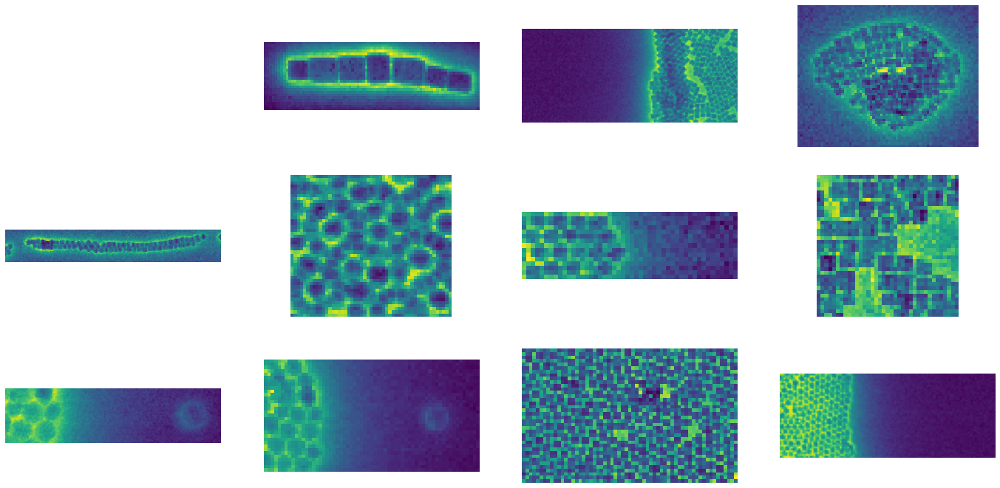

In [ ]:
## Survey the data ##

num_im = len(NPs)

rows = int(np.ceil(float(num_im)/5))
cols = int(np.ceil(float(num_im)/rows))

gs = gridspec.GridSpec(rows, cols)
fig = plt.figure(figsize = (6*cols, 3*(1+rows)))
for kk in range(1,num_im):
    ax = fig.add_subplot(gs[kk])
    img = np.mean(NPs['{}'.format(kk)]['spectrum image'], axis=2)
    ax.imshow(img)
    ax.axis('off')

(25, 79, 3661)

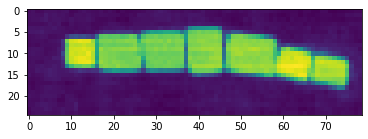

In [ ]:
key = 1

specim   = NPs[f'{key}']['spectrum image']
eax      = NPs[f'{key}']['energy axis']
pxsizenm = NPs[f'{key}']['scale']
img      = NPs[f'{key}']['image']

plt.imshow(img)
specim.shape

In [ ]:
window_size       = 8           # select window size for geometric feature length scales
spectralavg       = 4            # default: 4. average spectral channels (reduces # of channels significantly --> easier to process! usually don't need 2048 ch, a few hundred I think are sufficient - depends on your feature spectral sizes really))


coordinates = aoi.utils.get_coord_grid(img, step = 1, return_dict=False)
patches, spectra, coords = extract_patches_and_spectra(specim, img,
                                                       coordinates=coordinates,
                                                       window_size=window_size,
                                                    #  band=[0, 2], # average over these slices and use as "structural data"
                                                       avg_pool=spectralavg)

print(spectra.shape)
print(coords.shape)
print(patches.shape)

ws = window_size # For convenience later...

(1296, 915)
(1296, 2)
(1296, 8, 8)


<ipython-input-3-b2f3624f08cf>:160: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  spectra = torch.tensor(spectra).cpu().unsqueeze(1)


In [ ]:
# Not necessary, just placing into 'standard' nomenclature

full_img    = np.copy(img)
indices     = np.copy(coords)
features    = np.copy(patches)
targets     = np.copy(spectra)
scale       = np.copy(pxsizenm)

e_axis      = np.copy(eax[::spectralavg])

while e_axis.shape[0] > spectra[0].shape[0]:
  e_axis = e_axis[:-1]

e_axis.shape, targets[0].shape

((915,), (915,))

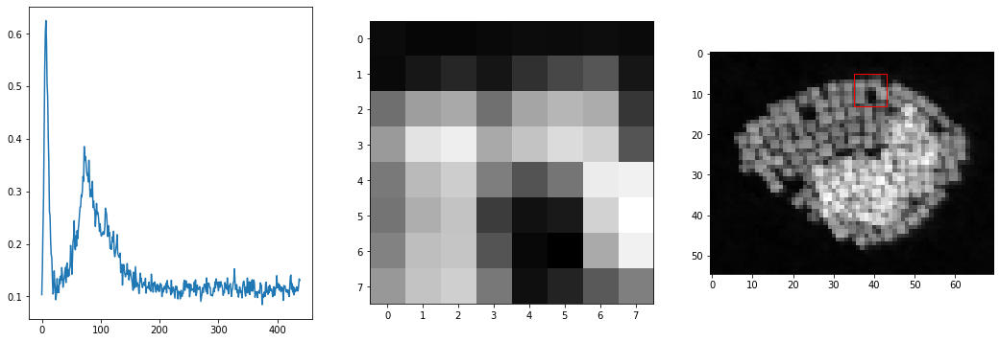

In [ ]:
k = 350

f,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(18,6))
ax1.plot(targets[k])
ax2.imshow(features[k], cmap = 'gray')
ax3.imshow(full_img, cmap = 'gray')
ax3.add_patch(Rectangle([indices[k][1] - window_size / 2, indices[k][0] - window_size / 2], window_size, window_size, fill = False, ec = 'r'))

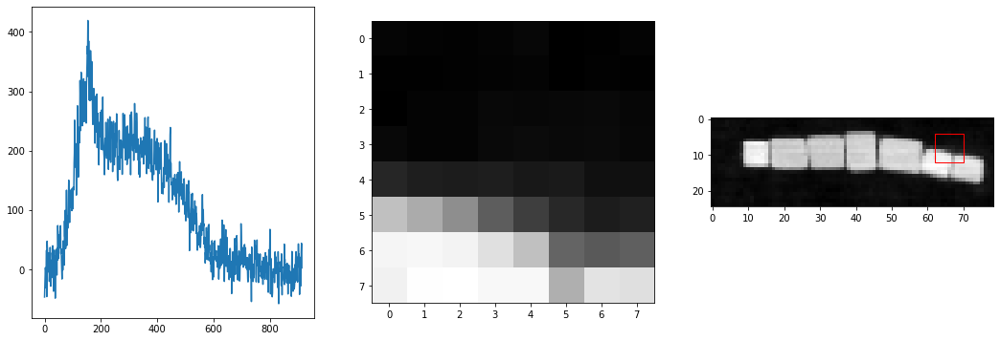

In [ ]:
k = 350

f,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(18,6))
ax1.plot(targets[k])
ax2.imshow(features[k], cmap = 'gray')
ax3.imshow(full_img, cmap = 'gray')
ax3.add_patch(Rectangle([indices[k][1] - window_size / 2, indices[k][0] - window_size / 2], window_size, window_size, fill = False, ec = 'r'))

In [ ]:
features.shape, targets.shape

((1296, 8, 8), (1296, 915))

Normalize data:

In [ ]:
norm_ = lambda x: (x - x.min()) / x.ptp()
features, targets = norm_(features), norm_(targets)

Let's scalarize our vactor-valued targets. Here we are going to do the scalarization by simply using the intensity of largest plasmonic peak but more sophisticated scalar descritpors can be derived as well (ratio of peaks, etc.). First do it for a single spectrum:

#### Gather several different scalarizers:
* Here we choose to integrate a few different energy bands, which tend to represent different plasmon modes

In [ ]:
def normalize(x):
    return (x-np.min(x))/np.ptp(x)

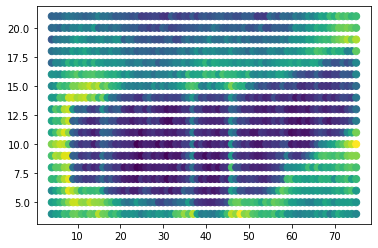

In [ ]:
# (coupled) dipole mode

band = [0.3, 0.4]


e1,e2 = np.abs(band[0] - e_axis).argmin(), np.abs(band[1] - e_axis).argmin()
peaks_all_scalar1, features_all, indices_all = [], [], []
for i, t in enumerate(targets):
    peak = np.max(t[e1:e2])
    peaks_all_scalar1.append(np.array([peak]))
    features_all.append(features[i])
    indices_all.append(indices[i])

peaks_all_scalar1 = normalize(np.concatenate(peaks_all_scalar1))
features_all      = np.array(features_all)
indices_all       = np.array(indices_all)

plt.scatter(indices_all[:, 1], indices_all[:, 0], c=peaks_all_scalar1, s = 50)

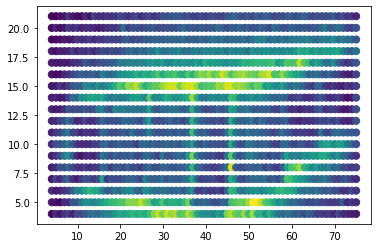

In [ ]:
## Edge mode
band = [0.65, 0.75]


e1,e2 = np.abs(band[0] - e_axis).argmin(), np.abs(band[1] - e_axis).argmin()
peaks_all_scalar2, features_all, indices_all = [], [], []
for i, t in enumerate(targets):
    peak = np.max(t[e1:e2])
    peaks_all_scalar2.append(np.array([peak]))
    features_all.append(features[i])
    indices_all.append(indices[i])

peaks_all_scalar2 = normalize(np.concatenate(peaks_all_scalar2))
features_all      = np.array(features_all)
indices_all       = np.array(indices_all)

plt.scatter(indices_all[:, 1], indices_all[:, 0], c=peaks_all_scalar2, s = 50)

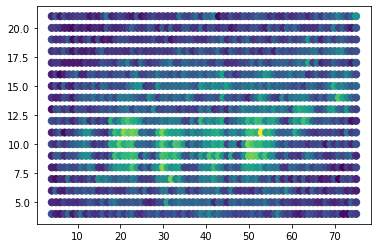

In [ ]:
## Bulk / face mode
band = [0.85, 0.95]


e1,e2 = np.abs(band[0] - e_axis).argmin(), np.abs(band[1] - e_axis).argmin()
peaks_all_scalar3, features_all, indices_all = [], [], []
for i, t in enumerate(targets):
    peak = np.max(t[e1:e2])
    peaks_all_scalar3.append(np.array([peak]))
    features_all.append(features[i])
    indices_all.append(indices[i])

peaks_all_scalar3 = normalize(np.concatenate(peaks_all_scalar3))
features_all      = np.array(features_all)
indices_all       = np.array(indices_all)

plt.scatter(indices_all[:, 1], indices_all[:, 0], c=peaks_all_scalar3, s = 50)

Preprocess:

In [ ]:
dklgp = None  # Reset any model, may help clear memory

y = np.copy(peaks_all_scalar1)
n, d1, d2 = features.shape
X = features.reshape(n, d1*d2)

print(y.shape)#, e_reduced.shape)
print(X.shape)
print(peaks_all_scalar1.shape)

(1296,)
(1296, 64)
(1296,)


Initialize and train DKL-GPR model on the **<font color = 'dodgerblue'>FULL</font>** dataset:

In [ ]:
data_dim = X.shape[-1]

dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp.fit(X, y, training_cycles=200, lr=1e-2)

/usr/local/lib/python3.8/dist-packages/gpytorch/utils/linear_cg.py:266: UserWarning: An output with one or more elements was resized since it had shape [1, 11], which does not match the required output shape [1, 1, 11]. This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at ../aten/src/ATen/native/Resize.cpp:17.)
  _jit_linear_cg_updates_no_precond(


Epoch 1/200 ... Training loss: 0.7781
Epoch 10/200 ... Training loss: 0.7338
Epoch 20/200 ... Training loss: 0.6892
Epoch 30/200 ... Training loss: 0.6498
Epoch 40/200 ... Training loss: 0.6122
Epoch 50/200 ... Training loss: 0.5733
Epoch 60/200 ... Training loss: 0.5334
Epoch 70/200 ... Training loss: 0.4919
Epoch 80/200 ... Training loss: 0.452
Epoch 90/200 ... Training loss: 0.4084
Epoch 100/200 ... Training loss: 0.362
Epoch 110/200 ... Training loss: 0.3221
Epoch 120/200 ... Training loss: 0.2757
Epoch 130/200 ... Training loss: 0.2286
Epoch 140/200 ... Training loss: 0.1855
Epoch 150/200 ... Training loss: 0.1386
Epoch 160/200 ... Training loss: 0.0921
Epoch 170/200 ... Training loss: 0.0479
Epoch 180/200 ... Training loss: 0.0016
Epoch 190/200 ... Training loss: -0.0451
Epoch 200/200 ... Training loss: -0.0934


Create training data (patches with amplitude/phase data as inputs and loop areas as target):

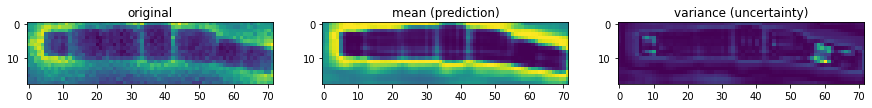

In [ ]:
mean, var = dklgp.predict(X, batch_size=len(X))
plot_dkl(img, window_size, y, mean, var)

(-0.5, 71.5, -0.5, 17.5)

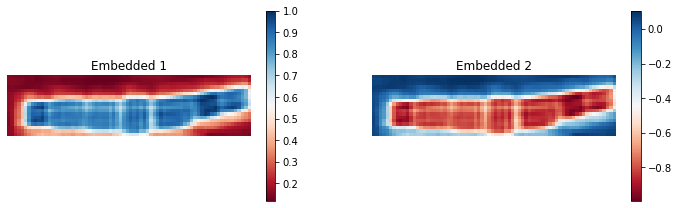

In [ ]:
s1,s2 = img.shape[0] - window_size + 1, img.shape[1] - window_size + 1

embeded = dklgp.embed(X)
embeded = embeded / embeded.max()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

cm = 'RdBu'
shrink = 0.7

im1 = ax1.imshow(embeded[:,0].reshape(s1,s2), interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im1, ax=ax1, shrink = shrink)
ax1.set_title("Embedded 1")
ax1.axis('off')

im2 = ax2.imshow(embeded[:,1].reshape(s1,s2), interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im2, ax=ax2, shrink = shrink)
ax2.set_title("Embedded 2")
ax2.axis('off')

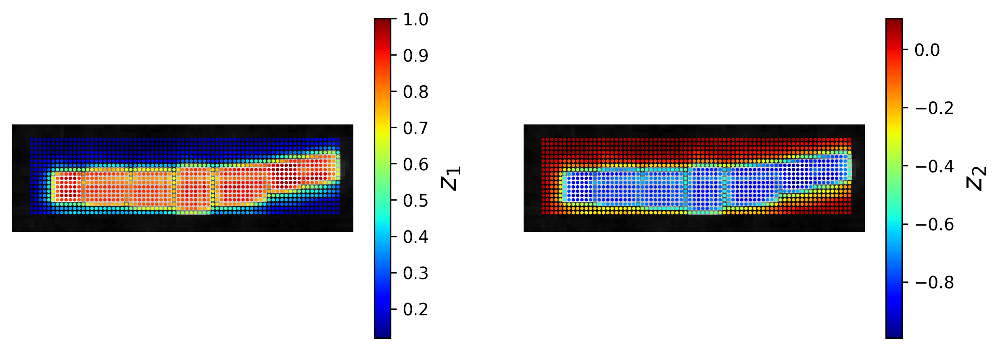

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5), dpi = 300)
ax1.imshow(img, origin = "lower", cmap = 'gray')
im1=ax1.scatter(indices_all[:,1], indices_all[:,0], s=1, c = embeded[:,0].reshape(s1, s2), cmap = 'jet')
ax1.axis(False)
cbar1 = fig.colorbar(im1, ax=ax1, shrink=.7)
cbar1.set_label("$z_1$", fontsize=16)

ax2.imshow(img, origin = "lower", cmap = 'gray')
im2=ax2.scatter(indices_all[:,1], indices_all[:,0], s=1, c = embeded[:,1].reshape(s1, s2), cmap = 'jet')
ax2.axis(False)
cbar2 = fig.colorbar(im2, ax=ax2, shrink=.7)
cbar2.set_label("$z_2$", fontsize=16)


#### Try with 3 embedded dims instead of 2...

In [ ]:
# dklgp = None  # help to clear memory?

In [ ]:
data_dim = X.shape[-1]

dklgp4 = aoi.models.dklGPR(data_dim, embedim=3, precision="double")
dklgp4.fit(X, y, training_cycles=200, lr=1e-2, batch_size = 32)

/usr/local/lib/python3.8/dist-packages/gpytorch/utils/linear_cg.py:266: UserWarning: An output with one or more elements was resized since it had shape [1, 11], which does not match the required output shape [1, 1, 11]. This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at ../aten/src/ATen/native/Resize.cpp:17.)
  _jit_linear_cg_updates_no_precond(


Epoch 1/200 ... Training loss: 0.7546
Epoch 10/200 ... Training loss: 0.7156
Epoch 20/200 ... Training loss: 0.6789
Epoch 30/200 ... Training loss: 0.6401
Epoch 40/200 ... Training loss: 0.6014
Epoch 50/200 ... Training loss: 0.5629
Epoch 60/200 ... Training loss: 0.5211
Epoch 70/200 ... Training loss: 0.4794
Epoch 80/200 ... Training loss: 0.4377
Epoch 90/200 ... Training loss: 0.3931
Epoch 100/200 ... Training loss: 0.3466
Epoch 110/200 ... Training loss: 0.3022
Epoch 120/200 ... Training loss: 0.2554
Epoch 130/200 ... Training loss: 0.2065
Epoch 140/200 ... Training loss: 0.1609
Epoch 150/200 ... Training loss: 0.1151
Epoch 160/200 ... Training loss: 0.0647
Epoch 170/200 ... Training loss: 0.0166
Epoch 180/200 ... Training loss: -0.0324
Epoch 190/200 ... Training loss: -0.0815
Epoch 200/200 ... Training loss: -0.131


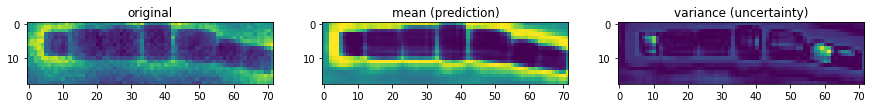

In [ ]:
mean4, var4 = dklgp4.predict(X, batch_size=len(X))
plot_dkl(img, window_size, y, mean4, var4)

(-0.5, 71.5, -0.5, 17.5)

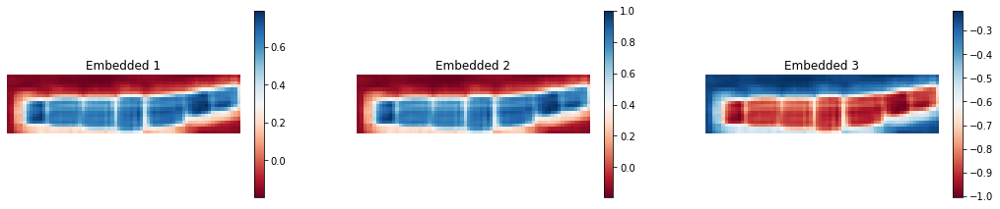

In [ ]:
s1,s2 = img.shape[0] - window_size + 1, img.shape[1] - window_size + 1

embeded4 = dklgp4.embed(X)
embeded4 = embeded4 / embeded4.max()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5))

cm = 'RdBu'
shrink = 0.7

im1 = ax1.imshow(embeded4[:,0].reshape(s1,s2), interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im1, ax=ax1, shrink = shrink)
ax1.set_title("Embedded 1")
ax1.axis('off')

im2 = ax2.imshow(embeded4[:,1].reshape(s1,s2), interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im2, ax=ax2, shrink = shrink)
ax2.set_title("Embedded 2")
ax2.axis('off')

im3 = ax3.imshow(embeded4[:,2].reshape(s1,s2), interpolation='nearest', origin = "lower", cmap=cm)
fig.colorbar(im3, ax=ax3, shrink = shrink)
ax3.set_title("Embedded 3")
ax3.axis('off')

# Pseudo active experiment

# *Please select different acquistion function and run multiple time step 1-4*

In [ ]:
y = np.copy(peaks_all_scalar1)

In [ ]:
# determine acquition funciton,
acq = 3  # 0 uses EI, 1 explores max uncertainty point, 2 uses UCB

rf = '/content/rf/'   #root folder
if not os.path.exists(rf):
    os.mkdir(rf)

acq_funcs = ['EI', 'MU', 'UCB']   #list corresponds to Func sel_next_point.
# root_folderEI = rf+"EI/"
# root_folderMU = rf+"MU/"
# root_folderUCB = rf+"UCB/"

if acq == 3:             # when acq = 3, run all acq_funcs
  if not os.path.exists(rf + acq_funcs[0]):
    os.mkdir(rf + acq_funcs[0])
  if not os.path.exists(rf + acq_funcs[1]):
    os.mkdir(rf + acq_funcs[1])
  if not os.path.exists(rf + acq_funcs[2]):
    os.mkdir(rf + acq_funcs[2])
elif acq < 3:
  if not os.path.exists(rf + acq_funcs[acq]):  # change root folder name when you change acquistion funciton
    os.mkdir(rf + acq_funcs[acq])

## Step 1. DKL exploration spectral based on band #1 (`0.3 - 0.4 eV`)

* Then band #2: `0.65 - 0.75 eV`
* Then band #3: `0.85 - 0.95 eV`

*   (?) This exploration process uses either EI acquition function or maximum uncertainty location
*   During the exploration, DKL will determine 200 measurement locations. Then, these locations will be used in later analysis processes with different target properties.



In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
# Adjust test data size (ts) to be as small as possible without running into error

In [ ]:
## Some globals

exploration_steps = 20
num_cycles        = 200

xi = 0.01  # balances exploration and explitation for EI and qEI
cm = 'viridis'
shrink = 0.7

ts = 0.995  # (0.9995 for key 3) test data size: # Adjust ts to be as small as possible without running into error
rs = 42   #random state determines initial train data, 42 because answer to everything

X_train shape: 
(6, 64)
1/20
Epoch 1/200 ... Training loss: 0.9671
Epoch 10/200 ... Training loss: 0.9342
Epoch 20/200 ... Training loss: 0.8636
Epoch 30/200 ... Training loss: 0.8037
Epoch 40/200 ... Training loss: 0.7471
Epoch 50/200 ... Training loss: 0.693
Epoch 60/200 ... Training loss: 0.6416
Epoch 70/200 ... Training loss: 0.5931
Epoch 80/200 ... Training loss: 0.5413
Epoch 90/200 ... Training loss: 0.4913
Epoch 100/200 ... Training loss: 0.4402
Epoch 110/200 ... Training loss: 0.3887
Epoch 120/200 ... Training loss: 0.3377
Epoch 130/200 ... Training loss: 0.2867
Epoch 140/200 ... Training loss: 0.2358
Epoch 150/200 ... Training loss: 0.1851
Epoch 160/200 ... Training loss: 0.1345
Epoch 170/200 ... Training loss: 0.0845
Epoch 180/200 ... Training loss: 0.0349
Epoch 190/200 ... Training loss: -0.0138
Epoch 200/200 ... Training loss: -0.0611
2/20
Epoch 1/200 ... Training loss: 0.9571
Epoch 10/200 ... Training loss: 0.8992
Epoch 20/200 ... Training loss: 0.8442
Epoch 30/200 ... Tra

<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8992
Epoch 20/200 ... Training loss: 0.8442
Epoch 30/200 ... Training loss: 0.7905
Epoch 40/200 ... Training loss: 0.7473
Epoch 50/200 ... Training loss: 0.6958
Epoch 60/200 ... Training loss: 0.6491
Epoch 70/200 ... Training loss: 0.6025
Epoch 80/200 ... Training loss: 0.5558
Epoch 90/200 ... Training loss: 0.5092
Epoch 100/200 ... Training loss: 0.4625
Epoch 110/200 ... Training loss: 0.4159
Epoch 120/200 ... Training loss: 0.3695
Epoch 130/200 ... Training loss: 0.3234
Epoch 140/200 ... Training loss: 0.2776
Epoch 150/200 ... Training loss: 0.2324
Epoch 160/200 ... Training loss: 0.1877
Epoch 170/200 ... Training loss: 0.1439
Epoch 180/200 ... Training loss: 0.1015
Epoch 190/200 ... Training loss: 0.0605
Epoch 200/200 ... Training loss: 0.021


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


3/20
Epoch 1/200 ... Training loss: 0.9419
Epoch 10/200 ... Training loss: 0.8971
Epoch 20/200 ... Training loss: 0.8427
Epoch 30/200 ... Training loss: 0.7914
Epoch 40/200 ... Training loss: 0.7411
Epoch 50/200 ... Training loss: 0.694
Epoch 60/200 ... Training loss: 0.6483
Epoch 70/200 ... Training loss: 0.602
Epoch 80/200 ... Training loss: 0.5622
Epoch 90/200 ... Training loss: 0.5107
Epoch 100/200 ... Training loss: 0.4653
Epoch 110/200 ... Training loss: 0.4194
Epoch 120/200 ... Training loss: 0.3742
Epoch 130/200 ... Training loss: 0.3292
Epoch 140/200 ... Training loss: 0.2843
Epoch 150/200 ... Training loss: 0.2399
Epoch 160/200 ... Training loss: 0.1961
Epoch 170/200 ... Training loss: 0.1531
Epoch 180/200 ... Training loss: 0.1109
Epoch 190/200 ... Training loss: 0.0696
Epoch 200/200 ... Training loss: 0.0292


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


4/20
Epoch 1/200 ... Training loss: 0.9412
Epoch 10/200 ... Training loss: 0.8879
Epoch 20/200 ... Training loss: 0.8397
Epoch 30/200 ... Training loss: 0.7911
Epoch 40/200 ... Training loss: 0.7436
Epoch 50/200 ... Training loss: 0.6975
Epoch 60/200 ... Training loss: 0.6521
Epoch 70/200 ... Training loss: 0.6077
Epoch 80/200 ... Training loss: 0.5636
Epoch 90/200 ... Training loss: 0.5196
Epoch 100/200 ... Training loss: 0.4756
Epoch 110/200 ... Training loss: 0.4318
Epoch 120/200 ... Training loss: 0.3881
Epoch 130/200 ... Training loss: 0.3442
Epoch 140/200 ... Training loss: 0.2979
Epoch 150/200 ... Training loss: 0.2511
Epoch 160/200 ... Training loss: 0.2106
Epoch 170/200 ... Training loss: 0.1646
Epoch 180/200 ... Training loss: 0.1193
Epoch 190/200 ... Training loss: 0.0759
Epoch 200/200 ... Training loss: 0.034
5/20
Epoch 1/200 ... Training loss: 0.9564


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.9004
Epoch 20/200 ... Training loss: 0.8463
Epoch 30/200 ... Training loss: 0.7993
Epoch 40/200 ... Training loss: 0.7547
Epoch 50/200 ... Training loss: 0.7113
Epoch 60/200 ... Training loss: 0.6689
Epoch 70/200 ... Training loss: 0.6256
Epoch 80/200 ... Training loss: 0.5832
Epoch 90/200 ... Training loss: 0.5412
Epoch 100/200 ... Training loss: 0.4998
Epoch 110/200 ... Training loss: 0.4594
Epoch 120/200 ... Training loss: 0.4197
Epoch 130/200 ... Training loss: 0.3804
Epoch 140/200 ... Training loss: 0.3414
Epoch 150/200 ... Training loss: 0.3002
Epoch 160/200 ... Training loss: 0.2566
Epoch 170/200 ... Training loss: 0.2141
Epoch 180/200 ... Training loss: 0.1742
Epoch 190/200 ... Training loss: 0.138
Epoch 200/200 ... Training loss: 0.1031


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


6/20
Epoch 1/200 ... Training loss: 0.9418
Epoch 10/200 ... Training loss: 0.8891
Epoch 20/200 ... Training loss: 0.8399
Epoch 30/200 ... Training loss: 0.7913
Epoch 40/200 ... Training loss: 0.7448
Epoch 50/200 ... Training loss: 0.7034
Epoch 60/200 ... Training loss: 0.6602
Epoch 70/200 ... Training loss: 0.6185
Epoch 80/200 ... Training loss: 0.5758
Epoch 90/200 ... Training loss: 0.5354
Epoch 100/200 ... Training loss: 0.4931
Epoch 110/200 ... Training loss: 0.4525
Epoch 120/200 ... Training loss: 0.4124
Epoch 130/200 ... Training loss: 0.3729
Epoch 140/200 ... Training loss: 0.3339
Epoch 150/200 ... Training loss: 0.2947
Epoch 160/200 ... Training loss: 0.2501
Epoch 170/200 ... Training loss: 0.2069
Epoch 180/200 ... Training loss: 0.1654
Epoch 190/200 ... Training loss: 0.1268
Epoch 200/200 ... Training loss: 0.0912


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


7/20
Epoch 1/200 ... Training loss: 0.9526
Epoch 10/200 ... Training loss: 0.8862
Epoch 20/200 ... Training loss: 0.8405
Epoch 30/200 ... Training loss: 0.7923
Epoch 40/200 ... Training loss: 0.7482
Epoch 50/200 ... Training loss: 0.7061
Epoch 60/200 ... Training loss: 0.6646
Epoch 70/200 ... Training loss: 0.6232
Epoch 80/200 ... Training loss: 0.5816
Epoch 90/200 ... Training loss: 0.54
Epoch 100/200 ... Training loss: 0.4985
Epoch 110/200 ... Training loss: 0.4572
Epoch 120/200 ... Training loss: 0.416
Epoch 130/200 ... Training loss: 0.3745
Epoch 140/200 ... Training loss: 0.3299
Epoch 150/200 ... Training loss: 0.2839
Epoch 160/200 ... Training loss: 0.2435
Epoch 170/200 ... Training loss: 0.2035
Epoch 180/200 ... Training loss: 0.1647
Epoch 190/200 ... Training loss: 0.127
Epoch 200/200 ... Training loss: 0.0918
8/20
Epoch 1/200 ... Training loss: 0.9539


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8734
Epoch 20/200 ... Training loss: 0.8306
Epoch 30/200 ... Training loss: 0.7867
Epoch 40/200 ... Training loss: 0.7466
Epoch 50/200 ... Training loss: 0.6985
Epoch 60/200 ... Training loss: 0.6561
Epoch 70/200 ... Training loss: 0.6134
Epoch 80/200 ... Training loss: 0.5696
Epoch 90/200 ... Training loss: 0.5235
Epoch 100/200 ... Training loss: 0.4775
Epoch 110/200 ... Training loss: 0.4346
Epoch 120/200 ... Training loss: 0.392
Epoch 130/200 ... Training loss: 0.3494
Epoch 140/200 ... Training loss: 0.3066
Epoch 150/200 ... Training loss: 0.2651
Epoch 160/200 ... Training loss: 0.228
Epoch 170/200 ... Training loss: 0.1868
Epoch 180/200 ... Training loss: 0.1476
Epoch 190/200 ... Training loss: 0.1099
Epoch 200/200 ... Training loss: 0.0734


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


9/20
Epoch 1/200 ... Training loss: 0.9432
Epoch 10/200 ... Training loss: 0.8758
Epoch 20/200 ... Training loss: 0.8243
Epoch 30/200 ... Training loss: 0.778
Epoch 40/200 ... Training loss: 0.7338
Epoch 50/200 ... Training loss: 0.6908
Epoch 60/200 ... Training loss: 0.6477
Epoch 70/200 ... Training loss: 0.6026
Epoch 80/200 ... Training loss: 0.5566
Epoch 90/200 ... Training loss: 0.5113
Epoch 100/200 ... Training loss: 0.4675
Epoch 110/200 ... Training loss: 0.4244
Epoch 120/200 ... Training loss: 0.3818
Epoch 130/200 ... Training loss: 0.3396
Epoch 140/200 ... Training loss: 0.3002
Epoch 150/200 ... Training loss: 0.2625
Epoch 160/200 ... Training loss: 0.2186
Epoch 170/200 ... Training loss: 0.1772
Epoch 180/200 ... Training loss: 0.1377
Epoch 190/200 ... Training loss: 0.0994
Epoch 200/200 ... Training loss: 0.0623


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


10/20
Epoch 1/200 ... Training loss: 0.9365
Epoch 10/200 ... Training loss: 0.8635
Epoch 20/200 ... Training loss: 0.8188
Epoch 30/200 ... Training loss: 0.7745
Epoch 40/200 ... Training loss: 0.7321
Epoch 50/200 ... Training loss: 0.6879
Epoch 60/200 ... Training loss: 0.65
Epoch 70/200 ... Training loss: 0.6066
Epoch 80/200 ... Training loss: 0.5589
Epoch 90/200 ... Training loss: 0.5188
Epoch 100/200 ... Training loss: 0.4723
Epoch 110/200 ... Training loss: 0.4297
Epoch 120/200 ... Training loss: 0.387
Epoch 130/200 ... Training loss: 0.3419
Epoch 140/200 ... Training loss: 0.2981
Epoch 150/200 ... Training loss: 0.2555
Epoch 160/200 ... Training loss: 0.2142
Epoch 170/200 ... Training loss: 0.1738
Epoch 180/200 ... Training loss: 0.1347
Epoch 190/200 ... Training loss: 0.0975
Epoch 200/200 ... Training loss: 0.0608
11/20
Epoch 1/200 ... Training loss: 0.9309


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8642
Epoch 20/200 ... Training loss: 0.815
Epoch 30/200 ... Training loss: 0.7684
Epoch 40/200 ... Training loss: 0.7254
Epoch 50/200 ... Training loss: 0.6815
Epoch 60/200 ... Training loss: 0.6354
Epoch 70/200 ... Training loss: 0.5984
Epoch 80/200 ... Training loss: 0.5624
Epoch 90/200 ... Training loss: 0.5191
Epoch 100/200 ... Training loss: 0.4749
Epoch 110/200 ... Training loss: 0.4281
Epoch 120/200 ... Training loss: 0.3823
Epoch 130/200 ... Training loss: 0.3369
Epoch 140/200 ... Training loss: 0.2934
Epoch 150/200 ... Training loss: 0.25
Epoch 160/200 ... Training loss: 0.2077
Epoch 170/200 ... Training loss: 0.1662
Epoch 180/200 ... Training loss: 0.1265
Epoch 190/200 ... Training loss: 0.0871
Epoch 200/200 ... Training loss: 0.0497


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


12/20
Epoch 1/200 ... Training loss: 0.923
Epoch 10/200 ... Training loss: 0.8673
Epoch 20/200 ... Training loss: 0.8146
Epoch 30/200 ... Training loss: 0.7691
Epoch 40/200 ... Training loss: 0.7257
Epoch 50/200 ... Training loss: 0.6829
Epoch 60/200 ... Training loss: 0.6406
Epoch 70/200 ... Training loss: 0.5991
Epoch 80/200 ... Training loss: 0.5576
Epoch 90/200 ... Training loss: 0.5155
Epoch 100/200 ... Training loss: 0.4725
Epoch 110/200 ... Training loss: 0.4286
Epoch 120/200 ... Training loss: 0.3835
Epoch 130/200 ... Training loss: 0.3371
Epoch 140/200 ... Training loss: 0.2907
Epoch 150/200 ... Training loss: 0.2476
Epoch 160/200 ... Training loss: 0.204
Epoch 170/200 ... Training loss: 0.1606
Epoch 180/200 ... Training loss: 0.1187
Epoch 190/200 ... Training loss: 0.0776
Epoch 200/200 ... Training loss: 0.0375
13/20
Epoch 1/200 ... Training loss: 0.9196


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8546
Epoch 20/200 ... Training loss: 0.8078
Epoch 30/200 ... Training loss: 0.7636
Epoch 40/200 ... Training loss: 0.72
Epoch 50/200 ... Training loss: 0.6781
Epoch 60/200 ... Training loss: 0.6357
Epoch 70/200 ... Training loss: 0.5932
Epoch 80/200 ... Training loss: 0.5501
Epoch 90/200 ... Training loss: 0.5054
Epoch 100/200 ... Training loss: 0.4593
Epoch 110/200 ... Training loss: 0.4157
Epoch 120/200 ... Training loss: 0.3711
Epoch 130/200 ... Training loss: 0.3261
Epoch 140/200 ... Training loss: 0.281
Epoch 150/200 ... Training loss: 0.2371
Epoch 160/200 ... Training loss: 0.1939
Epoch 170/200 ... Training loss: 0.1516
Epoch 180/200 ... Training loss: 0.1097
Epoch 190/200 ... Training loss: 0.0687
Epoch 200/200 ... Training loss: 0.0285


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


14/20
Epoch 1/200 ... Training loss: 0.9126
Epoch 10/200 ... Training loss: 0.8493
Epoch 20/200 ... Training loss: 0.804
Epoch 30/200 ... Training loss: 0.7579
Epoch 40/200 ... Training loss: 0.7155
Epoch 50/200 ... Training loss: 0.6732
Epoch 60/200 ... Training loss: 0.6301
Epoch 70/200 ... Training loss: 0.5848
Epoch 80/200 ... Training loss: 0.5387
Epoch 90/200 ... Training loss: 0.4936
Epoch 100/200 ... Training loss: 0.4494
Epoch 110/200 ... Training loss: 0.4052
Epoch 120/200 ... Training loss: 0.3619
Epoch 130/200 ... Training loss: 0.3184
Epoch 140/200 ... Training loss: 0.2744
Epoch 150/200 ... Training loss: 0.2313
Epoch 160/200 ... Training loss: 0.1877
Epoch 170/200 ... Training loss: 0.1449
Epoch 180/200 ... Training loss: 0.1027
Epoch 190/200 ... Training loss: 0.0613
Epoch 200/200 ... Training loss: 0.0205
15/20
Epoch 1/200 ... Training loss: 0.9103


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8428
Epoch 20/200 ... Training loss: 0.8035
Epoch 30/200 ... Training loss: 0.759
Epoch 40/200 ... Training loss: 0.7159
Epoch 50/200 ... Training loss: 0.674
Epoch 60/200 ... Training loss: 0.6319
Epoch 70/200 ... Training loss: 0.589
Epoch 80/200 ... Training loss: 0.5402
Epoch 90/200 ... Training loss: 0.4958
Epoch 100/200 ... Training loss: 0.4499
Epoch 110/200 ... Training loss: 0.4047
Epoch 120/200 ... Training loss: 0.3597
Epoch 130/200 ... Training loss: 0.3152
Epoch 140/200 ... Training loss: 0.2714
Epoch 150/200 ... Training loss: 0.228
Epoch 160/200 ... Training loss: 0.185
Epoch 170/200 ... Training loss: 0.1426
Epoch 180/200 ... Training loss: 0.1006
Epoch 190/200 ... Training loss: 0.0589
Epoch 200/200 ... Training loss: 0.0173


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


16/20
Epoch 1/200 ... Training loss: 0.9067
Epoch 10/200 ... Training loss: 0.8376
Epoch 20/200 ... Training loss: 0.7972
Epoch 30/200 ... Training loss: 0.7543
Epoch 40/200 ... Training loss: 0.7121
Epoch 50/200 ... Training loss: 0.6689
Epoch 60/200 ... Training loss: 0.624
Epoch 70/200 ... Training loss: 0.5779
Epoch 80/200 ... Training loss: 0.5327
Epoch 90/200 ... Training loss: 0.4888
Epoch 100/200 ... Training loss: 0.4448
Epoch 110/200 ... Training loss: 0.4007
Epoch 120/200 ... Training loss: 0.3561
Epoch 130/200 ... Training loss: 0.3119
Epoch 140/200 ... Training loss: 0.268
Epoch 150/200 ... Training loss: 0.2245
Epoch 160/200 ... Training loss: 0.1814
Epoch 170/200 ... Training loss: 0.1386
Epoch 180/200 ... Training loss: 0.0962
Epoch 190/200 ... Training loss: 0.0541
Epoch 200/200 ... Training loss: 0.012
17/20
Epoch 1/200 ... Training loss: 0.9012


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8423
Epoch 20/200 ... Training loss: 0.7966
Epoch 30/200 ... Training loss: 0.7512
Epoch 40/200 ... Training loss: 0.7097
Epoch 50/200 ... Training loss: 0.6687
Epoch 60/200 ... Training loss: 0.6273
Epoch 70/200 ... Training loss: 0.585
Epoch 80/200 ... Training loss: 0.541
Epoch 90/200 ... Training loss: 0.4933
Epoch 100/200 ... Training loss: 0.4476
Epoch 110/200 ... Training loss: 0.4022
Epoch 120/200 ... Training loss: 0.3572
Epoch 130/200 ... Training loss: 0.3125
Epoch 140/200 ... Training loss: 0.2683
Epoch 150/200 ... Training loss: 0.2228
Epoch 160/200 ... Training loss: 0.1782
Epoch 170/200 ... Training loss: 0.134
Epoch 180/200 ... Training loss: 0.0902
Epoch 190/200 ... Training loss: 0.0468
Epoch 200/200 ... Training loss: 0.0035


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


18/20
Epoch 1/200 ... Training loss: 0.8999
Epoch 10/200 ... Training loss: 0.8323
Epoch 20/200 ... Training loss: 0.7915
Epoch 30/200 ... Training loss: 0.751
Epoch 40/200 ... Training loss: 0.7071
Epoch 50/200 ... Training loss: 0.669
Epoch 60/200 ... Training loss: 0.6178
Epoch 70/200 ... Training loss: 0.5718
Epoch 80/200 ... Training loss: 0.5274
Epoch 90/200 ... Training loss: 0.4834
Epoch 100/200 ... Training loss: 0.4391
Epoch 110/200 ... Training loss: 0.3946
Epoch 120/200 ... Training loss: 0.351
Epoch 130/200 ... Training loss: 0.3076
Epoch 140/200 ... Training loss: 0.2647
Epoch 150/200 ... Training loss: 0.2211
Epoch 160/200 ... Training loss: 0.1765
Epoch 170/200 ... Training loss: 0.1324
Epoch 180/200 ... Training loss: 0.0887
Epoch 190/200 ... Training loss: 0.0451
Epoch 200/200 ... Training loss: 0.0015
19/20
Epoch 1/200 ... Training loss: 0.8993


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8328
Epoch 20/200 ... Training loss: 0.7943
Epoch 30/200 ... Training loss: 0.7509
Epoch 40/200 ... Training loss: 0.7093
Epoch 50/200 ... Training loss: 0.6685
Epoch 60/200 ... Training loss: 0.6263
Epoch 70/200 ... Training loss: 0.5826
Epoch 80/200 ... Training loss: 0.5368
Epoch 90/200 ... Training loss: 0.4904
Epoch 100/200 ... Training loss: 0.4446
Epoch 110/200 ... Training loss: 0.3989
Epoch 120/200 ... Training loss: 0.3544
Epoch 130/200 ... Training loss: 0.3111
Epoch 140/200 ... Training loss: 0.2663
Epoch 150/200 ... Training loss: 0.2199
Epoch 160/200 ... Training loss: 0.1747
Epoch 170/200 ... Training loss: 0.13
Epoch 180/200 ... Training loss: 0.0855
Epoch 190/200 ... Training loss: 0.041
Epoch 200/200 ... Training loss: -0.0037


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


20/20
Epoch 1/200 ... Training loss: 0.8989
Epoch 10/200 ... Training loss: 0.8375
Epoch 20/200 ... Training loss: 0.7943
Epoch 30/200 ... Training loss: 0.7515
Epoch 40/200 ... Training loss: 0.7109
Epoch 50/200 ... Training loss: 0.6703
Epoch 60/200 ... Training loss: 0.6288
Epoch 70/200 ... Training loss: 0.5853
Epoch 80/200 ... Training loss: 0.5389
Epoch 90/200 ... Training loss: 0.4922
Epoch 100/200 ... Training loss: 0.4459
Epoch 110/200 ... Training loss: 0.4006
Epoch 120/200 ... Training loss: 0.3555
Epoch 130/200 ... Training loss: 0.3109
Epoch 140/200 ... Training loss: 0.2662
Epoch 150/200 ... Training loss: 0.2209
Epoch 160/200 ... Training loss: 0.1755
Epoch 170/200 ... Training loss: 0.1303
Epoch 180/200 ... Training loss: 0.0853
Epoch 190/200 ... Training loss: 0.04
Epoch 200/200 ... Training loss: -0.0053
X_train shape: 
(6, 64)
1/20
Epoch 1/200 ... Training loss: 0.9671


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.9342
Epoch 20/200 ... Training loss: 0.8636
Epoch 30/200 ... Training loss: 0.8037
Epoch 40/200 ... Training loss: 0.7471
Epoch 50/200 ... Training loss: 0.693
Epoch 60/200 ... Training loss: 0.6416
Epoch 70/200 ... Training loss: 0.5931
Epoch 80/200 ... Training loss: 0.5413
Epoch 90/200 ... Training loss: 0.4913
Epoch 100/200 ... Training loss: 0.4402
Epoch 110/200 ... Training loss: 0.3887
Epoch 120/200 ... Training loss: 0.3377
Epoch 130/200 ... Training loss: 0.2867
Epoch 140/200 ... Training loss: 0.2358
Epoch 150/200 ... Training loss: 0.1851
Epoch 160/200 ... Training loss: 0.1345
Epoch 170/200 ... Training loss: 0.0845
Epoch 180/200 ... Training loss: 0.0349
Epoch 190/200 ... Training loss: -0.0138
Epoch 200/200 ... Training loss: -0.0611
2/20
Epoch 1/200 ... Training loss: 0.9571


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8992
Epoch 20/200 ... Training loss: 0.8442
Epoch 30/200 ... Training loss: 0.7905
Epoch 40/200 ... Training loss: 0.7473
Epoch 50/200 ... Training loss: 0.6958
Epoch 60/200 ... Training loss: 0.6491
Epoch 70/200 ... Training loss: 0.6025
Epoch 80/200 ... Training loss: 0.5558
Epoch 90/200 ... Training loss: 0.5092
Epoch 100/200 ... Training loss: 0.4625
Epoch 110/200 ... Training loss: 0.4159
Epoch 120/200 ... Training loss: 0.3695
Epoch 130/200 ... Training loss: 0.3234
Epoch 140/200 ... Training loss: 0.2776
Epoch 150/200 ... Training loss: 0.2324
Epoch 160/200 ... Training loss: 0.1877
Epoch 170/200 ... Training loss: 0.1439
Epoch 180/200 ... Training loss: 0.1015
Epoch 190/200 ... Training loss: 0.0605
Epoch 200/200 ... Training loss: 0.021


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


3/20
Epoch 1/200 ... Training loss: 0.9433
Epoch 10/200 ... Training loss: 0.8927
Epoch 20/200 ... Training loss: 0.8443
Epoch 30/200 ... Training loss: 0.7868
Epoch 40/200 ... Training loss: 0.737
Epoch 50/200 ... Training loss: 0.6913
Epoch 60/200 ... Training loss: 0.6466
Epoch 70/200 ... Training loss: 0.6019
Epoch 80/200 ... Training loss: 0.5568
Epoch 90/200 ... Training loss: 0.5116
Epoch 100/200 ... Training loss: 0.4663
Epoch 110/200 ... Training loss: 0.4202
Epoch 120/200 ... Training loss: 0.3751
Epoch 130/200 ... Training loss: 0.3295
Epoch 140/200 ... Training loss: 0.2813
Epoch 150/200 ... Training loss: 0.2334
Epoch 160/200 ... Training loss: 0.1871
Epoch 170/200 ... Training loss: 0.1409
Epoch 180/200 ... Training loss: 0.0958
Epoch 190/200 ... Training loss: 0.0514
Epoch 200/200 ... Training loss: 0.0063
4/20
Epoch 1/200 ... Training loss: 0.9643


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8924
Epoch 20/200 ... Training loss: 0.8387
Epoch 30/200 ... Training loss: 0.7896
Epoch 40/200 ... Training loss: 0.7419
Epoch 50/200 ... Training loss: 0.6953
Epoch 60/200 ... Training loss: 0.6471
Epoch 70/200 ... Training loss: 0.6007
Epoch 80/200 ... Training loss: 0.5541
Epoch 90/200 ... Training loss: 0.5088
Epoch 100/200 ... Training loss: 0.4638
Epoch 110/200 ... Training loss: 0.4189
Epoch 120/200 ... Training loss: 0.3738
Epoch 130/200 ... Training loss: 0.3282
Epoch 140/200 ... Training loss: 0.281
Epoch 150/200 ... Training loss: 0.2351
Epoch 160/200 ... Training loss: 0.1891
Epoch 170/200 ... Training loss: 0.1413
Epoch 180/200 ... Training loss: 0.0962
Epoch 190/200 ... Training loss: 0.0499
Epoch 200/200 ... Training loss: 0.0041
5/20
Epoch 1/200 ... Training loss: 0.959


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8769
Epoch 20/200 ... Training loss: 0.8286
Epoch 30/200 ... Training loss: 0.7813
Epoch 40/200 ... Training loss: 0.7351
Epoch 50/200 ... Training loss: 0.6899
Epoch 60/200 ... Training loss: 0.6474
Epoch 70/200 ... Training loss: 0.6011
Epoch 80/200 ... Training loss: 0.5551
Epoch 90/200 ... Training loss: 0.5092
Epoch 100/200 ... Training loss: 0.4638
Epoch 110/200 ... Training loss: 0.4184
Epoch 120/200 ... Training loss: 0.3734
Epoch 130/200 ... Training loss: 0.3284
Epoch 140/200 ... Training loss: 0.2826
Epoch 150/200 ... Training loss: 0.2342
Epoch 160/200 ... Training loss: 0.1861
Epoch 170/200 ... Training loss: 0.1431
Epoch 180/200 ... Training loss: 0.0956
Epoch 190/200 ... Training loss: 0.0516
Epoch 200/200 ... Training loss: 0.0028


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


6/20
Epoch 1/200 ... Training loss: 0.9493
Epoch 10/200 ... Training loss: 0.8753
Epoch 20/200 ... Training loss: 0.8206
Epoch 30/200 ... Training loss: 0.7731
Epoch 40/200 ... Training loss: 0.7267
Epoch 50/200 ... Training loss: 0.6813
Epoch 60/200 ... Training loss: 0.6362
Epoch 70/200 ... Training loss: 0.591
Epoch 80/200 ... Training loss: 0.5456
Epoch 90/200 ... Training loss: 0.5106
Epoch 100/200 ... Training loss: 0.4566
Epoch 110/200 ... Training loss: 0.4115
Epoch 120/200 ... Training loss: 0.3657
Epoch 130/200 ... Training loss: 0.318
Epoch 140/200 ... Training loss: 0.2717
Epoch 150/200 ... Training loss: 0.227
Epoch 160/200 ... Training loss: 0.18
Epoch 170/200 ... Training loss: 0.1323
Epoch 180/200 ... Training loss: 0.0854
Epoch 190/200 ... Training loss: 0.04
Epoch 200/200 ... Training loss: -0.0074
7/20
Epoch 1/200 ... Training loss: 0.9421


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8685
Epoch 20/200 ... Training loss: 0.8145
Epoch 30/200 ... Training loss: 0.7655
Epoch 40/200 ... Training loss: 0.719
Epoch 50/200 ... Training loss: 0.6734
Epoch 60/200 ... Training loss: 0.628
Epoch 70/200 ... Training loss: 0.5819
Epoch 80/200 ... Training loss: 0.5354
Epoch 90/200 ... Training loss: 0.4883
Epoch 100/200 ... Training loss: 0.4413
Epoch 110/200 ... Training loss: 0.3985
Epoch 120/200 ... Training loss: 0.351
Epoch 130/200 ... Training loss: 0.302
Epoch 140/200 ... Training loss: 0.2571
Epoch 150/200 ... Training loss: 0.2128
Epoch 160/200 ... Training loss: 0.1672
Epoch 170/200 ... Training loss: 0.1203
Epoch 180/200 ... Training loss: 0.0747
Epoch 190/200 ... Training loss: 0.0264
Epoch 200/200 ... Training loss: -0.0205


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


8/20
Epoch 1/200 ... Training loss: 0.9413
Epoch 10/200 ... Training loss: 0.867
Epoch 20/200 ... Training loss: 0.8168
Epoch 30/200 ... Training loss: 0.7677
Epoch 40/200 ... Training loss: 0.7241
Epoch 50/200 ... Training loss: 0.6871
Epoch 60/200 ... Training loss: 0.6309
Epoch 70/200 ... Training loss: 0.5863
Epoch 80/200 ... Training loss: 0.5414
Epoch 90/200 ... Training loss: 0.4967
Epoch 100/200 ... Training loss: 0.4523
Epoch 110/200 ... Training loss: 0.408
Epoch 120/200 ... Training loss: 0.3636
Epoch 130/200 ... Training loss: 0.3196
Epoch 140/200 ... Training loss: 0.2757
Epoch 150/200 ... Training loss: 0.2321
Epoch 160/200 ... Training loss: 0.1886
Epoch 170/200 ... Training loss: 0.1451
Epoch 180/200 ... Training loss: 0.1011
Epoch 190/200 ... Training loss: 0.0546
Epoch 200/200 ... Training loss: 0.0072


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


9/20
Epoch 1/200 ... Training loss: 0.936
Epoch 10/200 ... Training loss: 0.8615
Epoch 20/200 ... Training loss: 0.8073
Epoch 30/200 ... Training loss: 0.7611
Epoch 40/200 ... Training loss: 0.7164
Epoch 50/200 ... Training loss: 0.6705
Epoch 60/200 ... Training loss: 0.6247
Epoch 70/200 ... Training loss: 0.5838
Epoch 80/200 ... Training loss: 0.535
Epoch 90/200 ... Training loss: 0.4898
Epoch 100/200 ... Training loss: 0.4439
Epoch 110/200 ... Training loss: 0.3964
Epoch 120/200 ... Training loss: 0.3518
Epoch 130/200 ... Training loss: 0.3058
Epoch 140/200 ... Training loss: 0.259
Epoch 150/200 ... Training loss: 0.2124
Epoch 160/200 ... Training loss: 0.1665
Epoch 170/200 ... Training loss: 0.1216
Epoch 180/200 ... Training loss: 0.0762
Epoch 190/200 ... Training loss: 0.0319
Epoch 200/200 ... Training loss: -0.012
10/20
Epoch 1/200 ... Training loss: 0.9292


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8669
Epoch 20/200 ... Training loss: 0.7994
Epoch 30/200 ... Training loss: 0.7548
Epoch 40/200 ... Training loss: 0.7108
Epoch 50/200 ... Training loss: 0.6671
Epoch 60/200 ... Training loss: 0.6316
Epoch 70/200 ... Training loss: 0.5793
Epoch 80/200 ... Training loss: 0.5365
Epoch 90/200 ... Training loss: 0.4917
Epoch 100/200 ... Training loss: 0.4473
Epoch 110/200 ... Training loss: 0.4023
Epoch 120/200 ... Training loss: 0.3535
Epoch 130/200 ... Training loss: 0.3094
Epoch 140/200 ... Training loss: 0.2626
Epoch 150/200 ... Training loss: 0.2143
Epoch 160/200 ... Training loss: 0.1673
Epoch 170/200 ... Training loss: 0.1204
Epoch 180/200 ... Training loss: 0.0742
Epoch 190/200 ... Training loss: 0.0288
Epoch 200/200 ... Training loss: -0.0149


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


11/20
Epoch 1/200 ... Training loss: 0.925
Epoch 10/200 ... Training loss: 0.8531
Epoch 20/200 ... Training loss: 0.804
Epoch 30/200 ... Training loss: 0.7573
Epoch 40/200 ... Training loss: 0.7114
Epoch 50/200 ... Training loss: 0.668
Epoch 60/200 ... Training loss: 0.6242
Epoch 70/200 ... Training loss: 0.5798
Epoch 80/200 ... Training loss: 0.5363
Epoch 90/200 ... Training loss: 0.5001
Epoch 100/200 ... Training loss: 0.4516
Epoch 110/200 ... Training loss: 0.4141
Epoch 120/200 ... Training loss: 0.3634
Epoch 130/200 ... Training loss: 0.3201
Epoch 140/200 ... Training loss: 0.2769
Epoch 150/200 ... Training loss: 0.2337
Epoch 160/200 ... Training loss: 0.1901
Epoch 170/200 ... Training loss: 0.1433
Epoch 180/200 ... Training loss: 0.0938
Epoch 190/200 ... Training loss: 0.047
Epoch 200/200 ... Training loss: 0.0011


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


12/20
Epoch 1/200 ... Training loss: 0.9181
Epoch 10/200 ... Training loss: 0.8369
Epoch 20/200 ... Training loss: 0.7942
Epoch 30/200 ... Training loss: 0.7529
Epoch 40/200 ... Training loss: 0.7082
Epoch 50/200 ... Training loss: 0.6633
Epoch 60/200 ... Training loss: 0.6195
Epoch 70/200 ... Training loss: 0.5771
Epoch 80/200 ... Training loss: 0.5325
Epoch 90/200 ... Training loss: 0.489
Epoch 100/200 ... Training loss: 0.4455
Epoch 110/200 ... Training loss: 0.4017
Epoch 120/200 ... Training loss: 0.3578
Epoch 130/200 ... Training loss: 0.3133
Epoch 140/200 ... Training loss: 0.2663
Epoch 150/200 ... Training loss: 0.2176
Epoch 160/200 ... Training loss: 0.169
Epoch 170/200 ... Training loss: 0.1225
Epoch 180/200 ... Training loss: 0.0766
Epoch 190/200 ... Training loss: 0.0315
Epoch 200/200 ... Training loss: -0.0124
13/20
Epoch 1/200 ... Training loss: 0.9109


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8334
Epoch 20/200 ... Training loss: 0.7942
Epoch 30/200 ... Training loss: 0.7457
Epoch 40/200 ... Training loss: 0.7006
Epoch 50/200 ... Training loss: 0.6576
Epoch 60/200 ... Training loss: 0.6157
Epoch 70/200 ... Training loss: 0.5724
Epoch 80/200 ... Training loss: 0.5285
Epoch 90/200 ... Training loss: 0.4804
Epoch 100/200 ... Training loss: 0.4408
Epoch 110/200 ... Training loss: 0.3971
Epoch 120/200 ... Training loss: 0.3532
Epoch 130/200 ... Training loss: 0.3092
Epoch 140/200 ... Training loss: 0.2652
Epoch 150/200 ... Training loss: 0.2206
Epoch 160/200 ... Training loss: 0.1743
Epoch 170/200 ... Training loss: 0.1287
Epoch 180/200 ... Training loss: 0.0844
Epoch 190/200 ... Training loss: 0.0339
Epoch 200/200 ... Training loss: -0.0129


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


14/20
Epoch 1/200 ... Training loss: 0.9054
Epoch 10/200 ... Training loss: 0.8363
Epoch 20/200 ... Training loss: 0.7898
Epoch 30/200 ... Training loss: 0.7446
Epoch 40/200 ... Training loss: 0.6994
Epoch 50/200 ... Training loss: 0.6548
Epoch 60/200 ... Training loss: 0.6101
Epoch 70/200 ... Training loss: 0.5639
Epoch 80/200 ... Training loss: 0.5184
Epoch 90/200 ... Training loss: 0.4787
Epoch 100/200 ... Training loss: 0.4366
Epoch 110/200 ... Training loss: 0.3921
Epoch 120/200 ... Training loss: 0.3469
Epoch 130/200 ... Training loss: 0.2986
Epoch 140/200 ... Training loss: 0.2507
Epoch 150/200 ... Training loss: 0.204
Epoch 160/200 ... Training loss: 0.1552
Epoch 170/200 ... Training loss: 0.1099
Epoch 180/200 ... Training loss: 0.0644
Epoch 190/200 ... Training loss: 0.0193
Epoch 200/200 ... Training loss: -0.0255


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


15/20
Epoch 1/200 ... Training loss: 0.908
Epoch 10/200 ... Training loss: 0.836
Epoch 20/200 ... Training loss: 0.7886
Epoch 30/200 ... Training loss: 0.7446
Epoch 40/200 ... Training loss: 0.7006
Epoch 50/200 ... Training loss: 0.6571
Epoch 60/200 ... Training loss: 0.6136
Epoch 70/200 ... Training loss: 0.571
Epoch 80/200 ... Training loss: 0.5278
Epoch 90/200 ... Training loss: 0.4842
Epoch 100/200 ... Training loss: 0.4402
Epoch 110/200 ... Training loss: 0.3956
Epoch 120/200 ... Training loss: 0.3501
Epoch 130/200 ... Training loss: 0.3028
Epoch 140/200 ... Training loss: 0.2544
Epoch 150/200 ... Training loss: 0.2076
Epoch 160/200 ... Training loss: 0.1623
Epoch 170/200 ... Training loss: 0.1173
Epoch 180/200 ... Training loss: 0.0724
Epoch 190/200 ... Training loss: 0.028
Epoch 200/200 ... Training loss: -0.0156
16/20
Epoch 1/200 ... Training loss: 0.9061


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8337
Epoch 20/200 ... Training loss: 0.7869
Epoch 30/200 ... Training loss: 0.7422
Epoch 40/200 ... Training loss: 0.6986
Epoch 50/200 ... Training loss: 0.6555
Epoch 60/200 ... Training loss: 0.6126
Epoch 70/200 ... Training loss: 0.5697
Epoch 80/200 ... Training loss: 0.5266
Epoch 90/200 ... Training loss: 0.4834
Epoch 100/200 ... Training loss: 0.44
Epoch 110/200 ... Training loss: 0.3956
Epoch 120/200 ... Training loss: 0.3476
Epoch 130/200 ... Training loss: 0.2994
Epoch 140/200 ... Training loss: 0.2545
Epoch 150/200 ... Training loss: 0.2073
Epoch 160/200 ... Training loss: 0.1615
Epoch 170/200 ... Training loss: 0.1162
Epoch 180/200 ... Training loss: 0.0715
Epoch 190/200 ... Training loss: 0.0274
Epoch 200/200 ... Training loss: -0.0163


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


17/20
Epoch 1/200 ... Training loss: 0.9018
Epoch 10/200 ... Training loss: 0.8301
Epoch 20/200 ... Training loss: 0.7818
Epoch 30/200 ... Training loss: 0.7381
Epoch 40/200 ... Training loss: 0.6955
Epoch 50/200 ... Training loss: 0.6532
Epoch 60/200 ... Training loss: 0.6109
Epoch 70/200 ... Training loss: 0.568
Epoch 80/200 ... Training loss: 0.5247
Epoch 90/200 ... Training loss: 0.4806
Epoch 100/200 ... Training loss: 0.433
Epoch 110/200 ... Training loss: 0.3847
Epoch 120/200 ... Training loss: 0.3375
Epoch 130/200 ... Training loss: 0.2917
Epoch 140/200 ... Training loss: 0.2461
Epoch 150/200 ... Training loss: 0.2012
Epoch 160/200 ... Training loss: 0.1567
Epoch 170/200 ... Training loss: 0.1116
Epoch 180/200 ... Training loss: 0.0672
Epoch 190/200 ... Training loss: 0.0233
Epoch 200/200 ... Training loss: -0.0203
18/20
Epoch 1/200 ... Training loss: 0.9005


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8244
Epoch 20/200 ... Training loss: 0.7824
Epoch 30/200 ... Training loss: 0.7386
Epoch 40/200 ... Training loss: 0.6945
Epoch 50/200 ... Training loss: 0.6519
Epoch 60/200 ... Training loss: 0.6098
Epoch 70/200 ... Training loss: 0.5676
Epoch 80/200 ... Training loss: 0.5252
Epoch 90/200 ... Training loss: 0.4822
Epoch 100/200 ... Training loss: 0.4381
Epoch 110/200 ... Training loss: 0.3908
Epoch 120/200 ... Training loss: 0.3422
Epoch 130/200 ... Training loss: 0.2949
Epoch 140/200 ... Training loss: 0.2497
Epoch 150/200 ... Training loss: 0.2051
Epoch 160/200 ... Training loss: 0.1605
Epoch 170/200 ... Training loss: 0.1152
Epoch 180/200 ... Training loss: 0.0704
Epoch 190/200 ... Training loss: 0.0261
Epoch 200/200 ... Training loss: -0.018
19/20
Epoch 1/200 ... Training loss: 0.8976


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8205
Epoch 20/200 ... Training loss: 0.7804
Epoch 30/200 ... Training loss: 0.7352
Epoch 40/200 ... Training loss: 0.6925
Epoch 50/200 ... Training loss: 0.6503
Epoch 60/200 ... Training loss: 0.6081
Epoch 70/200 ... Training loss: 0.5657
Epoch 80/200 ... Training loss: 0.5227
Epoch 90/200 ... Training loss: 0.4789
Epoch 100/200 ... Training loss: 0.4342
Epoch 110/200 ... Training loss: 0.3873
Epoch 120/200 ... Training loss: 0.3379
Epoch 130/200 ... Training loss: 0.2917
Epoch 140/200 ... Training loss: 0.2483
Epoch 150/200 ... Training loss: 0.202
Epoch 160/200 ... Training loss: 0.1568
Epoch 170/200 ... Training loss: 0.1117
Epoch 180/200 ... Training loss: 0.0671
Epoch 190/200 ... Training loss: 0.0226
Epoch 200/200 ... Training loss: -0.0217


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


20/20
Epoch 1/200 ... Training loss: 0.8932
Epoch 10/200 ... Training loss: 0.8175
Epoch 20/200 ... Training loss: 0.7755
Epoch 30/200 ... Training loss: 0.7328
Epoch 40/200 ... Training loss: 0.6899
Epoch 50/200 ... Training loss: 0.6479
Epoch 60/200 ... Training loss: 0.6055
Epoch 70/200 ... Training loss: 0.5628
Epoch 80/200 ... Training loss: 0.5196
Epoch 90/200 ... Training loss: 0.4751
Epoch 100/200 ... Training loss: 0.4281
Epoch 110/200 ... Training loss: 0.3793
Epoch 120/200 ... Training loss: 0.333
Epoch 130/200 ... Training loss: 0.2874
Epoch 140/200 ... Training loss: 0.2419
Epoch 150/200 ... Training loss: 0.1968
Epoch 160/200 ... Training loss: 0.152
Epoch 170/200 ... Training loss: 0.1075
Epoch 180/200 ... Training loss: 0.063
Epoch 190/200 ... Training loss: 0.0185
Epoch 200/200 ... Training loss: -0.0258


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


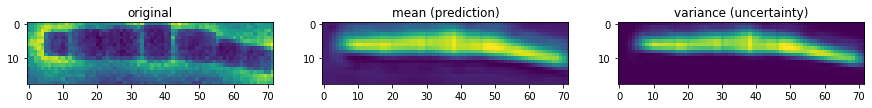

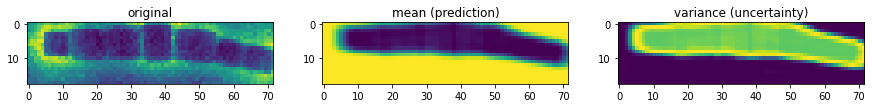

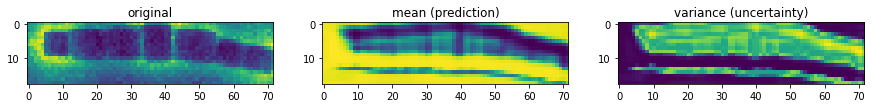

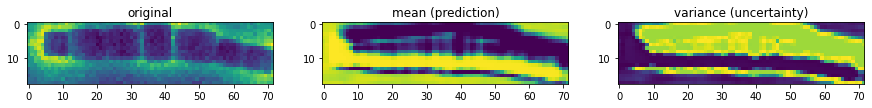

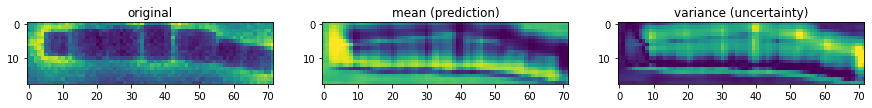

...

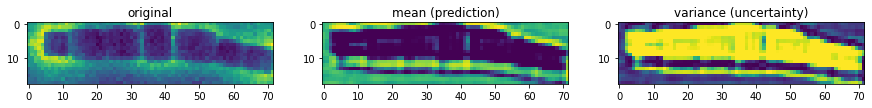

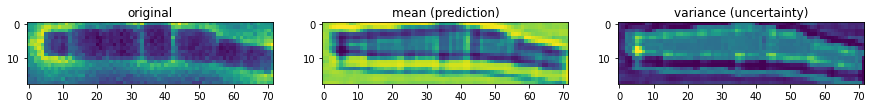

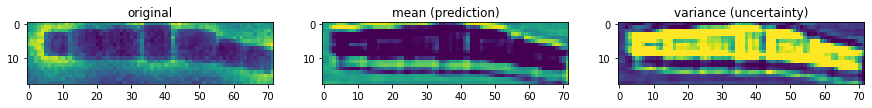

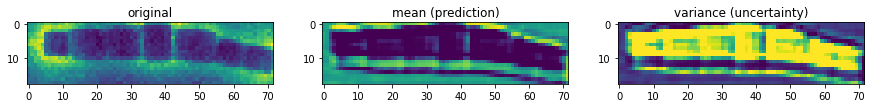

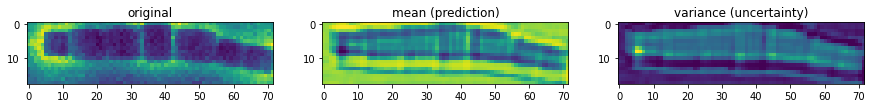

In [ ]:
save_explore =  "/explore_dkl_record/"

y_targ = peaks_all_scalar1    #training output;
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

# run DKL exploration with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_explore(save_explore, num_cycles)

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_explore(save_explore, num_cycles)

* Next, the exploration locations will be used for other analyses with different band energies

In [ ]:
peaks_all_scalar1.min(), peaks_all_scalar1.max()

(0.0, 1.0)

In [ ]:
# !zip -r /content/rf_NPs3_band1.zip /content/rf_new2

## Step 2 (counterfactual)

* Based on the exploration pathway using the first scalarizer (band #1), we re-run the DKL experiments following the trajectory taken in step 1, but this time using `different scalarizer`
* i.e., ignore the acquisition function for determining the next measurement point, as the next measurement points have all been predetermined by the first scalarizer DKL experiment (step 1)



In [ ]:
# from google.colab import files
# files.download("/content/rf_NPs3_band1.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

1/20
Epoch 1/200 ... Training loss: 0.945
Epoch 10/200 ... Training loss: 0.9118
Epoch 20/200 ... Training loss: 0.86
Epoch 30/200 ... Training loss: 0.8027
Epoch 40/200 ... Training loss: 0.7549
Epoch 50/200 ... Training loss: 0.7088
Epoch 60/200 ... Training loss: 0.6629
Epoch 70/200 ... Training loss: 0.6208
Epoch 80/200 ... Training loss: 0.5719
Epoch 90/200 ... Training loss: 0.525
Epoch 100/200 ... Training loss: 0.4791
Epoch 110/200 ... Training loss: 0.4329
Epoch 120/200 ... Training loss: 0.3871
Epoch 130/200 ... Training loss: 0.3415
Epoch 140/200 ... Training loss: 0.2967
Epoch 150/200 ... Training loss: 0.2526
Epoch 160/200 ... Training loss: 0.2094
Epoch 170/200 ... Training loss: 0.1673
Epoch 180/200 ... Training loss: 0.127
Epoch 190/200 ... Training loss: 0.0868
Epoch 200/200 ... Training loss: 0.0484
2/20
Epoch 1/200 ... Training loss: 0.9318
Epoch 10/200 ... Training loss: 0.8911
Epoch 20/200 ... Training loss: 0.8389
Epoch 30/200 ... Training loss: 0.7922
Epoch 40/20

<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8911
Epoch 20/200 ... Training loss: 0.8389
Epoch 30/200 ... Training loss: 0.7922
Epoch 40/200 ... Training loss: 0.7472
Epoch 50/200 ... Training loss: 0.705
Epoch 60/200 ... Training loss: 0.6572
Epoch 70/200 ... Training loss: 0.6115
Epoch 80/200 ... Training loss: 0.5655
Epoch 90/200 ... Training loss: 0.5188
Epoch 100/200 ... Training loss: 0.4726
Epoch 110/200 ... Training loss: 0.4266
Epoch 120/200 ... Training loss: 0.3805
Epoch 130/200 ... Training loss: 0.3346
Epoch 140/200 ... Training loss: 0.2894
Epoch 150/200 ... Training loss: 0.2448
Epoch 160/200 ... Training loss: 0.2008
Epoch 170/200 ... Training loss: 0.1577
Epoch 180/200 ... Training loss: 0.1155
Epoch 190/200 ... Training loss: 0.0745
Epoch 200/200 ... Training loss: 0.0349


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


3/20
Epoch 1/200 ... Training loss: 0.9177
Epoch 10/200 ... Training loss: 0.8907
Epoch 20/200 ... Training loss: 0.835
Epoch 30/200 ... Training loss: 0.7867
Epoch 40/200 ... Training loss: 0.7407
Epoch 50/200 ... Training loss: 0.6945
Epoch 60/200 ... Training loss: 0.6463
Epoch 70/200 ... Training loss: 0.6017
Epoch 80/200 ... Training loss: 0.5577
Epoch 90/200 ... Training loss: 0.5105
Epoch 100/200 ... Training loss: 0.4634
Epoch 110/200 ... Training loss: 0.4164
Epoch 120/200 ... Training loss: 0.3693
Epoch 130/200 ... Training loss: 0.3227
Epoch 140/200 ... Training loss: 0.2765
Epoch 150/200 ... Training loss: 0.2308
Epoch 160/200 ... Training loss: 0.1858
Epoch 170/200 ... Training loss: 0.1416
Epoch 180/200 ... Training loss: 0.0982
Epoch 190/200 ... Training loss: 0.0561
Epoch 200/200 ... Training loss: 0.015
4/20
Epoch 1/200 ... Training loss: 0.915


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8846
Epoch 20/200 ... Training loss: 0.8365
Epoch 30/200 ... Training loss: 0.7889
Epoch 40/200 ... Training loss: 0.7424
Epoch 50/200 ... Training loss: 0.6951
Epoch 60/200 ... Training loss: 0.6474
Epoch 70/200 ... Training loss: 0.6
Epoch 80/200 ... Training loss: 0.5527
Epoch 90/200 ... Training loss: 0.5075
Epoch 100/200 ... Training loss: 0.4573
Epoch 110/200 ... Training loss: 0.416
Epoch 120/200 ... Training loss: 0.3649
Epoch 130/200 ... Training loss: 0.3213
Epoch 140/200 ... Training loss: 0.2706
Epoch 150/200 ... Training loss: 0.2269
Epoch 160/200 ... Training loss: 0.1777
Epoch 170/200 ... Training loss: 0.1334
Epoch 180/200 ... Training loss: 0.0885
Epoch 190/200 ... Training loss: 0.0432
Epoch 200/200 ... Training loss: 0.0


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


5/20
Epoch 1/200 ... Training loss: 0.9109
Epoch 10/200 ... Training loss: 0.8743
Epoch 20/200 ... Training loss: 0.8192
Epoch 30/200 ... Training loss: 0.7741
Epoch 40/200 ... Training loss: 0.7302
Epoch 50/200 ... Training loss: 0.6842
Epoch 60/200 ... Training loss: 0.6359
Epoch 70/200 ... Training loss: 0.5857
Epoch 80/200 ... Training loss: 0.5368
Epoch 90/200 ... Training loss: 0.4892
Epoch 100/200 ... Training loss: 0.4408
Epoch 110/200 ... Training loss: 0.3926
Epoch 120/200 ... Training loss: 0.3464
Epoch 130/200 ... Training loss: 0.3003
Epoch 140/200 ... Training loss: 0.2542
Epoch 150/200 ... Training loss: 0.2082
Epoch 160/200 ... Training loss: 0.1622
Epoch 170/200 ... Training loss: 0.1165
Epoch 180/200 ... Training loss: 0.071
Epoch 190/200 ... Training loss: 0.0255
Epoch 200/200 ... Training loss: -0.0198
6/20
Epoch 1/200 ... Training loss: 0.903


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8596
Epoch 20/200 ... Training loss: 0.8167
Epoch 30/200 ... Training loss: 0.7704
Epoch 40/200 ... Training loss: 0.7256
Epoch 50/200 ... Training loss: 0.6786
Epoch 60/200 ... Training loss: 0.6317
Epoch 70/200 ... Training loss: 0.585
Epoch 80/200 ... Training loss: 0.5377
Epoch 90/200 ... Training loss: 0.4899
Epoch 100/200 ... Training loss: 0.442
Epoch 110/200 ... Training loss: 0.3943
Epoch 120/200 ... Training loss: 0.3453
Epoch 130/200 ... Training loss: 0.2986
Epoch 140/200 ... Training loss: 0.2525
Epoch 150/200 ... Training loss: 0.2068
Epoch 160/200 ... Training loss: 0.1614
Epoch 170/200 ... Training loss: 0.1152
Epoch 180/200 ... Training loss: 0.0695
Epoch 190/200 ... Training loss: 0.0237
Epoch 200/200 ... Training loss: -0.0219
7/20
Epoch 1/200 ... Training loss: 0.9155


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8682
Epoch 20/200 ... Training loss: 0.8203
Epoch 30/200 ... Training loss: 0.7729
Epoch 40/200 ... Training loss: 0.7286
Epoch 50/200 ... Training loss: 0.6919
Epoch 60/200 ... Training loss: 0.6397
Epoch 70/200 ... Training loss: 0.5934
Epoch 80/200 ... Training loss: 0.5465
Epoch 90/200 ... Training loss: 0.5001
Epoch 100/200 ... Training loss: 0.4542
Epoch 110/200 ... Training loss: 0.4072
Epoch 120/200 ... Training loss: 0.3632
Epoch 130/200 ... Training loss: 0.3199
Epoch 140/200 ... Training loss: 0.275
Epoch 150/200 ... Training loss: 0.231
Epoch 160/200 ... Training loss: 0.1869
Epoch 170/200 ... Training loss: 0.1427
Epoch 180/200 ... Training loss: 0.0991
Epoch 190/200 ... Training loss: 0.0567
Epoch 200/200 ... Training loss: 0.0153


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


8/20
Epoch 1/200 ... Training loss: 0.9206
Epoch 10/200 ... Training loss: 0.8515
Epoch 20/200 ... Training loss: 0.8085
Epoch 30/200 ... Training loss: 0.7664
Epoch 40/200 ... Training loss: 0.723
Epoch 50/200 ... Training loss: 0.6782
Epoch 60/200 ... Training loss: 0.634
Epoch 70/200 ... Training loss: 0.5873
Epoch 80/200 ... Training loss: 0.5405
Epoch 90/200 ... Training loss: 0.4945
Epoch 100/200 ... Training loss: 0.447
Epoch 110/200 ... Training loss: 0.4007
Epoch 120/200 ... Training loss: 0.3558
Epoch 130/200 ... Training loss: 0.3114
Epoch 140/200 ... Training loss: 0.2675
Epoch 150/200 ... Training loss: 0.2226
Epoch 160/200 ... Training loss: 0.1792
Epoch 170/200 ... Training loss: 0.136
Epoch 180/200 ... Training loss: 0.092
Epoch 190/200 ... Training loss: 0.0487
Epoch 200/200 ... Training loss: 0.0067


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


9/20
Epoch 1/200 ... Training loss: 0.9123
Epoch 10/200 ... Training loss: 0.8476
Epoch 20/200 ... Training loss: 0.808
Epoch 30/200 ... Training loss: 0.7658
Epoch 40/200 ... Training loss: 0.7203
Epoch 50/200 ... Training loss: 0.6762
Epoch 60/200 ... Training loss: 0.6319
Epoch 70/200 ... Training loss: 0.5859
Epoch 80/200 ... Training loss: 0.539
Epoch 90/200 ... Training loss: 0.4918
Epoch 100/200 ... Training loss: 0.4435
Epoch 110/200 ... Training loss: 0.3983
Epoch 120/200 ... Training loss: 0.3533
Epoch 130/200 ... Training loss: 0.3083
Epoch 140/200 ... Training loss: 0.2632
Epoch 150/200 ... Training loss: 0.2181
Epoch 160/200 ... Training loss: 0.1733
Epoch 170/200 ... Training loss: 0.1288
Epoch 180/200 ... Training loss: 0.0849
Epoch 190/200 ... Training loss: 0.0417
Epoch 200/200 ... Training loss: -0.0005


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


10/20
Epoch 1/200 ... Training loss: 0.9052
Epoch 10/200 ... Training loss: 0.8517
Epoch 20/200 ... Training loss: 0.8081
Epoch 30/200 ... Training loss: 0.7626
Epoch 40/200 ... Training loss: 0.7187
Epoch 50/200 ... Training loss: 0.6738
Epoch 60/200 ... Training loss: 0.6293
Epoch 70/200 ... Training loss: 0.5854
Epoch 80/200 ... Training loss: 0.5384
Epoch 90/200 ... Training loss: 0.4927
Epoch 100/200 ... Training loss: 0.4452
Epoch 110/200 ... Training loss: 0.3968
Epoch 120/200 ... Training loss: 0.351
Epoch 130/200 ... Training loss: 0.3058
Epoch 140/200 ... Training loss: 0.2618
Epoch 150/200 ... Training loss: 0.2174
Epoch 160/200 ... Training loss: 0.173
Epoch 170/200 ... Training loss: 0.1285
Epoch 180/200 ... Training loss: 0.0837
Epoch 190/200 ... Training loss: 0.0404
Epoch 200/200 ... Training loss: -0.0046
11/20
Epoch 1/200 ... Training loss: 0.9051


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8464
Epoch 20/200 ... Training loss: 0.8043
Epoch 30/200 ... Training loss: 0.7593
Epoch 40/200 ... Training loss: 0.7148
Epoch 50/200 ... Training loss: 0.6692
Epoch 60/200 ... Training loss: 0.6219
Epoch 70/200 ... Training loss: 0.5743
Epoch 80/200 ... Training loss: 0.5273
Epoch 90/200 ... Training loss: 0.4831
Epoch 100/200 ... Training loss: 0.4383
Epoch 110/200 ... Training loss: 0.394
Epoch 120/200 ... Training loss: 0.3494
Epoch 130/200 ... Training loss: 0.3045
Epoch 140/200 ... Training loss: 0.2592
Epoch 150/200 ... Training loss: 0.2142
Epoch 160/200 ... Training loss: 0.1699
Epoch 170/200 ... Training loss: 0.1248
Epoch 180/200 ... Training loss: 0.0802
Epoch 190/200 ... Training loss: 0.0364
Epoch 200/200 ... Training loss: -0.0067
12/20
Epoch 1/200 ... Training loss: 0.8985


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8409
Epoch 20/200 ... Training loss: 0.7981
Epoch 30/200 ... Training loss: 0.7584
Epoch 40/200 ... Training loss: 0.7139
Epoch 50/200 ... Training loss: 0.6689
Epoch 60/200 ... Training loss: 0.622
Epoch 70/200 ... Training loss: 0.5749
Epoch 80/200 ... Training loss: 0.5262
Epoch 90/200 ... Training loss: 0.4848
Epoch 100/200 ... Training loss: 0.4375
Epoch 110/200 ... Training loss: 0.3935
Epoch 120/200 ... Training loss: 0.349
Epoch 130/200 ... Training loss: 0.3043
Epoch 140/200 ... Training loss: 0.2593
Epoch 150/200 ... Training loss: 0.214
Epoch 160/200 ... Training loss: 0.1684
Epoch 170/200 ... Training loss: 0.1226
Epoch 180/200 ... Training loss: 0.0772
Epoch 190/200 ... Training loss: 0.0326
Epoch 200/200 ... Training loss: -0.0112
13/20
Epoch 1/200 ... Training loss: 0.8933


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.846
Epoch 20/200 ... Training loss: 0.7963
Epoch 30/200 ... Training loss: 0.7541
Epoch 40/200 ... Training loss: 0.7159
Epoch 50/200 ... Training loss: 0.6709
Epoch 60/200 ... Training loss: 0.6272
Epoch 70/200 ... Training loss: 0.5829
Epoch 80/200 ... Training loss: 0.5379
Epoch 90/200 ... Training loss: 0.4974
Epoch 100/200 ... Training loss: 0.446
Epoch 110/200 ... Training loss: 0.3978
Epoch 120/200 ... Training loss: 0.3511
Epoch 130/200 ... Training loss: 0.3058
Epoch 140/200 ... Training loss: 0.2604
Epoch 150/200 ... Training loss: 0.2142
Epoch 160/200 ... Training loss: 0.1673
Epoch 170/200 ... Training loss: 0.1205
Epoch 180/200 ... Training loss: 0.0746
Epoch 190/200 ... Training loss: 0.0295
Epoch 200/200 ... Training loss: -0.0149
14/20
Epoch 1/200 ... Training loss: 0.888


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8409
Epoch 20/200 ... Training loss: 0.7954
Epoch 30/200 ... Training loss: 0.7507
Epoch 40/200 ... Training loss: 0.7092
Epoch 50/200 ... Training loss: 0.6667
Epoch 60/200 ... Training loss: 0.623
Epoch 70/200 ... Training loss: 0.5783
Epoch 80/200 ... Training loss: 0.5327
Epoch 90/200 ... Training loss: 0.4855
Epoch 100/200 ... Training loss: 0.4359
Epoch 110/200 ... Training loss: 0.3892
Epoch 120/200 ... Training loss: 0.3438
Epoch 130/200 ... Training loss: 0.2979
Epoch 140/200 ... Training loss: 0.2509
Epoch 150/200 ... Training loss: 0.204
Epoch 160/200 ... Training loss: 0.1574
Epoch 170/200 ... Training loss: 0.1113
Epoch 180/200 ... Training loss: 0.0659
Epoch 190/200 ... Training loss: 0.021
Epoch 200/200 ... Training loss: -0.0234


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


15/20
Epoch 1/200 ... Training loss: 0.883
Epoch 10/200 ... Training loss: 0.8373
Epoch 20/200 ... Training loss: 0.791
Epoch 30/200 ... Training loss: 0.7446
Epoch 40/200 ... Training loss: 0.7024
Epoch 50/200 ... Training loss: 0.6602
Epoch 60/200 ... Training loss: 0.6174
Epoch 70/200 ... Training loss: 0.5739
Epoch 80/200 ... Training loss: 0.5293
Epoch 90/200 ... Training loss: 0.4817
Epoch 100/200 ... Training loss: 0.433
Epoch 110/200 ... Training loss: 0.3924
Epoch 120/200 ... Training loss: 0.342
Epoch 130/200 ... Training loss: 0.2975
Epoch 140/200 ... Training loss: 0.2528
Epoch 150/200 ... Training loss: 0.2083
Epoch 160/200 ... Training loss: 0.1637
Epoch 170/200 ... Training loss: 0.1198
Epoch 180/200 ... Training loss: 0.0737
Epoch 190/200 ... Training loss: 0.0252
Epoch 200/200 ... Training loss: -0.0213
16/20
Epoch 1/200 ... Training loss: 0.8805


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8214
Epoch 20/200 ... Training loss: 0.7885
Epoch 30/200 ... Training loss: 0.7442
Epoch 40/200 ... Training loss: 0.701
Epoch 50/200 ... Training loss: 0.6577
Epoch 60/200 ... Training loss: 0.6131
Epoch 70/200 ... Training loss: 0.5677
Epoch 80/200 ... Training loss: 0.5206
Epoch 90/200 ... Training loss: 0.4734
Epoch 100/200 ... Training loss: 0.4275
Epoch 110/200 ... Training loss: 0.3826
Epoch 120/200 ... Training loss: 0.3377
Epoch 130/200 ... Training loss: 0.2923
Epoch 140/200 ... Training loss: 0.2463
Epoch 150/200 ... Training loss: 0.1992
Epoch 160/200 ... Training loss: 0.1517
Epoch 170/200 ... Training loss: 0.1049
Epoch 180/200 ... Training loss: 0.0588
Epoch 190/200 ... Training loss: 0.0133
Epoch 200/200 ... Training loss: -0.0318


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


17/20
Epoch 1/200 ... Training loss: 0.8759
Epoch 10/200 ... Training loss: 0.8285
Epoch 20/200 ... Training loss: 0.7811
Epoch 30/200 ... Training loss: 0.7398
Epoch 40/200 ... Training loss: 0.6986
Epoch 50/200 ... Training loss: 0.6518
Epoch 60/200 ... Training loss: 0.6142
Epoch 70/200 ... Training loss: 0.5694
Epoch 80/200 ... Training loss: 0.5249
Epoch 90/200 ... Training loss: 0.4804
Epoch 100/200 ... Training loss: 0.4351
Epoch 110/200 ... Training loss: 0.388
Epoch 120/200 ... Training loss: 0.3407
Epoch 130/200 ... Training loss: 0.2948
Epoch 140/200 ... Training loss: 0.2497
Epoch 150/200 ... Training loss: 0.2048
Epoch 160/200 ... Training loss: 0.1608
Epoch 170/200 ... Training loss: 0.1128
Epoch 180/200 ... Training loss: 0.0654
Epoch 190/200 ... Training loss: 0.0166
Epoch 200/200 ... Training loss: -0.0308
18/20
Epoch 1/200 ... Training loss: 0.8722


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8171
Epoch 20/200 ... Training loss: 0.7797
Epoch 30/200 ... Training loss: 0.7396
Epoch 40/200 ... Training loss: 0.6972
Epoch 50/200 ... Training loss: 0.6541
Epoch 60/200 ... Training loss: 0.6104
Epoch 70/200 ... Training loss: 0.5662
Epoch 80/200 ... Training loss: 0.5213
Epoch 90/200 ... Training loss: 0.4747
Epoch 100/200 ... Training loss: 0.4284
Epoch 110/200 ... Training loss: 0.3897
Epoch 120/200 ... Training loss: 0.3426
Epoch 130/200 ... Training loss: 0.294
Epoch 140/200 ... Training loss: 0.2494
Epoch 150/200 ... Training loss: 0.2041
Epoch 160/200 ... Training loss: 0.1586
Epoch 170/200 ... Training loss: 0.1127
Epoch 180/200 ... Training loss: 0.0661
Epoch 190/200 ... Training loss: 0.0198
Epoch 200/200 ... Training loss: -0.0263
19/20
Epoch 1/200 ... Training loss: 0.8706


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8226
Epoch 20/200 ... Training loss: 0.7787
Epoch 30/200 ... Training loss: 0.7341
Epoch 40/200 ... Training loss: 0.6917
Epoch 50/200 ... Training loss: 0.6498
Epoch 60/200 ... Training loss: 0.6076
Epoch 70/200 ... Training loss: 0.5638
Epoch 80/200 ... Training loss: 0.5216
Epoch 90/200 ... Training loss: 0.4771
Epoch 100/200 ... Training loss: 0.4311
Epoch 110/200 ... Training loss: 0.3829
Epoch 120/200 ... Training loss: 0.3353
Epoch 130/200 ... Training loss: 0.2891
Epoch 140/200 ... Training loss: 0.2428
Epoch 150/200 ... Training loss: 0.1962
Epoch 160/200 ... Training loss: 0.1491
Epoch 170/200 ... Training loss: 0.1009
Epoch 180/200 ... Training loss: 0.0525
Epoch 190/200 ... Training loss: 0.0049
Epoch 200/200 ... Training loss: -0.0419


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


20/20
Epoch 1/200 ... Training loss: 0.8685
Epoch 10/200 ... Training loss: 0.8136
Epoch 20/200 ... Training loss: 0.7761
Epoch 30/200 ... Training loss: 0.7332
Epoch 40/200 ... Training loss: 0.69
Epoch 50/200 ... Training loss: 0.6473
Epoch 60/200 ... Training loss: 0.6019
Epoch 70/200 ... Training loss: 0.5563
Epoch 80/200 ... Training loss: 0.5095
Epoch 90/200 ... Training loss: 0.4639
Epoch 100/200 ... Training loss: 0.4187
Epoch 110/200 ... Training loss: 0.3733
Epoch 120/200 ... Training loss: 0.3275
Epoch 130/200 ... Training loss: 0.2817
Epoch 140/200 ... Training loss: 0.2365
Epoch 150/200 ... Training loss: 0.1902
Epoch 160/200 ... Training loss: 0.1426
Epoch 170/200 ... Training loss: 0.0936
Epoch 180/200 ... Training loss: 0.0462
Epoch 190/200 ... Training loss: -0.0007
Epoch 200/200 ... Training loss: -0.0474
1/20
Epoch 1/200 ... Training loss: 0.945


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.9118
Epoch 20/200 ... Training loss: 0.86
Epoch 30/200 ... Training loss: 0.8027
Epoch 40/200 ... Training loss: 0.7549
Epoch 50/200 ... Training loss: 0.7088
Epoch 60/200 ... Training loss: 0.6629
Epoch 70/200 ... Training loss: 0.6208
Epoch 80/200 ... Training loss: 0.5719
Epoch 90/200 ... Training loss: 0.525
Epoch 100/200 ... Training loss: 0.4791
Epoch 110/200 ... Training loss: 0.4329
Epoch 120/200 ... Training loss: 0.3871
Epoch 130/200 ... Training loss: 0.3415
Epoch 140/200 ... Training loss: 0.2967
Epoch 150/200 ... Training loss: 0.2526
Epoch 160/200 ... Training loss: 0.2094
Epoch 170/200 ... Training loss: 0.1673
Epoch 180/200 ... Training loss: 0.127
Epoch 190/200 ... Training loss: 0.0868
Epoch 200/200 ... Training loss: 0.0484
2/20
Epoch 1/200 ... Training loss: 0.9318


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8911
Epoch 20/200 ... Training loss: 0.8389
Epoch 30/200 ... Training loss: 0.7922
Epoch 40/200 ... Training loss: 0.7472
Epoch 50/200 ... Training loss: 0.705
Epoch 60/200 ... Training loss: 0.6572
Epoch 70/200 ... Training loss: 0.6115
Epoch 80/200 ... Training loss: 0.5655
Epoch 90/200 ... Training loss: 0.5188
Epoch 100/200 ... Training loss: 0.4726
Epoch 110/200 ... Training loss: 0.4266
Epoch 120/200 ... Training loss: 0.3805
Epoch 130/200 ... Training loss: 0.3346
Epoch 140/200 ... Training loss: 0.2894
Epoch 150/200 ... Training loss: 0.2448
Epoch 160/200 ... Training loss: 0.2008
Epoch 170/200 ... Training loss: 0.1577
Epoch 180/200 ... Training loss: 0.1155
Epoch 190/200 ... Training loss: 0.0745
Epoch 200/200 ... Training loss: 0.0349


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


3/20
Epoch 1/200 ... Training loss: 0.926
Epoch 10/200 ... Training loss: 0.8854
Epoch 20/200 ... Training loss: 0.8382
Epoch 30/200 ... Training loss: 0.7869
Epoch 40/200 ... Training loss: 0.7408
Epoch 50/200 ... Training loss: 0.6968
Epoch 60/200 ... Training loss: 0.6531
Epoch 70/200 ... Training loss: 0.609
Epoch 80/200 ... Training loss: 0.5657
Epoch 90/200 ... Training loss: 0.5202
Epoch 100/200 ... Training loss: 0.4748
Epoch 110/200 ... Training loss: 0.4293
Epoch 120/200 ... Training loss: 0.3843
Epoch 130/200 ... Training loss: 0.3398
Epoch 140/200 ... Training loss: 0.2957
Epoch 150/200 ... Training loss: 0.252
Epoch 160/200 ... Training loss: 0.2087
Epoch 170/200 ... Training loss: 0.1656
Epoch 180/200 ... Training loss: 0.1216
Epoch 190/200 ... Training loss: 0.0773
Epoch 200/200 ... Training loss: 0.0356
4/20
Epoch 1/200 ... Training loss: 0.9434


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8865
Epoch 20/200 ... Training loss: 0.8362
Epoch 30/200 ... Training loss: 0.7882
Epoch 40/200 ... Training loss: 0.7414
Epoch 50/200 ... Training loss: 0.6973
Epoch 60/200 ... Training loss: 0.6528
Epoch 70/200 ... Training loss: 0.6079
Epoch 80/200 ... Training loss: 0.5629
Epoch 90/200 ... Training loss: 0.518
Epoch 100/200 ... Training loss: 0.4732
Epoch 110/200 ... Training loss: 0.4285
Epoch 120/200 ... Training loss: 0.3841
Epoch 130/200 ... Training loss: 0.3398
Epoch 140/200 ... Training loss: 0.2957
Epoch 150/200 ... Training loss: 0.2511
Epoch 160/200 ... Training loss: 0.2049
Epoch 170/200 ... Training loss: 0.1573
Epoch 180/200 ... Training loss: 0.1127
Epoch 190/200 ... Training loss: 0.0703
Epoch 200/200 ... Training loss: 0.0293


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


5/20
Epoch 1/200 ... Training loss: 0.9407
Epoch 10/200 ... Training loss: 0.8832
Epoch 20/200 ... Training loss: 0.8308
Epoch 30/200 ... Training loss: 0.7819
Epoch 40/200 ... Training loss: 0.7354
Epoch 50/200 ... Training loss: 0.691
Epoch 60/200 ... Training loss: 0.6452
Epoch 70/200 ... Training loss: 0.5991
Epoch 80/200 ... Training loss: 0.5539
Epoch 90/200 ... Training loss: 0.5094
Epoch 100/200 ... Training loss: 0.4637
Epoch 110/200 ... Training loss: 0.42
Epoch 120/200 ... Training loss: 0.3753
Epoch 130/200 ... Training loss: 0.3307
Epoch 140/200 ... Training loss: 0.2868
Epoch 150/200 ... Training loss: 0.2435
Epoch 160/200 ... Training loss: 0.2006
Epoch 170/200 ... Training loss: 0.1566
Epoch 180/200 ... Training loss: 0.108
Epoch 190/200 ... Training loss: 0.0635
Epoch 200/200 ... Training loss: 0.0205
6/20
Epoch 1/200 ... Training loss: 0.9383


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8654
Epoch 20/200 ... Training loss: 0.8201
Epoch 30/200 ... Training loss: 0.7759
Epoch 40/200 ... Training loss: 0.7324
Epoch 50/200 ... Training loss: 0.6889
Epoch 60/200 ... Training loss: 0.6472
Epoch 70/200 ... Training loss: 0.6032
Epoch 80/200 ... Training loss: 0.5588
Epoch 90/200 ... Training loss: 0.5144
Epoch 100/200 ... Training loss: 0.4699
Epoch 110/200 ... Training loss: 0.4215
Epoch 120/200 ... Training loss: 0.3729
Epoch 130/200 ... Training loss: 0.3286
Epoch 140/200 ... Training loss: 0.2854
Epoch 150/200 ... Training loss: 0.2408
Epoch 160/200 ... Training loss: 0.1971
Epoch 170/200 ... Training loss: 0.1539
Epoch 180/200 ... Training loss: 0.1112
Epoch 190/200 ... Training loss: 0.0693
Epoch 200/200 ... Training loss: 0.0284
7/20
Epoch 1/200 ... Training loss: 0.9463


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8803
Epoch 20/200 ... Training loss: 0.8296
Epoch 30/200 ... Training loss: 0.7845
Epoch 40/200 ... Training loss: 0.7399
Epoch 50/200 ... Training loss: 0.6985
Epoch 60/200 ... Training loss: 0.6561
Epoch 70/200 ... Training loss: 0.6138
Epoch 80/200 ... Training loss: 0.5715
Epoch 90/200 ... Training loss: 0.5293
Epoch 100/200 ... Training loss: 0.486
Epoch 110/200 ... Training loss: 0.4448
Epoch 120/200 ... Training loss: 0.4004
Epoch 130/200 ... Training loss: 0.351
Epoch 140/200 ... Training loss: 0.3055
Epoch 150/200 ... Training loss: 0.2622
Epoch 160/200 ... Training loss: 0.2197
Epoch 170/200 ... Training loss: 0.1841
Epoch 180/200 ... Training loss: 0.1386
Epoch 190/200 ... Training loss: 0.0977
Epoch 200/200 ... Training loss: 0.0578
8/20
Epoch 1/200 ... Training loss: 0.9391


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8878
Epoch 20/200 ... Training loss: 0.8208
Epoch 30/200 ... Training loss: 0.7761
Epoch 40/200 ... Training loss: 0.7328
Epoch 50/200 ... Training loss: 0.6901
Epoch 60/200 ... Training loss: 0.6475
Epoch 70/200 ... Training loss: 0.6049
Epoch 80/200 ... Training loss: 0.5616
Epoch 90/200 ... Training loss: 0.5093
Epoch 100/200 ... Training loss: 0.4634
Epoch 110/200 ... Training loss: 0.4183
Epoch 120/200 ... Training loss: 0.3767
Epoch 130/200 ... Training loss: 0.3325
Epoch 140/200 ... Training loss: 0.2891
Epoch 150/200 ... Training loss: 0.2455
Epoch 160/200 ... Training loss: 0.2025
Epoch 170/200 ... Training loss: 0.1608
Epoch 180/200 ... Training loss: 0.1194
Epoch 190/200 ... Training loss: 0.0788
Epoch 200/200 ... Training loss: 0.0394


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


9/20
Epoch 1/200 ... Training loss: 0.9313
Epoch 10/200 ... Training loss: 0.8615
Epoch 20/200 ... Training loss: 0.8136
Epoch 30/200 ... Training loss: 0.7691
Epoch 40/200 ... Training loss: 0.7271
Epoch 50/200 ... Training loss: 0.6831
Epoch 60/200 ... Training loss: 0.6409
Epoch 70/200 ... Training loss: 0.5988
Epoch 80/200 ... Training loss: 0.5563
Epoch 90/200 ... Training loss: 0.5132
Epoch 100/200 ... Training loss: 0.4687
Epoch 110/200 ... Training loss: 0.4213
Epoch 120/200 ... Training loss: 0.3735
Epoch 130/200 ... Training loss: 0.3288
Epoch 140/200 ... Training loss: 0.2852
Epoch 150/200 ... Training loss: 0.2412
Epoch 160/200 ... Training loss: 0.1982
Epoch 170/200 ... Training loss: 0.157
Epoch 180/200 ... Training loss: 0.1132
Epoch 190/200 ... Training loss: 0.0727
Epoch 200/200 ... Training loss: 0.0318


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


10/20
Epoch 1/200 ... Training loss: 0.9259
Epoch 10/200 ... Training loss: 0.8539
Epoch 20/200 ... Training loss: 0.8085
Epoch 30/200 ... Training loss: 0.7633
Epoch 40/200 ... Training loss: 0.7206
Epoch 50/200 ... Training loss: 0.6781
Epoch 60/200 ... Training loss: 0.6352
Epoch 70/200 ... Training loss: 0.59
Epoch 80/200 ... Training loss: 0.5399
Epoch 90/200 ... Training loss: 0.5
Epoch 100/200 ... Training loss: 0.4545
Epoch 110/200 ... Training loss: 0.4105
Epoch 120/200 ... Training loss: 0.3667
Epoch 130/200 ... Training loss: 0.3229
Epoch 140/200 ... Training loss: 0.2792
Epoch 150/200 ... Training loss: 0.2364
Epoch 160/200 ... Training loss: 0.1926
Epoch 170/200 ... Training loss: 0.1493
Epoch 180/200 ... Training loss: 0.1072
Epoch 190/200 ... Training loss: 0.0661
Epoch 200/200 ... Training loss: 0.0259
11/20
Epoch 1/200 ... Training loss: 0.9247


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8543
Epoch 20/200 ... Training loss: 0.8084
Epoch 30/200 ... Training loss: 0.7642
Epoch 40/200 ... Training loss: 0.7217
Epoch 50/200 ... Training loss: 0.6799
Epoch 60/200 ... Training loss: 0.637
Epoch 70/200 ... Training loss: 0.6026
Epoch 80/200 ... Training loss: 0.5565
Epoch 90/200 ... Training loss: 0.5114
Epoch 100/200 ... Training loss: 0.4624
Epoch 110/200 ... Training loss: 0.4158
Epoch 120/200 ... Training loss: 0.3708
Epoch 130/200 ... Training loss: 0.326
Epoch 140/200 ... Training loss: 0.282
Epoch 150/200 ... Training loss: 0.2381
Epoch 160/200 ... Training loss: 0.1951
Epoch 170/200 ... Training loss: 0.1528
Epoch 180/200 ... Training loss: 0.1114
Epoch 190/200 ... Training loss: 0.0709
Epoch 200/200 ... Training loss: 0.0323
12/20
Epoch 1/200 ... Training loss: 0.917


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8419
Epoch 20/200 ... Training loss: 0.8001
Epoch 30/200 ... Training loss: 0.7624
Epoch 40/200 ... Training loss: 0.7163
Epoch 50/200 ... Training loss: 0.6751
Epoch 60/200 ... Training loss: 0.6328
Epoch 70/200 ... Training loss: 0.5911
Epoch 80/200 ... Training loss: 0.5477
Epoch 90/200 ... Training loss: 0.5002
Epoch 100/200 ... Training loss: 0.454
Epoch 110/200 ... Training loss: 0.4091
Epoch 120/200 ... Training loss: 0.3639
Epoch 130/200 ... Training loss: 0.3192
Epoch 140/200 ... Training loss: 0.275
Epoch 150/200 ... Training loss: 0.2314
Epoch 160/200 ... Training loss: 0.1883
Epoch 170/200 ... Training loss: 0.1459
Epoch 180/200 ... Training loss: 0.1044
Epoch 190/200 ... Training loss: 0.0638
Epoch 200/200 ... Training loss: 0.0242
13/20
Epoch 1/200 ... Training loss: 0.9099


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8416
Epoch 20/200 ... Training loss: 0.7972
Epoch 30/200 ... Training loss: 0.7527
Epoch 40/200 ... Training loss: 0.7119
Epoch 50/200 ... Training loss: 0.6703
Epoch 60/200 ... Training loss: 0.6286
Epoch 70/200 ... Training loss: 0.5864
Epoch 80/200 ... Training loss: 0.5434
Epoch 90/200 ... Training loss: 0.4992
Epoch 100/200 ... Training loss: 0.4501
Epoch 110/200 ... Training loss: 0.4033
Epoch 120/200 ... Training loss: 0.3582
Epoch 130/200 ... Training loss: 0.3134
Epoch 140/200 ... Training loss: 0.2689
Epoch 150/200 ... Training loss: 0.2251
Epoch 160/200 ... Training loss: 0.1818
Epoch 170/200 ... Training loss: 0.1391
Epoch 180/200 ... Training loss: 0.0972
Epoch 190/200 ... Training loss: 0.0562
Epoch 200/200 ... Training loss: 0.0162
14/20
Epoch 1/200 ... Training loss: 0.905


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.844
Epoch 20/200 ... Training loss: 0.7956
Epoch 30/200 ... Training loss: 0.7527
Epoch 40/200 ... Training loss: 0.7109
Epoch 50/200 ... Training loss: 0.6695
Epoch 60/200 ... Training loss: 0.6286
Epoch 70/200 ... Training loss: 0.5877
Epoch 80/200 ... Training loss: 0.5458
Epoch 90/200 ... Training loss: 0.503
Epoch 100/200 ... Training loss: 0.4585
Epoch 110/200 ... Training loss: 0.4086
Epoch 120/200 ... Training loss: 0.3604
Epoch 130/200 ... Training loss: 0.3141
Epoch 140/200 ... Training loss: 0.2689
Epoch 150/200 ... Training loss: 0.2241
Epoch 160/200 ... Training loss: 0.1801
Epoch 170/200 ... Training loss: 0.137
Epoch 180/200 ... Training loss: 0.0947
Epoch 190/200 ... Training loss: 0.0533
Epoch 200/200 ... Training loss: 0.0127


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


15/20
Epoch 1/200 ... Training loss: 0.9009
Epoch 10/200 ... Training loss: 0.8302
Epoch 20/200 ... Training loss: 0.7899
Epoch 30/200 ... Training loss: 0.7474
Epoch 40/200 ... Training loss: 0.7065
Epoch 50/200 ... Training loss: 0.6656
Epoch 60/200 ... Training loss: 0.6237
Epoch 70/200 ... Training loss: 0.58
Epoch 80/200 ... Training loss: 0.5385
Epoch 90/200 ... Training loss: 0.4866
Epoch 100/200 ... Training loss: 0.4465
Epoch 110/200 ... Training loss: 0.3965
Epoch 120/200 ... Training loss: 0.3542
Epoch 130/200 ... Training loss: 0.3091
Epoch 140/200 ... Training loss: 0.2653
Epoch 150/200 ... Training loss: 0.2204
Epoch 160/200 ... Training loss: 0.176
Epoch 170/200 ... Training loss: 0.1324
Epoch 180/200 ... Training loss: 0.0894
Epoch 190/200 ... Training loss: 0.0471
Epoch 200/200 ... Training loss: 0.0054
16/20
Epoch 1/200 ... Training loss: 0.8969


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8289
Epoch 20/200 ... Training loss: 0.7868
Epoch 30/200 ... Training loss: 0.7445
Epoch 40/200 ... Training loss: 0.7029
Epoch 50/200 ... Training loss: 0.6618
Epoch 60/200 ... Training loss: 0.6201
Epoch 70/200 ... Training loss: 0.5774
Epoch 80/200 ... Training loss: 0.5324
Epoch 90/200 ... Training loss: 0.4831
Epoch 100/200 ... Training loss: 0.4369
Epoch 110/200 ... Training loss: 0.3923
Epoch 120/200 ... Training loss: 0.3475
Epoch 130/200 ... Training loss: 0.3027
Epoch 140/200 ... Training loss: 0.258
Epoch 150/200 ... Training loss: 0.2136
Epoch 160/200 ... Training loss: 0.1695
Epoch 170/200 ... Training loss: 0.126
Epoch 180/200 ... Training loss: 0.0829
Epoch 190/200 ... Training loss: 0.0403
Epoch 200/200 ... Training loss: -0.0018


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


17/20
Epoch 1/200 ... Training loss: 0.892
Epoch 10/200 ... Training loss: 0.8267
Epoch 20/200 ... Training loss: 0.804
Epoch 30/200 ... Training loss: 0.7403
Epoch 40/200 ... Training loss: 0.6998
Epoch 50/200 ... Training loss: 0.6588
Epoch 60/200 ... Training loss: 0.6176
Epoch 70/200 ... Training loss: 0.576
Epoch 80/200 ... Training loss: 0.5337
Epoch 90/200 ... Training loss: 0.4905
Epoch 100/200 ... Training loss: 0.4455
Epoch 110/200 ... Training loss: 0.3971
Epoch 120/200 ... Training loss: 0.3486
Epoch 130/200 ... Training loss: 0.3023
Epoch 140/200 ... Training loss: 0.2569
Epoch 150/200 ... Training loss: 0.2117
Epoch 160/200 ... Training loss: 0.167
Epoch 170/200 ... Training loss: 0.1229
Epoch 180/200 ... Training loss: 0.0793
Epoch 190/200 ... Training loss: 0.0361
Epoch 200/200 ... Training loss: -0.0066
18/20
Epoch 1/200 ... Training loss: 0.8887


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8193
Epoch 20/200 ... Training loss: 0.7799
Epoch 30/200 ... Training loss: 0.738
Epoch 40/200 ... Training loss: 0.6967
Epoch 50/200 ... Training loss: 0.6558
Epoch 60/200 ... Training loss: 0.6146
Epoch 70/200 ... Training loss: 0.573
Epoch 80/200 ... Training loss: 0.531
Epoch 90/200 ... Training loss: 0.487
Epoch 100/200 ... Training loss: 0.4394
Epoch 110/200 ... Training loss: 0.3917
Epoch 120/200 ... Training loss: 0.3448
Epoch 130/200 ... Training loss: 0.2999
Epoch 140/200 ... Training loss: 0.2543
Epoch 150/200 ... Training loss: 0.2089
Epoch 160/200 ... Training loss: 0.1642
Epoch 170/200 ... Training loss: 0.1195
Epoch 180/200 ... Training loss: 0.0755
Epoch 190/200 ... Training loss: 0.0319
Epoch 200/200 ... Training loss: -0.0112
19/20
Epoch 1/200 ... Training loss: 0.8863


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8233
Epoch 20/200 ... Training loss: 0.7792
Epoch 30/200 ... Training loss: 0.736
Epoch 40/200 ... Training loss: 0.7097
Epoch 50/200 ... Training loss: 0.652
Epoch 60/200 ... Training loss: 0.6136
Epoch 70/200 ... Training loss: 0.5718
Epoch 80/200 ... Training loss: 0.5287
Epoch 90/200 ... Training loss: 0.4835
Epoch 100/200 ... Training loss: 0.436
Epoch 110/200 ... Training loss: 0.3892
Epoch 120/200 ... Training loss: 0.3433
Epoch 130/200 ... Training loss: 0.2985
Epoch 140/200 ... Training loss: 0.2528
Epoch 150/200 ... Training loss: 0.2079
Epoch 160/200 ... Training loss: 0.1629
Epoch 170/200 ... Training loss: 0.1182
Epoch 180/200 ... Training loss: 0.0739
Epoch 190/200 ... Training loss: 0.03
Epoch 200/200 ... Training loss: -0.0138


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


20/20
Epoch 1/200 ... Training loss: 0.8829
Epoch 10/200 ... Training loss: 0.8167
Epoch 20/200 ... Training loss: 0.7755
Epoch 30/200 ... Training loss: 0.7349
Epoch 40/200 ... Training loss: 0.6938
Epoch 50/200 ... Training loss: 0.6532
Epoch 60/200 ... Training loss: 0.6126
Epoch 70/200 ... Training loss: 0.5713
Epoch 80/200 ... Training loss: 0.5291
Epoch 90/200 ... Training loss: 0.4847
Epoch 100/200 ... Training loss: 0.4359
Epoch 110/200 ... Training loss: 0.3882
Epoch 120/200 ... Training loss: 0.3418
Epoch 130/200 ... Training loss: 0.296
Epoch 140/200 ... Training loss: 0.2507
Epoch 150/200 ... Training loss: 0.2061
Epoch 160/200 ... Training loss: 0.161
Epoch 170/200 ... Training loss: 0.1159
Epoch 180/200 ... Training loss: 0.0712
Epoch 190/200 ... Training loss: 0.0268
Epoch 200/200 ... Training loss: -0.0174


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


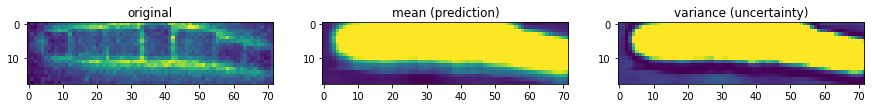

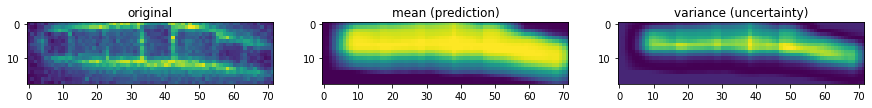

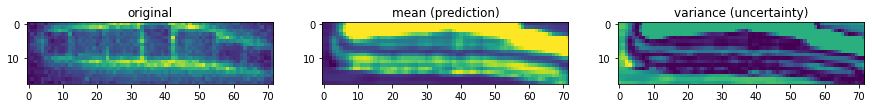

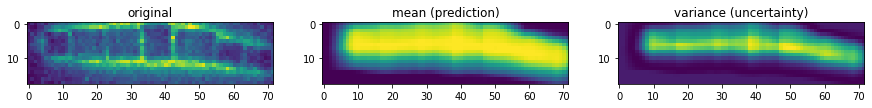

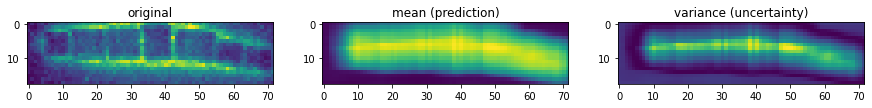

...

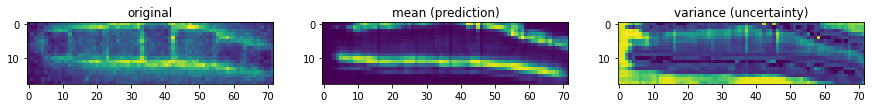

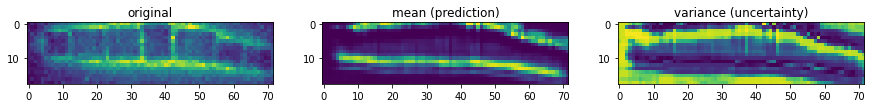

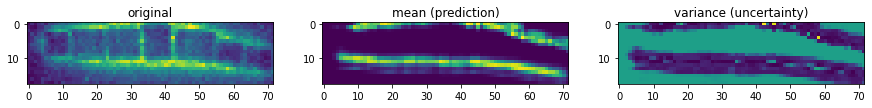

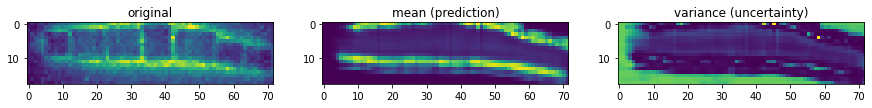

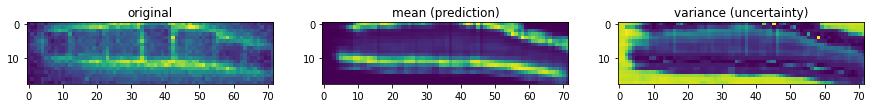

In [ ]:
# Set band 2 as target property

y_targ = peaks_all_scalar2    #training output;
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_counter1 = "/counter_band2/"

# run DKL counterfactual with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_counterfactual(y, save_counter1, num_cycles)

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_counterfactual(y, save_counter1, num_cycles)

1/20
Epoch 1/200 ... Training loss: 0.9206
Epoch 10/200 ... Training loss: 0.8889
Epoch 20/200 ... Training loss: 0.8309
Epoch 30/200 ... Training loss: 0.7823
Epoch 40/200 ... Training loss: 0.7349
Epoch 50/200 ... Training loss: 0.6873
Epoch 60/200 ... Training loss: 0.6382
Epoch 70/200 ... Training loss: 0.5826
Epoch 80/200 ... Training loss: 0.5358
Epoch 90/200 ... Training loss: 0.4883
Epoch 100/200 ... Training loss: 0.4403
Epoch 110/200 ... Training loss: 0.3919
Epoch 120/200 ... Training loss: 0.3429
Epoch 130/200 ... Training loss: 0.2941
Epoch 140/200 ... Training loss: 0.2446
Epoch 150/200 ... Training loss: 0.1954
Epoch 160/200 ... Training loss: 0.1463
Epoch 170/200 ... Training loss: 0.0971
Epoch 180/200 ... Training loss: 0.048
Epoch 190/200 ... Training loss: -0.0012
Epoch 200/200 ... Training loss: -0.0494
2/20
Epoch 1/200 ... Training loss: 0.9675
Epoch 10/200 ... Training loss: 0.9207
Epoch 20/200 ... Training loss: 0.8673
Epoch 30/200 ... Training loss: 0.8192
Epoch

<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


2/20
Epoch 1/200 ... Training loss: 0.9675
Epoch 10/200 ... Training loss: 0.9207
Epoch 20/200 ... Training loss: 0.8673
Epoch 30/200 ... Training loss: 0.8192
Epoch 40/200 ... Training loss: 0.7741
Epoch 50/200 ... Training loss: 0.7318
Epoch 60/200 ... Training loss: 0.6916
Epoch 70/200 ... Training loss: 0.652
Epoch 80/200 ... Training loss: 0.6125
Epoch 90/200 ... Training loss: 0.5733
Epoch 100/200 ... Training loss: 0.5343
Epoch 110/200 ... Training loss: 0.4951
Epoch 120/200 ... Training loss: 0.4572
Epoch 130/200 ... Training loss: 0.4209
Epoch 140/200 ... Training loss: 0.3863
Epoch 150/200 ... Training loss: 0.3536
Epoch 160/200 ... Training loss: 0.3228
Epoch 170/200 ... Training loss: 0.2938
Epoch 180/200 ... Training loss: 0.2664
Epoch 190/200 ... Training loss: 0.2406
Epoch 200/200 ... Training loss: 0.216
3/20
Epoch 1/200 ... Training loss: 0.9487


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.9197
Epoch 20/200 ... Training loss: 0.8615
Epoch 30/200 ... Training loss: 0.8046
Epoch 40/200 ... Training loss: 0.7599
Epoch 50/200 ... Training loss: 0.7176
Epoch 60/200 ... Training loss: 0.6767
Epoch 70/200 ... Training loss: 0.6356
Epoch 80/200 ... Training loss: 0.5944
Epoch 90/200 ... Training loss: 0.5534
Epoch 100/200 ... Training loss: 0.5127
Epoch 110/200 ... Training loss: 0.4725
Epoch 120/200 ... Training loss: 0.4326
Epoch 130/200 ... Training loss: 0.3951
Epoch 140/200 ... Training loss: 0.3588
Epoch 150/200 ... Training loss: 0.324
Epoch 160/200 ... Training loss: 0.2907
Epoch 170/200 ... Training loss: 0.2589
Epoch 180/200 ... Training loss: 0.2287
Epoch 190/200 ... Training loss: 0.1998
Epoch 200/200 ... Training loss: 0.1722


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


4/20
Epoch 1/200 ... Training loss: 0.9448
Epoch 10/200 ... Training loss: 0.9062
Epoch 20/200 ... Training loss: 0.8565
Epoch 30/200 ... Training loss: 0.8088
Epoch 40/200 ... Training loss: 0.7652
Epoch 50/200 ... Training loss: 0.7237
Epoch 60/200 ... Training loss: 0.68
Epoch 70/200 ... Training loss: 0.637
Epoch 80/200 ... Training loss: 0.5944
Epoch 90/200 ... Training loss: 0.5525
Epoch 100/200 ... Training loss: 0.5129
Epoch 110/200 ... Training loss: 0.4709
Epoch 120/200 ... Training loss: 0.4316
Epoch 130/200 ... Training loss: 0.3934
Epoch 140/200 ... Training loss: 0.3562
Epoch 150/200 ... Training loss: 0.32
Epoch 160/200 ... Training loss: 0.2848
Epoch 170/200 ... Training loss: 0.2499
Epoch 180/200 ... Training loss: 0.2169
Epoch 190/200 ... Training loss: 0.1851
Epoch 200/200 ... Training loss: 0.1523
5/20
Epoch 1/200 ... Training loss: 0.9352


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.9
Epoch 20/200 ... Training loss: 0.8506
Epoch 30/200 ... Training loss: 0.8011
Epoch 40/200 ... Training loss: 0.7514
Epoch 50/200 ... Training loss: 0.7126
Epoch 60/200 ... Training loss: 0.6673
Epoch 70/200 ... Training loss: 0.6241
Epoch 80/200 ... Training loss: 0.5814
Epoch 90/200 ... Training loss: 0.5392
Epoch 100/200 ... Training loss: 0.4959
Epoch 110/200 ... Training loss: 0.4562
Epoch 120/200 ... Training loss: 0.4166
Epoch 130/200 ... Training loss: 0.378
Epoch 140/200 ... Training loss: 0.3398
Epoch 150/200 ... Training loss: 0.3043
Epoch 160/200 ... Training loss: 0.2679
Epoch 170/200 ... Training loss: 0.2294
Epoch 180/200 ... Training loss: 0.1932
Epoch 190/200 ... Training loss: 0.1571
Epoch 200/200 ... Training loss: 0.1232
6/20
Epoch 1/200 ... Training loss: 0.9238


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8921
Epoch 20/200 ... Training loss: 0.8373
Epoch 30/200 ... Training loss: 0.7921
Epoch 40/200 ... Training loss: 0.7479
Epoch 50/200 ... Training loss: 0.7034
Epoch 60/200 ... Training loss: 0.6599
Epoch 70/200 ... Training loss: 0.6173
Epoch 80/200 ... Training loss: 0.575
Epoch 90/200 ... Training loss: 0.5331
Epoch 100/200 ... Training loss: 0.4917
Epoch 110/200 ... Training loss: 0.4508
Epoch 120/200 ... Training loss: 0.4108
Epoch 130/200 ... Training loss: 0.3709
Epoch 140/200 ... Training loss: 0.3309
Epoch 150/200 ... Training loss: 0.2913
Epoch 160/200 ... Training loss: 0.2524
Epoch 170/200 ... Training loss: 0.2147
Epoch 180/200 ... Training loss: 0.179
Epoch 190/200 ... Training loss: 0.1451
Epoch 200/200 ... Training loss: 0.1104
7/20
Epoch 1/200 ... Training loss: 0.9201


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.866
Epoch 20/200 ... Training loss: 0.8233
Epoch 30/200 ... Training loss: 0.7819
Epoch 40/200 ... Training loss: 0.7368
Epoch 50/200 ... Training loss: 0.6939
Epoch 60/200 ... Training loss: 0.6504
Epoch 70/200 ... Training loss: 0.6068
Epoch 80/200 ... Training loss: 0.5637
Epoch 90/200 ... Training loss: 0.5216
Epoch 100/200 ... Training loss: 0.4783
Epoch 110/200 ... Training loss: 0.4384
Epoch 120/200 ... Training loss: 0.3976
Epoch 130/200 ... Training loss: 0.3569
Epoch 140/200 ... Training loss: 0.3148
Epoch 150/200 ... Training loss: 0.2733
Epoch 160/200 ... Training loss: 0.2336
Epoch 170/200 ... Training loss: 0.1963
Epoch 180/200 ... Training loss: 0.1605
Epoch 190/200 ... Training loss: 0.1257
Epoch 200/200 ... Training loss: 0.0916


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


8/20
Epoch 1/200 ... Training loss: 0.9274
Epoch 10/200 ... Training loss: 0.8737
Epoch 20/200 ... Training loss: 0.823
Epoch 30/200 ... Training loss: 0.7723
Epoch 40/200 ... Training loss: 0.7281
Epoch 50/200 ... Training loss: 0.6846
Epoch 60/200 ... Training loss: 0.6412
Epoch 70/200 ... Training loss: 0.5979
Epoch 80/200 ... Training loss: 0.5535
Epoch 90/200 ... Training loss: 0.5109
Epoch 100/200 ... Training loss: 0.4694
Epoch 110/200 ... Training loss: 0.428
Epoch 120/200 ... Training loss: 0.3863
Epoch 130/200 ... Training loss: 0.3448
Epoch 140/200 ... Training loss: 0.3042
Epoch 150/200 ... Training loss: 0.2656
Epoch 160/200 ... Training loss: 0.2249
Epoch 170/200 ... Training loss: 0.1859
Epoch 180/200 ... Training loss: 0.1482
Epoch 190/200 ... Training loss: 0.1112
Epoch 200/200 ... Training loss: 0.0753
9/20
Epoch 1/200 ... Training loss: 0.919


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8648
Epoch 20/200 ... Training loss: 0.8172
Epoch 30/200 ... Training loss: 0.7858
Epoch 40/200 ... Training loss: 0.7271
Epoch 50/200 ... Training loss: 0.6832
Epoch 60/200 ... Training loss: 0.6389
Epoch 70/200 ... Training loss: 0.595
Epoch 80/200 ... Training loss: 0.5528
Epoch 90/200 ... Training loss: 0.5106
Epoch 100/200 ... Training loss: 0.469
Epoch 110/200 ... Training loss: 0.4277
Epoch 120/200 ... Training loss: 0.3867
Epoch 130/200 ... Training loss: 0.3459
Epoch 140/200 ... Training loss: 0.3058
Epoch 150/200 ... Training loss: 0.267
Epoch 160/200 ... Training loss: 0.2273
Epoch 170/200 ... Training loss: 0.1859
Epoch 180/200 ... Training loss: 0.1466
Epoch 190/200 ... Training loss: 0.1085
Epoch 200/200 ... Training loss: 0.0715


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


10/20
Epoch 1/200 ... Training loss: 0.9171
Epoch 10/200 ... Training loss: 0.8588
Epoch 20/200 ... Training loss: 0.8154
Epoch 30/200 ... Training loss: 0.7685
Epoch 40/200 ... Training loss: 0.7237
Epoch 50/200 ... Training loss: 0.6774
Epoch 60/200 ... Training loss: 0.6333
Epoch 70/200 ... Training loss: 0.5901
Epoch 80/200 ... Training loss: 0.5476
Epoch 90/200 ... Training loss: 0.5053
Epoch 100/200 ... Training loss: 0.4632
Epoch 110/200 ... Training loss: 0.421
Epoch 120/200 ... Training loss: 0.3792
Epoch 130/200 ... Training loss: 0.3375
Epoch 140/200 ... Training loss: 0.2961
Epoch 150/200 ... Training loss: 0.2554
Epoch 160/200 ... Training loss: 0.2154
Epoch 170/200 ... Training loss: 0.176
Epoch 180/200 ... Training loss: 0.1373
Epoch 190/200 ... Training loss: 0.0992
Epoch 200/200 ... Training loss: 0.0616
11/20
Epoch 1/200 ... Training loss: 0.9123


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8463
Epoch 20/200 ... Training loss: 0.804
Epoch 30/200 ... Training loss: 0.7633
Epoch 40/200 ... Training loss: 0.7182
Epoch 50/200 ... Training loss: 0.6752
Epoch 60/200 ... Training loss: 0.6314
Epoch 70/200 ... Training loss: 0.5884
Epoch 80/200 ... Training loss: 0.5461
Epoch 90/200 ... Training loss: 0.5042
Epoch 100/200 ... Training loss: 0.462
Epoch 110/200 ... Training loss: 0.4193
Epoch 120/200 ... Training loss: 0.376
Epoch 130/200 ... Training loss: 0.3349
Epoch 140/200 ... Training loss: 0.2926
Epoch 150/200 ... Training loss: 0.2513
Epoch 160/200 ... Training loss: 0.2102
Epoch 170/200 ... Training loss: 0.1697
Epoch 180/200 ... Training loss: 0.1299
Epoch 190/200 ... Training loss: 0.0907
Epoch 200/200 ... Training loss: 0.0519


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


12/20
Epoch 1/200 ... Training loss: 0.9047
Epoch 10/200 ... Training loss: 0.8589
Epoch 20/200 ... Training loss: 0.8085
Epoch 30/200 ... Training loss: 0.76
Epoch 40/200 ... Training loss: 0.715
Epoch 50/200 ... Training loss: 0.6707
Epoch 60/200 ... Training loss: 0.6287
Epoch 70/200 ... Training loss: 0.5872
Epoch 80/200 ... Training loss: 0.544
Epoch 90/200 ... Training loss: 0.5021
Epoch 100/200 ... Training loss: 0.4603
Epoch 110/200 ... Training loss: 0.4187
Epoch 120/200 ... Training loss: 0.377
Epoch 130/200 ... Training loss: 0.3354
Epoch 140/200 ... Training loss: 0.2936
Epoch 150/200 ... Training loss: 0.2515
Epoch 160/200 ... Training loss: 0.2092
Epoch 170/200 ... Training loss: 0.1661
Epoch 180/200 ... Training loss: 0.1242
Epoch 190/200 ... Training loss: 0.0835
Epoch 200/200 ... Training loss: 0.0435
13/20
Epoch 1/200 ... Training loss: 0.9015


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8508
Epoch 20/200 ... Training loss: 0.801
Epoch 30/200 ... Training loss: 0.7562
Epoch 40/200 ... Training loss: 0.7132
Epoch 50/200 ... Training loss: 0.6707
Epoch 60/200 ... Training loss: 0.6263
Epoch 70/200 ... Training loss: 0.5819
Epoch 80/200 ... Training loss: 0.5369
Epoch 90/200 ... Training loss: 0.4928
Epoch 100/200 ... Training loss: 0.4494
Epoch 110/200 ... Training loss: 0.4063
Epoch 120/200 ... Training loss: 0.3633
Epoch 130/200 ... Training loss: 0.3203
Epoch 140/200 ... Training loss: 0.2776
Epoch 150/200 ... Training loss: 0.2352
Epoch 160/200 ... Training loss: 0.1932
Epoch 170/200 ... Training loss: 0.1517
Epoch 180/200 ... Training loss: 0.1108
Epoch 190/200 ... Training loss: 0.0704
Epoch 200/200 ... Training loss: 0.0304


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


14/20
Epoch 1/200 ... Training loss: 0.8952
Epoch 10/200 ... Training loss: 0.8405
Epoch 20/200 ... Training loss: 0.7998
Epoch 30/200 ... Training loss: 0.753
Epoch 40/200 ... Training loss: 0.7099
Epoch 50/200 ... Training loss: 0.6663
Epoch 60/200 ... Training loss: 0.6225
Epoch 70/200 ... Training loss: 0.5786
Epoch 80/200 ... Training loss: 0.534
Epoch 90/200 ... Training loss: 0.4889
Epoch 100/200 ... Training loss: 0.4451
Epoch 110/200 ... Training loss: 0.4017
Epoch 120/200 ... Training loss: 0.3584
Epoch 130/200 ... Training loss: 0.3154
Epoch 140/200 ... Training loss: 0.2725
Epoch 150/200 ... Training loss: 0.2299
Epoch 160/200 ... Training loss: 0.1873
Epoch 170/200 ... Training loss: 0.1452
Epoch 180/200 ... Training loss: 0.1036
Epoch 190/200 ... Training loss: 0.0626
Epoch 200/200 ... Training loss: 0.022


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


15/20
Epoch 1/200 ... Training loss: 0.8895
Epoch 10/200 ... Training loss: 0.8407
Epoch 20/200 ... Training loss: 0.7943
Epoch 30/200 ... Training loss: 0.7492
Epoch 40/200 ... Training loss: 0.7053
Epoch 50/200 ... Training loss: 0.6611
Epoch 60/200 ... Training loss: 0.6164
Epoch 70/200 ... Training loss: 0.5736
Epoch 80/200 ... Training loss: 0.5274
Epoch 90/200 ... Training loss: 0.4845
Epoch 100/200 ... Training loss: 0.4408
Epoch 110/200 ... Training loss: 0.3973
Epoch 120/200 ... Training loss: 0.3539
Epoch 130/200 ... Training loss: 0.3108
Epoch 140/200 ... Training loss: 0.2676
Epoch 150/200 ... Training loss: 0.2241
Epoch 160/200 ... Training loss: 0.1811
Epoch 170/200 ... Training loss: 0.1386
Epoch 180/200 ... Training loss: 0.0967
Epoch 190/200 ... Training loss: 0.0551
Epoch 200/200 ... Training loss: 0.014
16/20
Epoch 1/200 ... Training loss: 0.8862


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8366
Epoch 20/200 ... Training loss: 0.7903
Epoch 30/200 ... Training loss: 0.7456
Epoch 40/200 ... Training loss: 0.7027
Epoch 50/200 ... Training loss: 0.6596
Epoch 60/200 ... Training loss: 0.6161
Epoch 70/200 ... Training loss: 0.5731
Epoch 80/200 ... Training loss: 0.5301
Epoch 90/200 ... Training loss: 0.4869
Epoch 100/200 ... Training loss: 0.4423
Epoch 110/200 ... Training loss: 0.3972
Epoch 120/200 ... Training loss: 0.3526
Epoch 130/200 ... Training loss: 0.3088
Epoch 140/200 ... Training loss: 0.2665
Epoch 150/200 ... Training loss: 0.2235
Epoch 160/200 ... Training loss: 0.1789
Epoch 170/200 ... Training loss: 0.1354
Epoch 180/200 ... Training loss: 0.0924
Epoch 190/200 ... Training loss: 0.0498
Epoch 200/200 ... Training loss: 0.0076


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


17/20
Epoch 1/200 ... Training loss: 0.8815
Epoch 10/200 ... Training loss: 0.8251
Epoch 20/200 ... Training loss: 0.7851
Epoch 30/200 ... Training loss: 0.7426
Epoch 40/200 ... Training loss: 0.6987
Epoch 50/200 ... Training loss: 0.655
Epoch 60/200 ... Training loss: 0.6112
Epoch 70/200 ... Training loss: 0.5674
Epoch 80/200 ... Training loss: 0.5234
Epoch 90/200 ... Training loss: 0.4791
Epoch 100/200 ... Training loss: 0.4349
Epoch 110/200 ... Training loss: 0.3905
Epoch 120/200 ... Training loss: 0.3465
Epoch 130/200 ... Training loss: 0.3025
Epoch 140/200 ... Training loss: 0.2585
Epoch 150/200 ... Training loss: 0.2145
Epoch 160/200 ... Training loss: 0.1709
Epoch 170/200 ... Training loss: 0.1277
Epoch 180/200 ... Training loss: 0.0849
Epoch 190/200 ... Training loss: 0.0425
Epoch 200/200 ... Training loss: 0.0004
18/20
Epoch 1/200 ... Training loss: 0.8772


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.821
Epoch 20/200 ... Training loss: 0.7802
Epoch 30/200 ... Training loss: 0.7365
Epoch 40/200 ... Training loss: 0.693
Epoch 50/200 ... Training loss: 0.6506
Epoch 60/200 ... Training loss: 0.6083
Epoch 70/200 ... Training loss: 0.5655
Epoch 80/200 ... Training loss: 0.5221
Epoch 90/200 ... Training loss: 0.4781
Epoch 100/200 ... Training loss: 0.4336
Epoch 110/200 ... Training loss: 0.3889
Epoch 120/200 ... Training loss: 0.3445
Epoch 130/200 ... Training loss: 0.3002
Epoch 140/200 ... Training loss: 0.2573
Epoch 150/200 ... Training loss: 0.2138
Epoch 160/200 ... Training loss: 0.1701
Epoch 170/200 ... Training loss: 0.1256
Epoch 180/200 ... Training loss: 0.0817
Epoch 190/200 ... Training loss: 0.0384
Epoch 200/200 ... Training loss: -0.0045
19/20
Epoch 1/200 ... Training loss: 0.8756


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8256
Epoch 20/200 ... Training loss: 0.781
Epoch 30/200 ... Training loss: 0.7396
Epoch 40/200 ... Training loss: 0.6932
Epoch 50/200 ... Training loss: 0.6505
Epoch 60/200 ... Training loss: 0.6076
Epoch 70/200 ... Training loss: 0.5645
Epoch 80/200 ... Training loss: 0.5212
Epoch 90/200 ... Training loss: 0.4777
Epoch 100/200 ... Training loss: 0.4341
Epoch 110/200 ... Training loss: 0.3902
Epoch 120/200 ... Training loss: 0.3456
Epoch 130/200 ... Training loss: 0.3002
Epoch 140/200 ... Training loss: 0.2548
Epoch 150/200 ... Training loss: 0.2103
Epoch 160/200 ... Training loss: 0.1659
Epoch 170/200 ... Training loss: 0.1207
Epoch 180/200 ... Training loss: 0.0764
Epoch 190/200 ... Training loss: 0.0326
Epoch 200/200 ... Training loss: -0.0108


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


20/20
Epoch 1/200 ... Training loss: 0.8728
Epoch 10/200 ... Training loss: 0.8263
Epoch 20/200 ... Training loss: 0.7725
Epoch 30/200 ... Training loss: 0.7298
Epoch 40/200 ... Training loss: 0.6875
Epoch 50/200 ... Training loss: 0.6522
Epoch 60/200 ... Training loss: 0.6064
Epoch 70/200 ... Training loss: 0.5616
Epoch 80/200 ... Training loss: 0.5188
Epoch 90/200 ... Training loss: 0.4756
Epoch 100/200 ... Training loss: 0.4336
Epoch 110/200 ... Training loss: 0.3913
Epoch 120/200 ... Training loss: 0.3482
Epoch 130/200 ... Training loss: 0.3055
Epoch 140/200 ... Training loss: 0.2627
Epoch 150/200 ... Training loss: 0.2194
Epoch 160/200 ... Training loss: 0.1747
Epoch 170/200 ... Training loss: 0.1269
Epoch 180/200 ... Training loss: 0.0812
Epoch 190/200 ... Training loss: 0.0361
Epoch 200/200 ... Training loss: -0.0081
1/20
Epoch 1/200 ... Training loss: 0.9206


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8889
Epoch 20/200 ... Training loss: 0.8309
Epoch 30/200 ... Training loss: 0.7823
Epoch 40/200 ... Training loss: 0.7349
Epoch 50/200 ... Training loss: 0.6873
Epoch 60/200 ... Training loss: 0.6382
Epoch 70/200 ... Training loss: 0.5826
Epoch 80/200 ... Training loss: 0.5358
Epoch 90/200 ... Training loss: 0.4883
Epoch 100/200 ... Training loss: 0.4403
Epoch 110/200 ... Training loss: 0.3919
Epoch 120/200 ... Training loss: 0.3429
Epoch 130/200 ... Training loss: 0.2941
Epoch 140/200 ... Training loss: 0.2446
Epoch 150/200 ... Training loss: 0.1954
Epoch 160/200 ... Training loss: 0.1463
Epoch 170/200 ... Training loss: 0.0971
Epoch 180/200 ... Training loss: 0.048
Epoch 190/200 ... Training loss: -0.0012
Epoch 200/200 ... Training loss: -0.0494
2/20
Epoch 1/200 ... Training loss: 0.9675


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.9207
Epoch 20/200 ... Training loss: 0.8673
Epoch 30/200 ... Training loss: 0.8192
Epoch 40/200 ... Training loss: 0.7741
Epoch 50/200 ... Training loss: 0.7318
Epoch 60/200 ... Training loss: 0.6916
Epoch 70/200 ... Training loss: 0.652
Epoch 80/200 ... Training loss: 0.6125
Epoch 90/200 ... Training loss: 0.5733
Epoch 100/200 ... Training loss: 0.5343
Epoch 110/200 ... Training loss: 0.4951
Epoch 120/200 ... Training loss: 0.4572
Epoch 130/200 ... Training loss: 0.4209
Epoch 140/200 ... Training loss: 0.3863
Epoch 150/200 ... Training loss: 0.3536
Epoch 160/200 ... Training loss: 0.3228
Epoch 170/200 ... Training loss: 0.2938
Epoch 180/200 ... Training loss: 0.2664
Epoch 190/200 ... Training loss: 0.2406
Epoch 200/200 ... Training loss: 0.216


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


3/20
Epoch 1/200 ... Training loss: 0.9512
Epoch 10/200 ... Training loss: 0.9171
Epoch 20/200 ... Training loss: 0.8592
Epoch 30/200 ... Training loss: 0.8061
Epoch 40/200 ... Training loss: 0.7589
Epoch 50/200 ... Training loss: 0.7166
Epoch 60/200 ... Training loss: 0.6758
Epoch 70/200 ... Training loss: 0.635
Epoch 80/200 ... Training loss: 0.5941
Epoch 90/200 ... Training loss: 0.5533
Epoch 100/200 ... Training loss: 0.5129
Epoch 110/200 ... Training loss: 0.4729
Epoch 120/200 ... Training loss: 0.434
Epoch 130/200 ... Training loss: 0.3968
Epoch 140/200 ... Training loss: 0.3608
Epoch 150/200 ... Training loss: 0.3263
Epoch 160/200 ... Training loss: 0.2934
Epoch 170/200 ... Training loss: 0.2621
Epoch 180/200 ... Training loss: 0.2324
Epoch 190/200 ... Training loss: 0.2042
Epoch 200/200 ... Training loss: 0.1774
4/20
Epoch 1/200 ... Training loss: 0.9545


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8956
Epoch 20/200 ... Training loss: 0.8519
Epoch 30/200 ... Training loss: 0.8025
Epoch 40/200 ... Training loss: 0.7552
Epoch 50/200 ... Training loss: 0.71
Epoch 60/200 ... Training loss: 0.6658
Epoch 70/200 ... Training loss: 0.6232
Epoch 80/200 ... Training loss: 0.5822
Epoch 90/200 ... Training loss: 0.5414
Epoch 100/200 ... Training loss: 0.5002
Epoch 110/200 ... Training loss: 0.4601
Epoch 120/200 ... Training loss: 0.4187
Epoch 130/200 ... Training loss: 0.3794
Epoch 140/200 ... Training loss: 0.3416
Epoch 150/200 ... Training loss: 0.3052
Epoch 160/200 ... Training loss: 0.2702
Epoch 170/200 ... Training loss: 0.2367
Epoch 180/200 ... Training loss: 0.2045
Epoch 190/200 ... Training loss: 0.1738
Epoch 200/200 ... Training loss: 0.1443


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


5/20
Epoch 1/200 ... Training loss: 0.9512
Epoch 10/200 ... Training loss: 0.8822
Epoch 20/200 ... Training loss: 0.8377
Epoch 30/200 ... Training loss: 0.7942
Epoch 40/200 ... Training loss: 0.7471
Epoch 50/200 ... Training loss: 0.7034
Epoch 60/200 ... Training loss: 0.6612
Epoch 70/200 ... Training loss: 0.6187
Epoch 80/200 ... Training loss: 0.5764
Epoch 90/200 ... Training loss: 0.5349
Epoch 100/200 ... Training loss: 0.4942
Epoch 110/200 ... Training loss: 0.4542
Epoch 120/200 ... Training loss: 0.4145
Epoch 130/200 ... Training loss: 0.375
Epoch 140/200 ... Training loss: 0.334
Epoch 150/200 ... Training loss: 0.2956
Epoch 160/200 ... Training loss: 0.2579
Epoch 170/200 ... Training loss: 0.2213
Epoch 180/200 ... Training loss: 0.1861
Epoch 190/200 ... Training loss: 0.1533
Epoch 200/200 ... Training loss: 0.1213
6/20
Epoch 1/200 ... Training loss: 0.9402


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8747
Epoch 20/200 ... Training loss: 0.8284
Epoch 30/200 ... Training loss: 0.7848
Epoch 40/200 ... Training loss: 0.7506
Epoch 50/200 ... Training loss: 0.6966
Epoch 60/200 ... Training loss: 0.6539
Epoch 70/200 ... Training loss: 0.611
Epoch 80/200 ... Training loss: 0.5685
Epoch 90/200 ... Training loss: 0.5263
Epoch 100/200 ... Training loss: 0.4844
Epoch 110/200 ... Training loss: 0.4428
Epoch 120/200 ... Training loss: 0.4007
Epoch 130/200 ... Training loss: 0.3581
Epoch 140/200 ... Training loss: 0.3171
Epoch 150/200 ... Training loss: 0.2765
Epoch 160/200 ... Training loss: 0.2385
Epoch 170/200 ... Training loss: 0.2019
Epoch 180/200 ... Training loss: 0.1665
Epoch 190/200 ... Training loss: 0.1324
Epoch 200/200 ... Training loss: 0.0994


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


7/20
Epoch 1/200 ... Training loss: 0.9328
Epoch 10/200 ... Training loss: 0.8639
Epoch 20/200 ... Training loss: 0.8248
Epoch 30/200 ... Training loss: 0.778
Epoch 40/200 ... Training loss: 0.7307
Epoch 50/200 ... Training loss: 0.6882
Epoch 60/200 ... Training loss: 0.6452
Epoch 70/200 ... Training loss: 0.6027
Epoch 80/200 ... Training loss: 0.5599
Epoch 90/200 ... Training loss: 0.5172
Epoch 100/200 ... Training loss: 0.4745
Epoch 110/200 ... Training loss: 0.4318
Epoch 120/200 ... Training loss: 0.3899
Epoch 130/200 ... Training loss: 0.3485
Epoch 140/200 ... Training loss: 0.3074
Epoch 150/200 ... Training loss: 0.2674
Epoch 160/200 ... Training loss: 0.2265
Epoch 170/200 ... Training loss: 0.1877
Epoch 180/200 ... Training loss: 0.1509
Epoch 190/200 ... Training loss: 0.1154
Epoch 200/200 ... Training loss: 0.081
8/20
Epoch 1/200 ... Training loss: 0.9259


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8761
Epoch 20/200 ... Training loss: 0.8156
Epoch 30/200 ... Training loss: 0.7695
Epoch 40/200 ... Training loss: 0.7262
Epoch 50/200 ... Training loss: 0.6831
Epoch 60/200 ... Training loss: 0.64
Epoch 70/200 ... Training loss: 0.5977
Epoch 80/200 ... Training loss: 0.5552
Epoch 90/200 ... Training loss: 0.5128
Epoch 100/200 ... Training loss: 0.4706
Epoch 110/200 ... Training loss: 0.4288
Epoch 120/200 ... Training loss: 0.3875
Epoch 130/200 ... Training loss: 0.3468
Epoch 140/200 ... Training loss: 0.3068
Epoch 150/200 ... Training loss: 0.2674
Epoch 160/200 ... Training loss: 0.2288
Epoch 170/200 ... Training loss: 0.191
Epoch 180/200 ... Training loss: 0.1539
Epoch 190/200 ... Training loss: 0.1174
Epoch 200/200 ... Training loss: 0.0814


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


9/20
Epoch 1/200 ... Training loss: 0.9183
Epoch 10/200 ... Training loss: 0.8537
Epoch 20/200 ... Training loss: 0.8026
Epoch 30/200 ... Training loss: 0.7574
Epoch 40/200 ... Training loss: 0.7145
Epoch 50/200 ... Training loss: 0.6719
Epoch 60/200 ... Training loss: 0.6286
Epoch 70/200 ... Training loss: 0.5843
Epoch 80/200 ... Training loss: 0.5416
Epoch 90/200 ... Training loss: 0.4993
Epoch 100/200 ... Training loss: 0.457
Epoch 110/200 ... Training loss: 0.4147
Epoch 120/200 ... Training loss: 0.3732
Epoch 130/200 ... Training loss: 0.3325
Epoch 140/200 ... Training loss: 0.2905
Epoch 150/200 ... Training loss: 0.2492
Epoch 160/200 ... Training loss: 0.2085
Epoch 170/200 ... Training loss: 0.1686
Epoch 180/200 ... Training loss: 0.1298
Epoch 190/200 ... Training loss: 0.0919
Epoch 200/200 ... Training loss: 0.0548
10/20
Epoch 1/200 ... Training loss: 0.911


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8429
Epoch 20/200 ... Training loss: 0.801
Epoch 30/200 ... Training loss: 0.7551
Epoch 40/200 ... Training loss: 0.7103
Epoch 50/200 ... Training loss: 0.6653
Epoch 60/200 ... Training loss: 0.6195
Epoch 70/200 ... Training loss: 0.5764
Epoch 80/200 ... Training loss: 0.5341
Epoch 90/200 ... Training loss: 0.4914
Epoch 100/200 ... Training loss: 0.4488
Epoch 110/200 ... Training loss: 0.4061
Epoch 120/200 ... Training loss: 0.3633
Epoch 130/200 ... Training loss: 0.3206
Epoch 140/200 ... Training loss: 0.2778
Epoch 150/200 ... Training loss: 0.2363
Epoch 160/200 ... Training loss: 0.1956
Epoch 170/200 ... Training loss: 0.1557
Epoch 180/200 ... Training loss: 0.1166
Epoch 190/200 ... Training loss: 0.0783
Epoch 200/200 ... Training loss: 0.0408
11/20
Epoch 1/200 ... Training loss: 0.9046


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8448
Epoch 20/200 ... Training loss: 0.7926
Epoch 30/200 ... Training loss: 0.7465
Epoch 40/200 ... Training loss: 0.7035
Epoch 50/200 ... Training loss: 0.6602
Epoch 60/200 ... Training loss: 0.6161
Epoch 70/200 ... Training loss: 0.572
Epoch 80/200 ... Training loss: 0.5293
Epoch 90/200 ... Training loss: 0.4865
Epoch 100/200 ... Training loss: 0.4436
Epoch 110/200 ... Training loss: 0.4007
Epoch 120/200 ... Training loss: 0.3577
Epoch 130/200 ... Training loss: 0.3143
Epoch 140/200 ... Training loss: 0.2712
Epoch 150/200 ... Training loss: 0.2292
Epoch 160/200 ... Training loss: 0.188
Epoch 170/200 ... Training loss: 0.1473
Epoch 180/200 ... Training loss: 0.1075
Epoch 190/200 ... Training loss: 0.0685
Epoch 200/200 ... Training loss: 0.0301


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


12/20
Epoch 1/200 ... Training loss: 0.8985
Epoch 10/200 ... Training loss: 0.8434
Epoch 20/200 ... Training loss: 0.7927
Epoch 30/200 ... Training loss: 0.7452
Epoch 40/200 ... Training loss: 0.6977
Epoch 50/200 ... Training loss: 0.6548
Epoch 60/200 ... Training loss: 0.6093
Epoch 70/200 ... Training loss: 0.5692
Epoch 80/200 ... Training loss: 0.5248
Epoch 90/200 ... Training loss: 0.4828
Epoch 100/200 ... Training loss: 0.4404
Epoch 110/200 ... Training loss: 0.3974
Epoch 120/200 ... Training loss: 0.3545
Epoch 130/200 ... Training loss: 0.3117
Epoch 140/200 ... Training loss: 0.2686
Epoch 150/200 ... Training loss: 0.2261
Epoch 160/200 ... Training loss: 0.184
Epoch 170/200 ... Training loss: 0.1426
Epoch 180/200 ... Training loss: 0.1023
Epoch 190/200 ... Training loss: 0.0627
Epoch 200/200 ... Training loss: 0.0237
13/20
Epoch 1/200 ... Training loss: 0.8932


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8351
Epoch 20/200 ... Training loss: 0.7853
Epoch 30/200 ... Training loss: 0.7398
Epoch 40/200 ... Training loss: 0.6981
Epoch 50/200 ... Training loss: 0.6547
Epoch 60/200 ... Training loss: 0.6108
Epoch 70/200 ... Training loss: 0.5662
Epoch 80/200 ... Training loss: 0.5236
Epoch 90/200 ... Training loss: 0.482
Epoch 100/200 ... Training loss: 0.4387
Epoch 110/200 ... Training loss: 0.3961
Epoch 120/200 ... Training loss: 0.353
Epoch 130/200 ... Training loss: 0.3097
Epoch 140/200 ... Training loss: 0.2668
Epoch 150/200 ... Training loss: 0.2241
Epoch 160/200 ... Training loss: 0.182
Epoch 170/200 ... Training loss: 0.1403
Epoch 180/200 ... Training loss: 0.0991
Epoch 190/200 ... Training loss: 0.0586
Epoch 200/200 ... Training loss: 0.0185


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


14/20
Epoch 1/200 ... Training loss: 0.8879
Epoch 10/200 ... Training loss: 0.8266
Epoch 20/200 ... Training loss: 0.7783
Epoch 30/200 ... Training loss: 0.7355
Epoch 40/200 ... Training loss: 0.693
Epoch 50/200 ... Training loss: 0.6455
Epoch 60/200 ... Training loss: 0.6031
Epoch 70/200 ... Training loss: 0.5606
Epoch 80/200 ... Training loss: 0.5187
Epoch 90/200 ... Training loss: 0.4765
Epoch 100/200 ... Training loss: 0.4341
Epoch 110/200 ... Training loss: 0.3922
Epoch 120/200 ... Training loss: 0.3489
Epoch 130/200 ... Training loss: 0.3058
Epoch 140/200 ... Training loss: 0.2626
Epoch 150/200 ... Training loss: 0.2198
Epoch 160/200 ... Training loss: 0.1775
Epoch 170/200 ... Training loss: 0.1355
Epoch 180/200 ... Training loss: 0.0941
Epoch 190/200 ... Training loss: 0.0532
Epoch 200/200 ... Training loss: 0.0128
15/20
Epoch 1/200 ... Training loss: 0.8847


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8261
Epoch 20/200 ... Training loss: 0.7808
Epoch 30/200 ... Training loss: 0.7369
Epoch 40/200 ... Training loss: 0.7132
Epoch 50/200 ... Training loss: 0.6515
Epoch 60/200 ... Training loss: 0.6093
Epoch 70/200 ... Training loss: 0.5666
Epoch 80/200 ... Training loss: 0.5235
Epoch 90/200 ... Training loss: 0.4804
Epoch 100/200 ... Training loss: 0.4372
Epoch 110/200 ... Training loss: 0.3941
Epoch 120/200 ... Training loss: 0.351
Epoch 130/200 ... Training loss: 0.3082
Epoch 140/200 ... Training loss: 0.2656
Epoch 150/200 ... Training loss: 0.2233
Epoch 160/200 ... Training loss: 0.1815
Epoch 170/200 ... Training loss: 0.14
Epoch 180/200 ... Training loss: 0.0988
Epoch 190/200 ... Training loss: 0.0573
Epoch 200/200 ... Training loss: 0.0156


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


16/20
Epoch 1/200 ... Training loss: 0.881
Epoch 10/200 ... Training loss: 0.8217
Epoch 20/200 ... Training loss: 0.7771
Epoch 30/200 ... Training loss: 0.7313
Epoch 40/200 ... Training loss: 0.6887
Epoch 50/200 ... Training loss: 0.646
Epoch 60/200 ... Training loss: 0.6032
Epoch 70/200 ... Training loss: 0.5608
Epoch 80/200 ... Training loss: 0.5172
Epoch 90/200 ... Training loss: 0.473
Epoch 100/200 ... Training loss: 0.4283
Epoch 110/200 ... Training loss: 0.3852
Epoch 120/200 ... Training loss: 0.3419
Epoch 130/200 ... Training loss: 0.2987
Epoch 140/200 ... Training loss: 0.2555
Epoch 150/200 ... Training loss: 0.2123
Epoch 160/200 ... Training loss: 0.1705
Epoch 170/200 ... Training loss: 0.128
Epoch 180/200 ... Training loss: 0.0856
Epoch 190/200 ... Training loss: 0.0432
Epoch 200/200 ... Training loss: 0.0013
17/20
Epoch 1/200 ... Training loss: 0.8765


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8187
Epoch 20/200 ... Training loss: 0.7747
Epoch 30/200 ... Training loss: 0.7299
Epoch 40/200 ... Training loss: 0.6867
Epoch 50/200 ... Training loss: 0.644
Epoch 60/200 ... Training loss: 0.5993
Epoch 70/200 ... Training loss: 0.5592
Epoch 80/200 ... Training loss: 0.5167
Epoch 90/200 ... Training loss: 0.4735
Epoch 100/200 ... Training loss: 0.4301
Epoch 110/200 ... Training loss: 0.3866
Epoch 120/200 ... Training loss: 0.3429
Epoch 130/200 ... Training loss: 0.2988
Epoch 140/200 ... Training loss: 0.2561
Epoch 150/200 ... Training loss: 0.213
Epoch 160/200 ... Training loss: 0.1699
Epoch 170/200 ... Training loss: 0.1271
Epoch 180/200 ... Training loss: 0.0844
Epoch 190/200 ... Training loss: 0.0422
Epoch 200/200 ... Training loss: 0.0003


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


18/20
Epoch 1/200 ... Training loss: 0.8737
Epoch 10/200 ... Training loss: 0.8152
Epoch 20/200 ... Training loss: 0.7662
Epoch 30/200 ... Training loss: 0.7227
Epoch 40/200 ... Training loss: 0.6809
Epoch 50/200 ... Training loss: 0.6387
Epoch 60/200 ... Training loss: 0.5944
Epoch 70/200 ... Training loss: 0.5496
Epoch 80/200 ... Training loss: 0.5073
Epoch 90/200 ... Training loss: 0.4645
Epoch 100/200 ... Training loss: 0.4217
Epoch 110/200 ... Training loss: 0.3786
Epoch 120/200 ... Training loss: 0.3354
Epoch 130/200 ... Training loss: 0.2922
Epoch 140/200 ... Training loss: 0.2486
Epoch 150/200 ... Training loss: 0.2045
Epoch 160/200 ... Training loss: 0.1607
Epoch 170/200 ... Training loss: 0.1172
Epoch 180/200 ... Training loss: 0.074
Epoch 190/200 ... Training loss: 0.0312
Epoch 200/200 ... Training loss: -0.0113
19/20
Epoch 1/200 ... Training loss: 0.8709


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8106
Epoch 20/200 ... Training loss: 0.7669
Epoch 30/200 ... Training loss: 0.7221
Epoch 40/200 ... Training loss: 0.6801
Epoch 50/200 ... Training loss: 0.6382
Epoch 60/200 ... Training loss: 0.5963
Epoch 70/200 ... Training loss: 0.5594
Epoch 80/200 ... Training loss: 0.5124
Epoch 90/200 ... Training loss: 0.4691
Epoch 100/200 ... Training loss: 0.4249
Epoch 110/200 ... Training loss: 0.381
Epoch 120/200 ... Training loss: 0.3372
Epoch 130/200 ... Training loss: 0.2937
Epoch 140/200 ... Training loss: 0.2504
Epoch 150/200 ... Training loss: 0.2073
Epoch 160/200 ... Training loss: 0.1646
Epoch 170/200 ... Training loss: 0.1224
Epoch 180/200 ... Training loss: 0.0807
Epoch 190/200 ... Training loss: 0.0396
Epoch 200/200 ... Training loss: -0.0009
20/20
Epoch 1/200 ... Training loss: 0.8675


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8012
Epoch 20/200 ... Training loss: 0.7597
Epoch 30/200 ... Training loss: 0.7174
Epoch 40/200 ... Training loss: 0.6733
Epoch 50/200 ... Training loss: 0.6299
Epoch 60/200 ... Training loss: 0.5868
Epoch 70/200 ... Training loss: 0.5451
Epoch 80/200 ... Training loss: 0.5029
Epoch 90/200 ... Training loss: 0.4603
Epoch 100/200 ... Training loss: 0.4171
Epoch 110/200 ... Training loss: 0.3734
Epoch 120/200 ... Training loss: 0.3295
Epoch 130/200 ... Training loss: 0.2855
Epoch 140/200 ... Training loss: 0.2413
Epoch 150/200 ... Training loss: 0.1972
Epoch 160/200 ... Training loss: 0.1533
Epoch 170/200 ... Training loss: 0.1095
Epoch 180/200 ... Training loss: 0.0661
Epoch 190/200 ... Training loss: 0.0228
Epoch 200/200 ... Training loss: -0.02


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


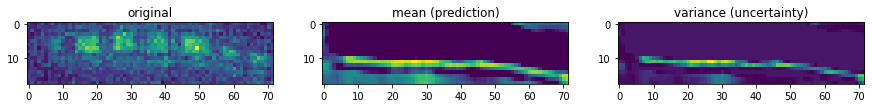

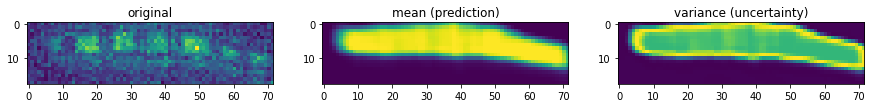

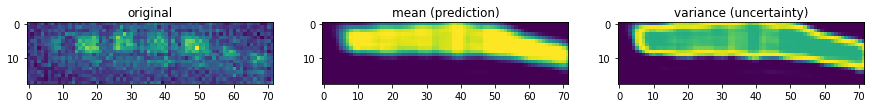

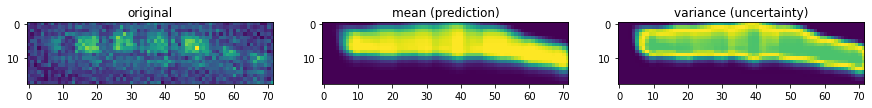

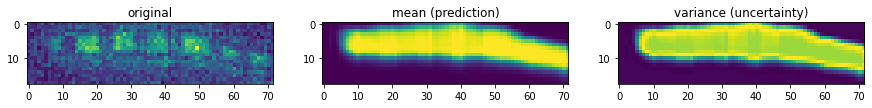

...

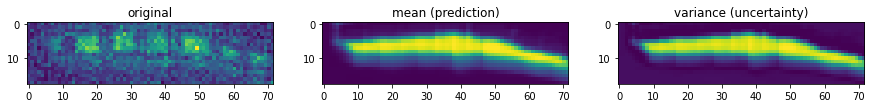

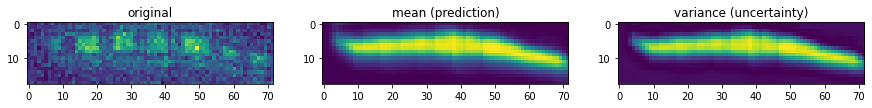

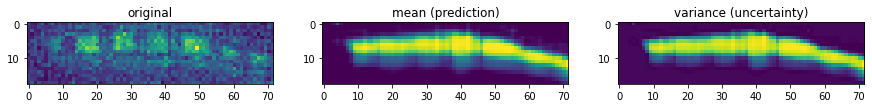

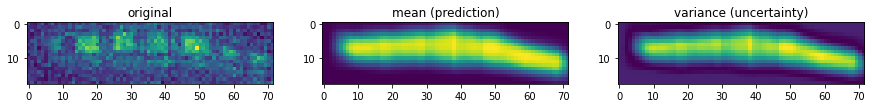

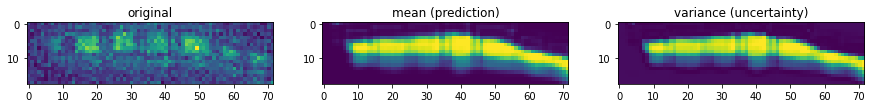

In [ ]:
y_targ = peaks_all_scalar3    #training output;
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_counter2 = "/counter_band3/"

# run DKL counterfactual with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_counterfactual(y, save_counter2, num_cycles)

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_counterfactual(y, save_counter2, num_cycles)

## Step 3 (random)

Step 3-1: DKL analysis based on random location with target property of hysteresis loop width. Here the train data points are from random location.

1/20
Epoch 1/200 ... Training loss: 0.9671
Epoch 10/200 ... Training loss: 0.9342
Epoch 20/200 ... Training loss: 0.8636
Epoch 30/200 ... Training loss: 0.8037
Epoch 40/200 ... Training loss: 0.7471
Epoch 50/200 ... Training loss: 0.693
Epoch 60/200 ... Training loss: 0.6416
Epoch 70/200 ... Training loss: 0.5931
Epoch 80/200 ... Training loss: 0.5413
Epoch 90/200 ... Training loss: 0.4913
Epoch 100/200 ... Training loss: 0.4402
Epoch 110/200 ... Training loss: 0.3887
Epoch 120/200 ... Training loss: 0.3377
Epoch 130/200 ... Training loss: 0.2867
Epoch 140/200 ... Training loss: 0.2358
Epoch 150/200 ... Training loss: 0.1851
Epoch 160/200 ... Training loss: 0.1345
Epoch 170/200 ... Training loss: 0.0845
Epoch 180/200 ... Training loss: 0.0349
Epoch 190/200 ... Training loss: -0.0138
Epoch 200/200 ... Training loss: -0.0611
2/20
Epoch 1/200 ... Training loss: 0.9452
Epoch 10/200 ... Training loss: 0.911
Epoch 20/200 ... Training loss: 0.8463
Epoch 30/200 ... Training loss: 0.7882
Epoch 

<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.911
Epoch 20/200 ... Training loss: 0.8463
Epoch 30/200 ... Training loss: 0.7882
Epoch 40/200 ... Training loss: 0.7336
Epoch 50/200 ... Training loss: 0.6805
Epoch 60/200 ... Training loss: 0.6306
Epoch 70/200 ... Training loss: 0.5829
Epoch 80/200 ... Training loss: 0.5333
Epoch 90/200 ... Training loss: 0.483
Epoch 100/200 ... Training loss: 0.4325
Epoch 110/200 ... Training loss: 0.3816
Epoch 120/200 ... Training loss: 0.3319
Epoch 130/200 ... Training loss: 0.2802
Epoch 140/200 ... Training loss: 0.2294
Epoch 150/200 ... Training loss: 0.1786
Epoch 160/200 ... Training loss: 0.128
Epoch 170/200 ... Training loss: 0.0787
Epoch 180/200 ... Training loss: 0.0298
Epoch 190/200 ... Training loss: -0.0186
Epoch 200/200 ... Training loss: -0.0665


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


3/20
Epoch 1/200 ... Training loss: 0.9345
Epoch 10/200 ... Training loss: 0.8985
Epoch 20/200 ... Training loss: 0.8413
Epoch 30/200 ... Training loss: 0.7827
Epoch 40/200 ... Training loss: 0.7262
Epoch 50/200 ... Training loss: 0.6739
Epoch 60/200 ... Training loss: 0.6237
Epoch 70/200 ... Training loss: 0.5742
Epoch 80/200 ... Training loss: 0.5246
Epoch 90/200 ... Training loss: 0.4739
Epoch 100/200 ... Training loss: 0.4224
Epoch 110/200 ... Training loss: 0.378
Epoch 120/200 ... Training loss: 0.3281
Epoch 130/200 ... Training loss: 0.2778
Epoch 140/200 ... Training loss: 0.2265
Epoch 150/200 ... Training loss: 0.176
Epoch 160/200 ... Training loss: 0.1264
Epoch 170/200 ... Training loss: 0.0775
Epoch 180/200 ... Training loss: 0.0289
Epoch 190/200 ... Training loss: -0.0192
Epoch 200/200 ... Training loss: -0.0668


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


4/20
Epoch 1/200 ... Training loss: 0.9272
Epoch 10/200 ... Training loss: 0.8982
Epoch 20/200 ... Training loss: 0.8349
Epoch 30/200 ... Training loss: 0.7771
Epoch 40/200 ... Training loss: 0.7199
Epoch 50/200 ... Training loss: 0.6644
Epoch 60/200 ... Training loss: 0.6126
Epoch 70/200 ... Training loss: 0.5726
Epoch 80/200 ... Training loss: 0.5214
Epoch 90/200 ... Training loss: 0.4684
Epoch 100/200 ... Training loss: 0.4184
Epoch 110/200 ... Training loss: 0.3689
Epoch 120/200 ... Training loss: 0.3195
Epoch 130/200 ... Training loss: 0.27
Epoch 140/200 ... Training loss: 0.2204
Epoch 150/200 ... Training loss: 0.1707
Epoch 160/200 ... Training loss: 0.1215
Epoch 170/200 ... Training loss: 0.0724
Epoch 180/200 ... Training loss: 0.0234
Epoch 190/200 ... Training loss: -0.0251
Epoch 200/200 ... Training loss: -0.0732
5/20
Epoch 1/200 ... Training loss: 0.9289


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8573
Epoch 20/200 ... Training loss: 0.808
Epoch 30/200 ... Training loss: 0.7601
Epoch 40/200 ... Training loss: 0.7131
Epoch 50/200 ... Training loss: 0.6667
Epoch 60/200 ... Training loss: 0.6208
Epoch 70/200 ... Training loss: 0.5748
Epoch 80/200 ... Training loss: 0.5284
Epoch 90/200 ... Training loss: 0.4816
Epoch 100/200 ... Training loss: 0.4346
Epoch 110/200 ... Training loss: 0.3873
Epoch 120/200 ... Training loss: 0.3399
Epoch 130/200 ... Training loss: 0.2925
Epoch 140/200 ... Training loss: 0.2453
Epoch 150/200 ... Training loss: 0.1982
Epoch 160/200 ... Training loss: 0.1515
Epoch 170/200 ... Training loss: 0.1054
Epoch 180/200 ... Training loss: 0.0598
Epoch 190/200 ... Training loss: 0.015
Epoch 200/200 ... Training loss: -0.0289
6/20
Epoch 1/200 ... Training loss: 0.9235


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8703
Epoch 20/200 ... Training loss: 0.8119
Epoch 30/200 ... Training loss: 0.7615
Epoch 40/200 ... Training loss: 0.7324
Epoch 50/200 ... Training loss: 0.6702
Epoch 60/200 ... Training loss: 0.6261
Epoch 70/200 ... Training loss: 0.5818
Epoch 80/200 ... Training loss: 0.5372
Epoch 90/200 ... Training loss: 0.4921
Epoch 100/200 ... Training loss: 0.4467
Epoch 110/200 ... Training loss: 0.4012
Epoch 120/200 ... Training loss: 0.3555
Epoch 130/200 ... Training loss: 0.3097
Epoch 140/200 ... Training loss: 0.2636
Epoch 150/200 ... Training loss: 0.2169
Epoch 160/200 ... Training loss: 0.1696
Epoch 170/200 ... Training loss: 0.1228
Epoch 180/200 ... Training loss: 0.078
Epoch 190/200 ... Training loss: 0.0304
Epoch 200/200 ... Training loss: -0.0177


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


7/20
Epoch 1/200 ... Training loss: 0.9205
Epoch 10/200 ... Training loss: 0.8673
Epoch 20/200 ... Training loss: 0.8122
Epoch 30/200 ... Training loss: 0.7647
Epoch 40/200 ... Training loss: 0.719
Epoch 50/200 ... Training loss: 0.6752
Epoch 60/200 ... Training loss: 0.6316
Epoch 70/200 ... Training loss: 0.5881
Epoch 80/200 ... Training loss: 0.5435
Epoch 90/200 ... Training loss: 0.4985
Epoch 100/200 ... Training loss: 0.4537
Epoch 110/200 ... Training loss: 0.4086
Epoch 120/200 ... Training loss: 0.3635
Epoch 130/200 ... Training loss: 0.3179
Epoch 140/200 ... Training loss: 0.2713
Epoch 150/200 ... Training loss: 0.2231
Epoch 160/200 ... Training loss: 0.1742
Epoch 170/200 ... Training loss: 0.1247
Epoch 180/200 ... Training loss: 0.0785
Epoch 190/200 ... Training loss: 0.0331
Epoch 200/200 ... Training loss: -0.011
8/20
Epoch 1/200 ... Training loss: 0.9156


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8566
Epoch 20/200 ... Training loss: 0.8105
Epoch 30/200 ... Training loss: 0.7628
Epoch 40/200 ... Training loss: 0.7186
Epoch 50/200 ... Training loss: 0.6757
Epoch 60/200 ... Training loss: 0.632
Epoch 70/200 ... Training loss: 0.5886
Epoch 80/200 ... Training loss: 0.5447
Epoch 90/200 ... Training loss: 0.5004
Epoch 100/200 ... Training loss: 0.4561
Epoch 110/200 ... Training loss: 0.4117
Epoch 120/200 ... Training loss: 0.3669
Epoch 130/200 ... Training loss: 0.3217
Epoch 140/200 ... Training loss: 0.2766
Epoch 150/200 ... Training loss: 0.2316
Epoch 160/200 ... Training loss: 0.1867
Epoch 170/200 ... Training loss: 0.1423
Epoch 180/200 ... Training loss: 0.0995
Epoch 190/200 ... Training loss: 0.0579
Epoch 200/200 ... Training loss: 0.0173
9/20
Epoch 1/200 ... Training loss: 0.9087


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8539
Epoch 20/200 ... Training loss: 0.8047
Epoch 30/200 ... Training loss: 0.7585
Epoch 40/200 ... Training loss: 0.7132
Epoch 50/200 ... Training loss: 0.6695
Epoch 60/200 ... Training loss: 0.626
Epoch 70/200 ... Training loss: 0.5854
Epoch 80/200 ... Training loss: 0.5378
Epoch 90/200 ... Training loss: 0.4937
Epoch 100/200 ... Training loss: 0.4491
Epoch 110/200 ... Training loss: 0.4044
Epoch 120/200 ... Training loss: 0.3597
Epoch 130/200 ... Training loss: 0.3149
Epoch 140/200 ... Training loss: 0.27
Epoch 150/200 ... Training loss: 0.2236
Epoch 160/200 ... Training loss: 0.1776
Epoch 170/200 ... Training loss: 0.1328
Epoch 180/200 ... Training loss: 0.0884
Epoch 190/200 ... Training loss: 0.0424
Epoch 200/200 ... Training loss: -0.0036


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


10/20
Epoch 1/200 ... Training loss: 0.9012
Epoch 10/200 ... Training loss: 0.8535
Epoch 20/200 ... Training loss: 0.803
Epoch 30/200 ... Training loss: 0.756
Epoch 40/200 ... Training loss: 0.7119
Epoch 50/200 ... Training loss: 0.6681
Epoch 60/200 ... Training loss: 0.6241
Epoch 70/200 ... Training loss: 0.5798
Epoch 80/200 ... Training loss: 0.5354
Epoch 90/200 ... Training loss: 0.4907
Epoch 100/200 ... Training loss: 0.4454
Epoch 110/200 ... Training loss: 0.4
Epoch 120/200 ... Training loss: 0.3553
Epoch 130/200 ... Training loss: 0.3101
Epoch 140/200 ... Training loss: 0.264
Epoch 150/200 ... Training loss: 0.2173
Epoch 160/200 ... Training loss: 0.1718
Epoch 170/200 ... Training loss: 0.128
Epoch 180/200 ... Training loss: 0.0826
Epoch 190/200 ... Training loss: 0.0359
Epoch 200/200 ... Training loss: -0.0092
11/20
Epoch 1/200 ... Training loss: 0.9077


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8504
Epoch 20/200 ... Training loss: 0.8001
Epoch 30/200 ... Training loss: 0.7537
Epoch 40/200 ... Training loss: 0.7098
Epoch 50/200 ... Training loss: 0.6664
Epoch 60/200 ... Training loss: 0.6229
Epoch 70/200 ... Training loss: 0.5804
Epoch 80/200 ... Training loss: 0.5348
Epoch 90/200 ... Training loss: 0.49
Epoch 100/200 ... Training loss: 0.4452
Epoch 110/200 ... Training loss: 0.4003
Epoch 120/200 ... Training loss: 0.355
Epoch 130/200 ... Training loss: 0.3089
Epoch 140/200 ... Training loss: 0.2619
Epoch 150/200 ... Training loss: 0.216
Epoch 160/200 ... Training loss: 0.1709
Epoch 170/200 ... Training loss: 0.1248
Epoch 180/200 ... Training loss: 0.0775
Epoch 190/200 ... Training loss: 0.0386
Epoch 200/200 ... Training loss: -0.0091
12/20
Epoch 1/200 ... Training loss: 0.9126


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8485
Epoch 20/200 ... Training loss: 0.8026
Epoch 30/200 ... Training loss: 0.7563
Epoch 40/200 ... Training loss: 0.7126
Epoch 50/200 ... Training loss: 0.6699
Epoch 60/200 ... Training loss: 0.628
Epoch 70/200 ... Training loss: 0.5848
Epoch 80/200 ... Training loss: 0.5413
Epoch 90/200 ... Training loss: 0.4974
Epoch 100/200 ... Training loss: 0.4534
Epoch 110/200 ... Training loss: 0.4098
Epoch 120/200 ... Training loss: 0.3663
Epoch 130/200 ... Training loss: 0.3218
Epoch 140/200 ... Training loss: 0.2769
Epoch 150/200 ... Training loss: 0.2324
Epoch 160/200 ... Training loss: 0.1875
Epoch 170/200 ... Training loss: 0.1423
Epoch 180/200 ... Training loss: 0.1118
Epoch 190/200 ... Training loss: 0.0602
Epoch 200/200 ... Training loss: 0.0171


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


13/20
Epoch 1/200 ... Training loss: 0.9063
Epoch 10/200 ... Training loss: 0.8416
Epoch 20/200 ... Training loss: 0.795
Epoch 30/200 ... Training loss: 0.7512
Epoch 40/200 ... Training loss: 0.7078
Epoch 50/200 ... Training loss: 0.665
Epoch 60/200 ... Training loss: 0.6221
Epoch 70/200 ... Training loss: 0.5788
Epoch 80/200 ... Training loss: 0.5354
Epoch 90/200 ... Training loss: 0.4911
Epoch 100/200 ... Training loss: 0.4462
Epoch 110/200 ... Training loss: 0.4057
Epoch 120/200 ... Training loss: 0.3617
Epoch 130/200 ... Training loss: 0.3171
Epoch 140/200 ... Training loss: 0.2713
Epoch 150/200 ... Training loss: 0.2267
Epoch 160/200 ... Training loss: 0.1839
Epoch 170/200 ... Training loss: 0.1402
Epoch 180/200 ... Training loss: 0.0961
Epoch 190/200 ... Training loss: 0.0509
Epoch 200/200 ... Training loss: 0.0075
14/20
Epoch 1/200 ... Training loss: 0.9001


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8409
Epoch 20/200 ... Training loss: 0.7933
Epoch 30/200 ... Training loss: 0.7481
Epoch 40/200 ... Training loss: 0.7037
Epoch 50/200 ... Training loss: 0.664
Epoch 60/200 ... Training loss: 0.6217
Epoch 70/200 ... Training loss: 0.5787
Epoch 80/200 ... Training loss: 0.5357
Epoch 90/200 ... Training loss: 0.4925
Epoch 100/200 ... Training loss: 0.4492
Epoch 110/200 ... Training loss: 0.4059
Epoch 120/200 ... Training loss: 0.3624
Epoch 130/200 ... Training loss: 0.3188
Epoch 140/200 ... Training loss: 0.2749
Epoch 150/200 ... Training loss: 0.2301
Epoch 160/200 ... Training loss: 0.1828
Epoch 170/200 ... Training loss: 0.1389
Epoch 180/200 ... Training loss: 0.0953
Epoch 190/200 ... Training loss: 0.0512
Epoch 200/200 ... Training loss: 0.0055


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


15/20
Epoch 1/200 ... Training loss: 0.8986
Epoch 10/200 ... Training loss: 0.8441
Epoch 20/200 ... Training loss: 0.7923
Epoch 30/200 ... Training loss: 0.7477
Epoch 40/200 ... Training loss: 0.7046
Epoch 50/200 ... Training loss: 0.6625
Epoch 60/200 ... Training loss: 0.6201
Epoch 70/200 ... Training loss: 0.5779
Epoch 80/200 ... Training loss: 0.5354
Epoch 90/200 ... Training loss: 0.4994
Epoch 100/200 ... Training loss: 0.4506
Epoch 110/200 ... Training loss: 0.4083
Epoch 120/200 ... Training loss: 0.3661
Epoch 130/200 ... Training loss: 0.324
Epoch 140/200 ... Training loss: 0.282
Epoch 150/200 ... Training loss: 0.2401
Epoch 160/200 ... Training loss: 0.1976
Epoch 170/200 ... Training loss: 0.1535
Epoch 180/200 ... Training loss: 0.106
Epoch 190/200 ... Training loss: 0.0603
Epoch 200/200 ... Training loss: 0.0173
16/20
Epoch 1/200 ... Training loss: 0.8938


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8303
Epoch 20/200 ... Training loss: 0.787
Epoch 30/200 ... Training loss: 0.743
Epoch 40/200 ... Training loss: 0.6998
Epoch 50/200 ... Training loss: 0.6572
Epoch 60/200 ... Training loss: 0.6149
Epoch 70/200 ... Training loss: 0.5709
Epoch 80/200 ... Training loss: 0.5301
Epoch 90/200 ... Training loss: 0.5058
Epoch 100/200 ... Training loss: 0.4472
Epoch 110/200 ... Training loss: 0.4045
Epoch 120/200 ... Training loss: 0.362
Epoch 130/200 ... Training loss: 0.3196
Epoch 140/200 ... Training loss: 0.2767
Epoch 150/200 ... Training loss: 0.2299
Epoch 160/200 ... Training loss: 0.1829
Epoch 170/200 ... Training loss: 0.138
Epoch 180/200 ... Training loss: 0.0936
Epoch 190/200 ... Training loss: 0.0521
Epoch 200/200 ... Training loss: 0.0097


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


17/20
Epoch 1/200 ... Training loss: 0.8884
Epoch 10/200 ... Training loss: 0.8279
Epoch 20/200 ... Training loss: 0.7813
Epoch 30/200 ... Training loss: 0.7374
Epoch 40/200 ... Training loss: 0.6953
Epoch 50/200 ... Training loss: 0.653
Epoch 60/200 ... Training loss: 0.6332
Epoch 70/200 ... Training loss: 0.5704
Epoch 80/200 ... Training loss: 0.5282
Epoch 90/200 ... Training loss: 0.4858
Epoch 100/200 ... Training loss: 0.4433
Epoch 110/200 ... Training loss: 0.4008
Epoch 120/200 ... Training loss: 0.3583
Epoch 130/200 ... Training loss: 0.3159
Epoch 140/200 ... Training loss: 0.2737
Epoch 150/200 ... Training loss: 0.2315
Epoch 160/200 ... Training loss: 0.1895
Epoch 170/200 ... Training loss: 0.1472
Epoch 180/200 ... Training loss: 0.104
Epoch 190/200 ... Training loss: 0.0582
Epoch 200/200 ... Training loss: 0.0138


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


18/20
Epoch 1/200 ... Training loss: 0.8838
Epoch 10/200 ... Training loss: 0.8267
Epoch 20/200 ... Training loss: 0.7808
Epoch 30/200 ... Training loss: 0.737
Epoch 40/200 ... Training loss: 0.6946
Epoch 50/200 ... Training loss: 0.6523
Epoch 60/200 ... Training loss: 0.6106
Epoch 70/200 ... Training loss: 0.5683
Epoch 80/200 ... Training loss: 0.5257
Epoch 90/200 ... Training loss: 0.4828
Epoch 100/200 ... Training loss: 0.4398
Epoch 110/200 ... Training loss: 0.3965
Epoch 120/200 ... Training loss: 0.3528
Epoch 130/200 ... Training loss: 0.3081
Epoch 140/200 ... Training loss: 0.2605
Epoch 150/200 ... Training loss: 0.2151
Epoch 160/200 ... Training loss: 0.1692
Epoch 170/200 ... Training loss: 0.1262
Epoch 180/200 ... Training loss: 0.0816
Epoch 190/200 ... Training loss: 0.0411
Epoch 200/200 ... Training loss: -0.0087


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


19/20
Epoch 1/200 ... Training loss: 0.8856
Epoch 10/200 ... Training loss: 0.825
Epoch 20/200 ... Training loss: 0.7815
Epoch 30/200 ... Training loss: 0.7371
Epoch 40/200 ... Training loss: 0.7081
Epoch 50/200 ... Training loss: 0.6524
Epoch 60/200 ... Training loss: 0.6107
Epoch 70/200 ... Training loss: 0.5688
Epoch 80/200 ... Training loss: 0.5264
Epoch 90/200 ... Training loss: 0.4832
Epoch 100/200 ... Training loss: 0.4387
Epoch 110/200 ... Training loss: 0.3924
Epoch 120/200 ... Training loss: 0.3451
Epoch 130/200 ... Training loss: 0.2985
Epoch 140/200 ... Training loss: 0.2524
Epoch 150/200 ... Training loss: 0.2057
Epoch 160/200 ... Training loss: 0.1618
Epoch 170/200 ... Training loss: 0.116
Epoch 180/200 ... Training loss: 0.0688
Epoch 190/200 ... Training loss: 0.0233
Epoch 200/200 ... Training loss: -0.0178
20/20
Epoch 1/200 ... Training loss: 0.8812


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8237
Epoch 20/200 ... Training loss: 0.7759
Epoch 30/200 ... Training loss: 0.7339
Epoch 40/200 ... Training loss: 0.6922
Epoch 50/200 ... Training loss: 0.6483
Epoch 60/200 ... Training loss: 0.609
Epoch 70/200 ... Training loss: 0.5662
Epoch 80/200 ... Training loss: 0.5252
Epoch 90/200 ... Training loss: 0.4814
Epoch 100/200 ... Training loss: 0.437
Epoch 110/200 ... Training loss: 0.389
Epoch 120/200 ... Training loss: 0.3425
Epoch 130/200 ... Training loss: 0.2958
Epoch 140/200 ... Training loss: 0.2497
Epoch 150/200 ... Training loss: 0.2029
Epoch 160/200 ... Training loss: 0.1596
Epoch 170/200 ... Training loss: 0.111
Epoch 180/200 ... Training loss: 0.0645
Epoch 190/200 ... Training loss: 0.0189
Epoch 200/200 ... Training loss: -0.0264
1/20
Epoch 1/200 ... Training loss: 0.9671


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.9342
Epoch 20/200 ... Training loss: 0.8636
Epoch 30/200 ... Training loss: 0.8037
Epoch 40/200 ... Training loss: 0.7471
Epoch 50/200 ... Training loss: 0.693
Epoch 60/200 ... Training loss: 0.6416
Epoch 70/200 ... Training loss: 0.5931
Epoch 80/200 ... Training loss: 0.5413
Epoch 90/200 ... Training loss: 0.4913
Epoch 100/200 ... Training loss: 0.4402
Epoch 110/200 ... Training loss: 0.3887
Epoch 120/200 ... Training loss: 0.3377
Epoch 130/200 ... Training loss: 0.2867
Epoch 140/200 ... Training loss: 0.2358
Epoch 150/200 ... Training loss: 0.1851
Epoch 160/200 ... Training loss: 0.1345
Epoch 170/200 ... Training loss: 0.0845
Epoch 180/200 ... Training loss: 0.0349
Epoch 190/200 ... Training loss: -0.0138
Epoch 200/200 ... Training loss: -0.0611


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


2/20
Epoch 1/200 ... Training loss: 0.9452
Epoch 10/200 ... Training loss: 0.911
Epoch 20/200 ... Training loss: 0.8463
Epoch 30/200 ... Training loss: 0.7882
Epoch 40/200 ... Training loss: 0.7336
Epoch 50/200 ... Training loss: 0.6805
Epoch 60/200 ... Training loss: 0.6306
Epoch 70/200 ... Training loss: 0.5829
Epoch 80/200 ... Training loss: 0.5333
Epoch 90/200 ... Training loss: 0.483
Epoch 100/200 ... Training loss: 0.4325
Epoch 110/200 ... Training loss: 0.3816
Epoch 120/200 ... Training loss: 0.3319
Epoch 130/200 ... Training loss: 0.2802
Epoch 140/200 ... Training loss: 0.2294
Epoch 150/200 ... Training loss: 0.1786
Epoch 160/200 ... Training loss: 0.128
Epoch 170/200 ... Training loss: 0.0787
Epoch 180/200 ... Training loss: 0.0298
Epoch 190/200 ... Training loss: -0.0186
Epoch 200/200 ... Training loss: -0.0665
3/20
Epoch 1/200 ... Training loss: 0.9345


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8985
Epoch 20/200 ... Training loss: 0.8413
Epoch 30/200 ... Training loss: 0.7827
Epoch 40/200 ... Training loss: 0.7262
Epoch 50/200 ... Training loss: 0.6739
Epoch 60/200 ... Training loss: 0.6237
Epoch 70/200 ... Training loss: 0.5742
Epoch 80/200 ... Training loss: 0.5246
Epoch 90/200 ... Training loss: 0.4739
Epoch 100/200 ... Training loss: 0.4224
Epoch 110/200 ... Training loss: 0.378
Epoch 120/200 ... Training loss: 0.3281
Epoch 130/200 ... Training loss: 0.2778
Epoch 140/200 ... Training loss: 0.2265
Epoch 150/200 ... Training loss: 0.176
Epoch 160/200 ... Training loss: 0.1264
Epoch 170/200 ... Training loss: 0.0775
Epoch 180/200 ... Training loss: 0.0289
Epoch 190/200 ... Training loss: -0.0192
Epoch 200/200 ... Training loss: -0.0668
4/20
Epoch 1/200 ... Training loss: 0.9272


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8982
Epoch 20/200 ... Training loss: 0.8349
Epoch 30/200 ... Training loss: 0.7771
Epoch 40/200 ... Training loss: 0.7199
Epoch 50/200 ... Training loss: 0.6644
Epoch 60/200 ... Training loss: 0.6126
Epoch 70/200 ... Training loss: 0.5726
Epoch 80/200 ... Training loss: 0.5214
Epoch 90/200 ... Training loss: 0.4684
Epoch 100/200 ... Training loss: 0.4184
Epoch 110/200 ... Training loss: 0.3689
Epoch 120/200 ... Training loss: 0.3195
Epoch 130/200 ... Training loss: 0.27
Epoch 140/200 ... Training loss: 0.2204
Epoch 150/200 ... Training loss: 0.1707
Epoch 160/200 ... Training loss: 0.1215
Epoch 170/200 ... Training loss: 0.0724
Epoch 180/200 ... Training loss: 0.0234
Epoch 190/200 ... Training loss: -0.0251
Epoch 200/200 ... Training loss: -0.0732


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


5/20
Epoch 1/200 ... Training loss: 0.9289
Epoch 10/200 ... Training loss: 0.8573
Epoch 20/200 ... Training loss: 0.808
Epoch 30/200 ... Training loss: 0.7601
Epoch 40/200 ... Training loss: 0.7131
Epoch 50/200 ... Training loss: 0.6667
Epoch 60/200 ... Training loss: 0.6208
Epoch 70/200 ... Training loss: 0.5748
Epoch 80/200 ... Training loss: 0.5284
Epoch 90/200 ... Training loss: 0.4816
Epoch 100/200 ... Training loss: 0.4346
Epoch 110/200 ... Training loss: 0.3873
Epoch 120/200 ... Training loss: 0.3399
Epoch 130/200 ... Training loss: 0.2925
Epoch 140/200 ... Training loss: 0.2453
Epoch 150/200 ... Training loss: 0.1982
Epoch 160/200 ... Training loss: 0.1515
Epoch 170/200 ... Training loss: 0.1054
Epoch 180/200 ... Training loss: 0.0598
Epoch 190/200 ... Training loss: 0.015
Epoch 200/200 ... Training loss: -0.0289
6/20
Epoch 1/200 ... Training loss: 0.9235


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8703
Epoch 20/200 ... Training loss: 0.8119
Epoch 30/200 ... Training loss: 0.7615
Epoch 40/200 ... Training loss: 0.7324
Epoch 50/200 ... Training loss: 0.6702
Epoch 60/200 ... Training loss: 0.6261
Epoch 70/200 ... Training loss: 0.5818
Epoch 80/200 ... Training loss: 0.5372
Epoch 90/200 ... Training loss: 0.4921
Epoch 100/200 ... Training loss: 0.4467
Epoch 110/200 ... Training loss: 0.4012
Epoch 120/200 ... Training loss: 0.3555
Epoch 130/200 ... Training loss: 0.3097
Epoch 140/200 ... Training loss: 0.2636
Epoch 150/200 ... Training loss: 0.2169
Epoch 160/200 ... Training loss: 0.1696
Epoch 170/200 ... Training loss: 0.1228
Epoch 180/200 ... Training loss: 0.078
Epoch 190/200 ... Training loss: 0.0305
Epoch 200/200 ... Training loss: -0.0177
7/20
Epoch 1/200 ... Training loss: 0.9205


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8673
Epoch 20/200 ... Training loss: 0.8122
Epoch 30/200 ... Training loss: 0.7647
Epoch 40/200 ... Training loss: 0.719
Epoch 50/200 ... Training loss: 0.6752
Epoch 60/200 ... Training loss: 0.6316
Epoch 70/200 ... Training loss: 0.5881
Epoch 80/200 ... Training loss: 0.5435
Epoch 90/200 ... Training loss: 0.4985
Epoch 100/200 ... Training loss: 0.4537
Epoch 110/200 ... Training loss: 0.4086
Epoch 120/200 ... Training loss: 0.3639
Epoch 130/200 ... Training loss: 0.3193
Epoch 140/200 ... Training loss: 0.2747
Epoch 150/200 ... Training loss: 0.2294
Epoch 160/200 ... Training loss: 0.1828
Epoch 170/200 ... Training loss: 0.1341
Epoch 180/200 ... Training loss: 0.0863
Epoch 190/200 ... Training loss: 0.0402
Epoch 200/200 ... Training loss: -0.005


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


8/20
Epoch 1/200 ... Training loss: 0.9156
Epoch 10/200 ... Training loss: 0.8566
Epoch 20/200 ... Training loss: 0.8105
Epoch 30/200 ... Training loss: 0.7628
Epoch 40/200 ... Training loss: 0.7186
Epoch 50/200 ... Training loss: 0.6757
Epoch 60/200 ... Training loss: 0.6318
Epoch 70/200 ... Training loss: 0.5885
Epoch 80/200 ... Training loss: 0.5444
Epoch 90/200 ... Training loss: 0.5003
Epoch 100/200 ... Training loss: 0.4561
Epoch 110/200 ... Training loss: 0.4119
Epoch 120/200 ... Training loss: 0.3679
Epoch 130/200 ... Training loss: 0.3242
Epoch 140/200 ... Training loss: 0.2809
Epoch 150/200 ... Training loss: 0.2378
Epoch 160/200 ... Training loss: 0.1949
Epoch 170/200 ... Training loss: 0.1502
Epoch 180/200 ... Training loss: 0.1033
Epoch 190/200 ... Training loss: 0.0548
Epoch 200/200 ... Training loss: 0.007
9/20
Epoch 1/200 ... Training loss: 0.9087


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8539
Epoch 20/200 ... Training loss: 0.8047
Epoch 30/200 ... Training loss: 0.7587
Epoch 40/200 ... Training loss: 0.7135
Epoch 50/200 ... Training loss: 0.6698
Epoch 60/200 ... Training loss: 0.6279
Epoch 70/200 ... Training loss: 0.5822
Epoch 80/200 ... Training loss: 0.5381
Epoch 90/200 ... Training loss: 0.4941
Epoch 100/200 ... Training loss: 0.4499
Epoch 110/200 ... Training loss: 0.4057
Epoch 120/200 ... Training loss: 0.3612
Epoch 130/200 ... Training loss: 0.3164
Epoch 140/200 ... Training loss: 0.2709
Epoch 150/200 ... Training loss: 0.225
Epoch 160/200 ... Training loss: 0.1783
Epoch 170/200 ... Training loss: 0.1311
Epoch 180/200 ... Training loss: 0.084
Epoch 190/200 ... Training loss: 0.0387
Epoch 200/200 ... Training loss: -0.0054
10/20
Epoch 1/200 ... Training loss: 0.9012


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8535
Epoch 20/200 ... Training loss: 0.803
Epoch 30/200 ... Training loss: 0.756
Epoch 40/200 ... Training loss: 0.7119
Epoch 50/200 ... Training loss: 0.6681
Epoch 60/200 ... Training loss: 0.6241
Epoch 70/200 ... Training loss: 0.5798
Epoch 80/200 ... Training loss: 0.5354
Epoch 90/200 ... Training loss: 0.4907
Epoch 100/200 ... Training loss: 0.4454
Epoch 110/200 ... Training loss: 0.4
Epoch 120/200 ... Training loss: 0.3553
Epoch 130/200 ... Training loss: 0.3102
Epoch 140/200 ... Training loss: 0.2644
Epoch 150/200 ... Training loss: 0.2179
Epoch 160/200 ... Training loss: 0.1719
Epoch 170/200 ... Training loss: 0.1272
Epoch 180/200 ... Training loss: 0.083
Epoch 190/200 ... Training loss: 0.0375
Epoch 200/200 ... Training loss: -0.0056


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


11/20
Epoch 1/200 ... Training loss: 0.9077
Epoch 10/200 ... Training loss: 0.8504
Epoch 20/200 ... Training loss: 0.8001
Epoch 30/200 ... Training loss: 0.7537
Epoch 40/200 ... Training loss: 0.7098
Epoch 50/200 ... Training loss: 0.6664
Epoch 60/200 ... Training loss: 0.6229
Epoch 70/200 ... Training loss: 0.5803
Epoch 80/200 ... Training loss: 0.5348
Epoch 90/200 ... Training loss: 0.49
Epoch 100/200 ... Training loss: 0.4453
Epoch 110/200 ... Training loss: 0.4004
Epoch 120/200 ... Training loss: 0.3551
Epoch 130/200 ... Training loss: 0.3091
Epoch 140/200 ... Training loss: 0.2621
Epoch 150/200 ... Training loss: 0.2164
Epoch 160/200 ... Training loss: 0.1709
Epoch 170/200 ... Training loss: 0.125
Epoch 180/200 ... Training loss: 0.0782
Epoch 190/200 ... Training loss: 0.0335
Epoch 200/200 ... Training loss: -0.0113
12/20
Epoch 1/200 ... Training loss: 0.9126


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8485
Epoch 20/200 ... Training loss: 0.8026
Epoch 30/200 ... Training loss: 0.7563
Epoch 40/200 ... Training loss: 0.7126
Epoch 50/200 ... Training loss: 0.6699
Epoch 60/200 ... Training loss: 0.628
Epoch 70/200 ... Training loss: 0.5848
Epoch 80/200 ... Training loss: 0.5413
Epoch 90/200 ... Training loss: 0.4974
Epoch 100/200 ... Training loss: 0.4534
Epoch 110/200 ... Training loss: 0.4098
Epoch 120/200 ... Training loss: 0.3663
Epoch 130/200 ... Training loss: 0.3218
Epoch 140/200 ... Training loss: 0.2769
Epoch 150/200 ... Training loss: 0.2324
Epoch 160/200 ... Training loss: 0.1875
Epoch 170/200 ... Training loss: 0.1423
Epoch 180/200 ... Training loss: 0.1118
Epoch 190/200 ... Training loss: 0.0601
Epoch 200/200 ... Training loss: 0.0172


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


13/20
Epoch 1/200 ... Training loss: 0.9063
Epoch 10/200 ... Training loss: 0.8416
Epoch 20/200 ... Training loss: 0.795
Epoch 30/200 ... Training loss: 0.7512
Epoch 40/200 ... Training loss: 0.7078
Epoch 50/200 ... Training loss: 0.665
Epoch 60/200 ... Training loss: 0.6221
Epoch 70/200 ... Training loss: 0.5788
Epoch 80/200 ... Training loss: 0.5354
Epoch 90/200 ... Training loss: 0.4911
Epoch 100/200 ... Training loss: 0.4462
Epoch 110/200 ... Training loss: 0.4057
Epoch 120/200 ... Training loss: 0.3617
Epoch 130/200 ... Training loss: 0.3171
Epoch 140/200 ... Training loss: 0.2713
Epoch 150/200 ... Training loss: 0.2268
Epoch 160/200 ... Training loss: 0.1832
Epoch 170/200 ... Training loss: 0.1402
Epoch 180/200 ... Training loss: 0.0955
Epoch 190/200 ... Training loss: 0.0581
Epoch 200/200 ... Training loss: 0.0101
14/20
Epoch 1/200 ... Training loss: 0.9001


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8409
Epoch 20/200 ... Training loss: 0.7933
Epoch 30/200 ... Training loss: 0.7481
Epoch 40/200 ... Training loss: 0.7037
Epoch 50/200 ... Training loss: 0.6641
Epoch 60/200 ... Training loss: 0.621
Epoch 70/200 ... Training loss: 0.5951
Epoch 80/200 ... Training loss: 0.5356
Epoch 90/200 ... Training loss: 0.4926
Epoch 100/200 ... Training loss: 0.4495
Epoch 110/200 ... Training loss: 0.4062
Epoch 120/200 ... Training loss: 0.3628
Epoch 130/200 ... Training loss: 0.32
Epoch 140/200 ... Training loss: 0.2755
Epoch 150/200 ... Training loss: 0.2284
Epoch 160/200 ... Training loss: 0.1825
Epoch 170/200 ... Training loss: 0.1383
Epoch 180/200 ... Training loss: 0.0937
Epoch 190/200 ... Training loss: 0.0478
Epoch 200/200 ... Training loss: 0.0031


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


15/20
Epoch 1/200 ... Training loss: 0.8986
Epoch 10/200 ... Training loss: 0.8441
Epoch 20/200 ... Training loss: 0.7923
Epoch 30/200 ... Training loss: 0.7477
Epoch 40/200 ... Training loss: 0.7046
Epoch 50/200 ... Training loss: 0.6625
Epoch 60/200 ... Training loss: 0.6201
Epoch 70/200 ... Training loss: 0.5779
Epoch 80/200 ... Training loss: 0.5354
Epoch 90/200 ... Training loss: 0.4994
Epoch 100/200 ... Training loss: 0.4506
Epoch 110/200 ... Training loss: 0.4083
Epoch 120/200 ... Training loss: 0.3661
Epoch 130/200 ... Training loss: 0.324
Epoch 140/200 ... Training loss: 0.282
Epoch 150/200 ... Training loss: 0.2401
Epoch 160/200 ... Training loss: 0.1976
Epoch 170/200 ... Training loss: 0.1535
Epoch 180/200 ... Training loss: 0.106
Epoch 190/200 ... Training loss: 0.0603
Epoch 200/200 ... Training loss: 0.0173
16/20
Epoch 1/200 ... Training loss: 0.8938


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8303
Epoch 20/200 ... Training loss: 0.787
Epoch 30/200 ... Training loss: 0.743
Epoch 40/200 ... Training loss: 0.6998
Epoch 50/200 ... Training loss: 0.6572
Epoch 60/200 ... Training loss: 0.6149
Epoch 70/200 ... Training loss: 0.5709
Epoch 80/200 ... Training loss: 0.5301
Epoch 90/200 ... Training loss: 0.5058
Epoch 100/200 ... Training loss: 0.4472
Epoch 110/200 ... Training loss: 0.4045
Epoch 120/200 ... Training loss: 0.362
Epoch 130/200 ... Training loss: 0.3196
Epoch 140/200 ... Training loss: 0.2767
Epoch 150/200 ... Training loss: 0.2299
Epoch 160/200 ... Training loss: 0.1827
Epoch 170/200 ... Training loss: 0.1382
Epoch 180/200 ... Training loss: 0.094
Epoch 190/200 ... Training loss: 0.0494
Epoch 200/200 ... Training loss: 0.012


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


17/20
Epoch 1/200 ... Training loss: 0.8884
Epoch 10/200 ... Training loss: 0.8279
Epoch 20/200 ... Training loss: 0.7813
Epoch 30/200 ... Training loss: 0.7374
Epoch 40/200 ... Training loss: 0.6953
Epoch 50/200 ... Training loss: 0.653
Epoch 60/200 ... Training loss: 0.6332
Epoch 70/200 ... Training loss: 0.5704
Epoch 80/200 ... Training loss: 0.5282
Epoch 90/200 ... Training loss: 0.4857
Epoch 100/200 ... Training loss: 0.4432
Epoch 110/200 ... Training loss: 0.4007
Epoch 120/200 ... Training loss: 0.3581
Epoch 130/200 ... Training loss: 0.3156
Epoch 140/200 ... Training loss: 0.2731
Epoch 150/200 ... Training loss: 0.2304
Epoch 160/200 ... Training loss: 0.1873
Epoch 170/200 ... Training loss: 0.1427
Epoch 180/200 ... Training loss: 0.0942
Epoch 190/200 ... Training loss: 0.0517
Epoch 200/200 ... Training loss: 0.01


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


18/20
Epoch 1/200 ... Training loss: 0.8838
Epoch 10/200 ... Training loss: 0.8267
Epoch 20/200 ... Training loss: 0.7808
Epoch 30/200 ... Training loss: 0.737
Epoch 40/200 ... Training loss: 0.6946
Epoch 50/200 ... Training loss: 0.6524
Epoch 60/200 ... Training loss: 0.6107
Epoch 70/200 ... Training loss: 0.5692
Epoch 80/200 ... Training loss: 0.5249
Epoch 90/200 ... Training loss: 0.4824
Epoch 100/200 ... Training loss: 0.439
Epoch 110/200 ... Training loss: 0.3953
Epoch 120/200 ... Training loss: 0.3512
Epoch 130/200 ... Training loss: 0.3053
Epoch 140/200 ... Training loss: 0.2585
Epoch 150/200 ... Training loss: 0.2135
Epoch 160/200 ... Training loss: 0.1687
Epoch 170/200 ... Training loss: 0.1233
Epoch 180/200 ... Training loss: 0.0778
Epoch 190/200 ... Training loss: 0.0335
Epoch 200/200 ... Training loss: -0.0089
19/20
Epoch 1/200 ... Training loss: 0.8856


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.825
Epoch 20/200 ... Training loss: 0.7815
Epoch 30/200 ... Training loss: 0.7371
Epoch 40/200 ... Training loss: 0.695
Epoch 50/200 ... Training loss: 0.652
Epoch 60/200 ... Training loss: 0.6092
Epoch 70/200 ... Training loss: 0.5655
Epoch 80/200 ... Training loss: 0.5211
Epoch 90/200 ... Training loss: 0.4746
Epoch 100/200 ... Training loss: 0.4284
Epoch 110/200 ... Training loss: 0.3826
Epoch 120/200 ... Training loss: 0.3366
Epoch 130/200 ... Training loss: 0.2907
Epoch 140/200 ... Training loss: 0.2449
Epoch 150/200 ... Training loss: 0.199
Epoch 160/200 ... Training loss: 0.1541
Epoch 170/200 ... Training loss: 0.1084
Epoch 180/200 ... Training loss: 0.0637
Epoch 190/200 ... Training loss: 0.0214
Epoch 200/200 ... Training loss: -0.023


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


20/20
Epoch 1/200 ... Training loss: 0.8812
Epoch 10/200 ... Training loss: 0.8237
Epoch 20/200 ... Training loss: 0.7759
Epoch 30/200 ... Training loss: 0.7339
Epoch 40/200 ... Training loss: 0.6922
Epoch 50/200 ... Training loss: 0.6483
Epoch 60/200 ... Training loss: 0.609
Epoch 70/200 ... Training loss: 0.5661
Epoch 80/200 ... Training loss: 0.525
Epoch 90/200 ... Training loss: 0.481
Epoch 100/200 ... Training loss: 0.4346
Epoch 110/200 ... Training loss: 0.3878
Epoch 120/200 ... Training loss: 0.3408
Epoch 130/200 ... Training loss: 0.2946
Epoch 140/200 ... Training loss: 0.2554
Epoch 150/200 ... Training loss: 0.218
Epoch 160/200 ... Training loss: 0.1656
Epoch 170/200 ... Training loss: 0.1194
Epoch 180/200 ... Training loss: 0.0733
Epoch 190/200 ... Training loss: 0.0272
Epoch 200/200 ... Training loss: -0.0189


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


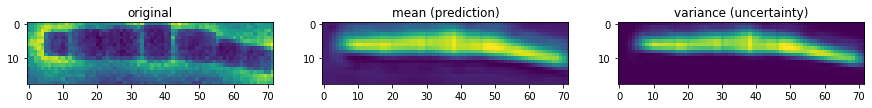

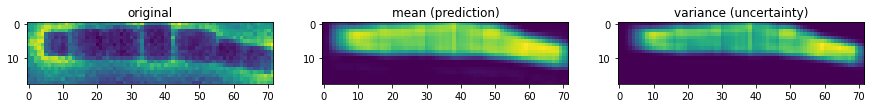

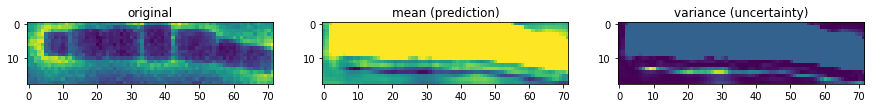

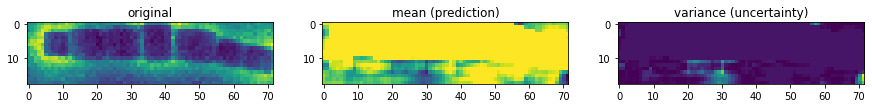

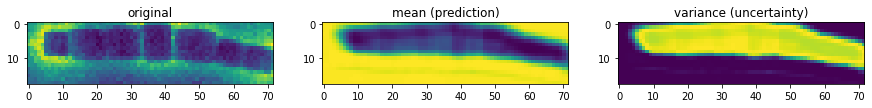

...

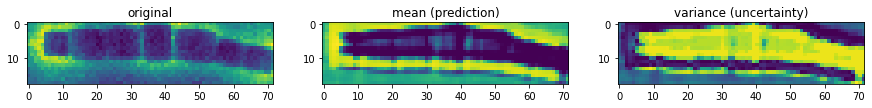

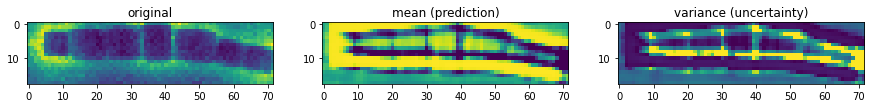

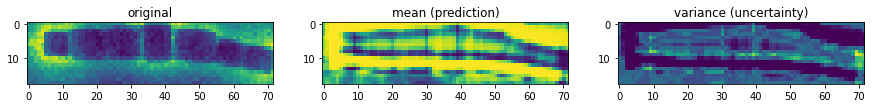

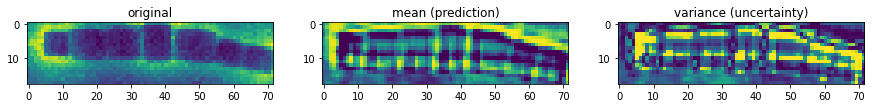

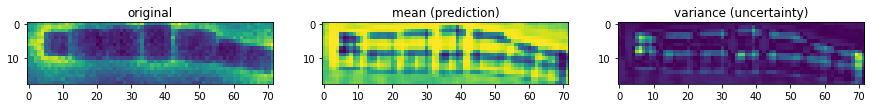

In [ ]:
# Band #1 as target property
y_targ = peaks_all_scalar1    #training output;
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_random1 = "/random_band1/"

# run DKL random with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_random(y, save_random1, num_cycles)

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_random(y, save_random1, num_cycles)

1/20
Epoch 1/200 ... Training loss: 0.945
Epoch 10/200 ... Training loss: 0.9118
Epoch 20/200 ... Training loss: 0.86
Epoch 30/200 ... Training loss: 0.8027
Epoch 40/200 ... Training loss: 0.7549
Epoch 50/200 ... Training loss: 0.7088
Epoch 60/200 ... Training loss: 0.6629
Epoch 70/200 ... Training loss: 0.6208
Epoch 80/200 ... Training loss: 0.5719
Epoch 90/200 ... Training loss: 0.525
Epoch 100/200 ... Training loss: 0.4791
Epoch 110/200 ... Training loss: 0.4329
Epoch 120/200 ... Training loss: 0.3871
Epoch 130/200 ... Training loss: 0.3415
Epoch 140/200 ... Training loss: 0.2967
Epoch 150/200 ... Training loss: 0.2526
Epoch 160/200 ... Training loss: 0.2094
Epoch 170/200 ... Training loss: 0.1673
Epoch 180/200 ... Training loss: 0.127
Epoch 190/200 ... Training loss: 0.0868
Epoch 200/200 ... Training loss: 0.0484
2/20
Epoch 1/200 ... Training loss: 0.927
Epoch 10/200 ... Training loss: 0.8936
Epoch 20/200 ... Training loss: 0.8349
Epoch 30/200 ... Training loss: 0.7865
Epoch 40/200

<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8936
Epoch 20/200 ... Training loss: 0.8349
Epoch 30/200 ... Training loss: 0.7865
Epoch 40/200 ... Training loss: 0.7416
Epoch 50/200 ... Training loss: 0.6996
Epoch 60/200 ... Training loss: 0.6615
Epoch 70/200 ... Training loss: 0.6091
Epoch 80/200 ... Training loss: 0.5621
Epoch 90/200 ... Training loss: 0.5158
Epoch 100/200 ... Training loss: 0.4698
Epoch 110/200 ... Training loss: 0.4235
Epoch 120/200 ... Training loss: 0.3784
Epoch 130/200 ... Training loss: 0.3338
Epoch 140/200 ... Training loss: 0.2894
Epoch 150/200 ... Training loss: 0.245
Epoch 160/200 ... Training loss: 0.2006
Epoch 170/200 ... Training loss: 0.1563
Epoch 180/200 ... Training loss: 0.1118
Epoch 190/200 ... Training loss: 0.0684
Epoch 200/200 ... Training loss: 0.0265


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


3/20
Epoch 1/200 ... Training loss: 0.9158
Epoch 10/200 ... Training loss: 0.8764
Epoch 20/200 ... Training loss: 0.8265
Epoch 30/200 ... Training loss: 0.782
Epoch 40/200 ... Training loss: 0.738
Epoch 50/200 ... Training loss: 0.6936
Epoch 60/200 ... Training loss: 0.6492
Epoch 70/200 ... Training loss: 0.6049
Epoch 80/200 ... Training loss: 0.5604
Epoch 90/200 ... Training loss: 0.5156
Epoch 100/200 ... Training loss: 0.4706
Epoch 110/200 ... Training loss: 0.4255
Epoch 120/200 ... Training loss: 0.3798
Epoch 130/200 ... Training loss: 0.3329
Epoch 140/200 ... Training loss: 0.2872
Epoch 150/200 ... Training loss: 0.2411
Epoch 160/200 ... Training loss: 0.1945
Epoch 170/200 ... Training loss: 0.1472
Epoch 180/200 ... Training loss: 0.1002
Epoch 190/200 ... Training loss: 0.0559
Epoch 200/200 ... Training loss: 0.0138
4/20
Epoch 1/200 ... Training loss: 0.923


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8827
Epoch 20/200 ... Training loss: 0.8335
Epoch 30/200 ... Training loss: 0.7881
Epoch 40/200 ... Training loss: 0.7446
Epoch 50/200 ... Training loss: 0.7011
Epoch 60/200 ... Training loss: 0.6575
Epoch 70/200 ... Training loss: 0.6137
Epoch 80/200 ... Training loss: 0.5713
Epoch 90/200 ... Training loss: 0.529
Epoch 100/200 ... Training loss: 0.4861
Epoch 110/200 ... Training loss: 0.4431
Epoch 120/200 ... Training loss: 0.3999
Epoch 130/200 ... Training loss: 0.3568
Epoch 140/200 ... Training loss: 0.3137
Epoch 150/200 ... Training loss: 0.271
Epoch 160/200 ... Training loss: 0.2285
Epoch 170/200 ... Training loss: 0.1882
Epoch 180/200 ... Training loss: 0.1501
Epoch 190/200 ... Training loss: 0.1139
Epoch 200/200 ... Training loss: 0.0794


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


5/20
Epoch 1/200 ... Training loss: 0.9235
Epoch 10/200 ... Training loss: 0.8768
Epoch 20/200 ... Training loss: 0.8287
Epoch 30/200 ... Training loss: 0.7852
Epoch 40/200 ... Training loss: 0.7442
Epoch 50/200 ... Training loss: 0.7032
Epoch 60/200 ... Training loss: 0.6613
Epoch 70/200 ... Training loss: 0.618
Epoch 80/200 ... Training loss: 0.5711
Epoch 90/200 ... Training loss: 0.5208
Epoch 100/200 ... Training loss: 0.4771
Epoch 110/200 ... Training loss: 0.4343
Epoch 120/200 ... Training loss: 0.3874
Epoch 130/200 ... Training loss: 0.3427
Epoch 140/200 ... Training loss: 0.3012
Epoch 150/200 ... Training loss: 0.26
Epoch 160/200 ... Training loss: 0.2171
Epoch 170/200 ... Training loss: 0.1752
Epoch 180/200 ... Training loss: 0.1349
Epoch 190/200 ... Training loss: 0.096
Epoch 200/200 ... Training loss: 0.0588


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


6/20
Epoch 1/200 ... Training loss: 0.9148
Epoch 10/200 ... Training loss: 0.8688
Epoch 20/200 ... Training loss: 0.8292
Epoch 30/200 ... Training loss: 0.7789
Epoch 40/200 ... Training loss: 0.7354
Epoch 50/200 ... Training loss: 0.6993
Epoch 60/200 ... Training loss: 0.6527
Epoch 70/200 ... Training loss: 0.6107
Epoch 80/200 ... Training loss: 0.5684
Epoch 90/200 ... Training loss: 0.5243
Epoch 100/200 ... Training loss: 0.4757
Epoch 110/200 ... Training loss: 0.4272
Epoch 120/200 ... Training loss: 0.3811
Epoch 130/200 ... Training loss: 0.3375
Epoch 140/200 ... Training loss: 0.295
Epoch 150/200 ... Training loss: 0.2505
Epoch 160/200 ... Training loss: 0.2074
Epoch 170/200 ... Training loss: 0.1648
Epoch 180/200 ... Training loss: 0.1235
Epoch 190/200 ... Training loss: 0.0834
Epoch 200/200 ... Training loss: 0.0448
7/20
Epoch 1/200 ... Training loss: 0.9097


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8709
Epoch 20/200 ... Training loss: 0.8248
Epoch 30/200 ... Training loss: 0.782
Epoch 40/200 ... Training loss: 0.7395
Epoch 50/200 ... Training loss: 0.6969
Epoch 60/200 ... Training loss: 0.6536
Epoch 70/200 ... Training loss: 0.6102
Epoch 80/200 ... Training loss: 0.5664
Epoch 90/200 ... Training loss: 0.523
Epoch 100/200 ... Training loss: 0.4799
Epoch 110/200 ... Training loss: 0.4367
Epoch 120/200 ... Training loss: 0.3933
Epoch 130/200 ... Training loss: 0.3497
Epoch 140/200 ... Training loss: 0.3056
Epoch 150/200 ... Training loss: 0.2622
Epoch 160/200 ... Training loss: 0.22
Epoch 170/200 ... Training loss: 0.1782
Epoch 180/200 ... Training loss: 0.1378
Epoch 190/200 ... Training loss: 0.0987
Epoch 200/200 ... Training loss: 0.0601
8/20
Epoch 1/200 ... Training loss: 0.9029


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8655
Epoch 20/200 ... Training loss: 0.8188
Epoch 30/200 ... Training loss: 0.7756
Epoch 40/200 ... Training loss: 0.7317
Epoch 50/200 ... Training loss: 0.6873
Epoch 60/200 ... Training loss: 0.6425
Epoch 70/200 ... Training loss: 0.5959
Epoch 80/200 ... Training loss: 0.5436
Epoch 90/200 ... Training loss: 0.4984
Epoch 100/200 ... Training loss: 0.453
Epoch 110/200 ... Training loss: 0.4087
Epoch 120/200 ... Training loss: 0.3646
Epoch 130/200 ... Training loss: 0.3205
Epoch 140/200 ... Training loss: 0.2764
Epoch 150/200 ... Training loss: 0.2324
Epoch 160/200 ... Training loss: 0.1887
Epoch 170/200 ... Training loss: 0.1458
Epoch 180/200 ... Training loss: 0.1044
Epoch 190/200 ... Training loss: 0.0625
Epoch 200/200 ... Training loss: 0.0207


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


9/20
Epoch 1/200 ... Training loss: 0.9031
Epoch 10/200 ... Training loss: 0.8553
Epoch 20/200 ... Training loss: 0.8133
Epoch 30/200 ... Training loss: 0.7723
Epoch 40/200 ... Training loss: 0.7318
Epoch 50/200 ... Training loss: 0.6887
Epoch 60/200 ... Training loss: 0.6447
Epoch 70/200 ... Training loss: 0.5995
Epoch 80/200 ... Training loss: 0.563
Epoch 90/200 ... Training loss: 0.5047
Epoch 100/200 ... Training loss: 0.457
Epoch 110/200 ... Training loss: 0.4118
Epoch 120/200 ... Training loss: 0.367
Epoch 130/200 ... Training loss: 0.3226
Epoch 140/200 ... Training loss: 0.2783
Epoch 150/200 ... Training loss: 0.2342
Epoch 160/200 ... Training loss: 0.1901
Epoch 170/200 ... Training loss: 0.1465
Epoch 180/200 ... Training loss: 0.1038
Epoch 190/200 ... Training loss: 0.0621
Epoch 200/200 ... Training loss: 0.021
10/20
Epoch 1/200 ... Training loss: 0.8954


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8541
Epoch 20/200 ... Training loss: 0.8107
Epoch 30/200 ... Training loss: 0.77
Epoch 40/200 ... Training loss: 0.725
Epoch 50/200 ... Training loss: 0.6826
Epoch 60/200 ... Training loss: 0.6401
Epoch 70/200 ... Training loss: 0.5972
Epoch 80/200 ... Training loss: 0.5536
Epoch 90/200 ... Training loss: 0.5089
Epoch 100/200 ... Training loss: 0.4604
Epoch 110/200 ... Training loss: 0.4085
Epoch 120/200 ... Training loss: 0.3627
Epoch 130/200 ... Training loss: 0.3176
Epoch 140/200 ... Training loss: 0.2726
Epoch 150/200 ... Training loss: 0.2279
Epoch 160/200 ... Training loss: 0.1844
Epoch 170/200 ... Training loss: 0.1413
Epoch 180/200 ... Training loss: 0.0983
Epoch 190/200 ... Training loss: 0.0547
Epoch 200/200 ... Training loss: 0.0123


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


11/20
Epoch 1/200 ... Training loss: 0.9072
Epoch 10/200 ... Training loss: 0.8595
Epoch 20/200 ... Training loss: 0.8167
Epoch 30/200 ... Training loss: 0.7751
Epoch 40/200 ... Training loss: 0.7343
Epoch 50/200 ... Training loss: 0.6934
Epoch 60/200 ... Training loss: 0.6518
Epoch 70/200 ... Training loss: 0.6077
Epoch 80/200 ... Training loss: 0.5506
Epoch 90/200 ... Training loss: 0.5028
Epoch 100/200 ... Training loss: 0.4566
Epoch 110/200 ... Training loss: 0.4138
Epoch 120/200 ... Training loss: 0.3705
Epoch 130/200 ... Training loss: 0.3269
Epoch 140/200 ... Training loss: 0.2831
Epoch 150/200 ... Training loss: 0.24
Epoch 160/200 ... Training loss: 0.1977
Epoch 170/200 ... Training loss: 0.156
Epoch 180/200 ... Training loss: 0.1152
Epoch 190/200 ... Training loss: 0.0751
Epoch 200/200 ... Training loss: 0.0357


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


12/20
Epoch 1/200 ... Training loss: 0.9029
Epoch 10/200 ... Training loss: 0.8561
Epoch 20/200 ... Training loss: 0.8126
Epoch 30/200 ... Training loss: 0.7693
Epoch 40/200 ... Training loss: 0.7313
Epoch 50/200 ... Training loss: 0.6876
Epoch 60/200 ... Training loss: 0.6466
Epoch 70/200 ... Training loss: 0.6049
Epoch 80/200 ... Training loss: 0.5624
Epoch 90/200 ... Training loss: 0.513
Epoch 100/200 ... Training loss: 0.4599
Epoch 110/200 ... Training loss: 0.4154
Epoch 120/200 ... Training loss: 0.3702
Epoch 130/200 ... Training loss: 0.3256
Epoch 140/200 ... Training loss: 0.2819
Epoch 150/200 ... Training loss: 0.2389
Epoch 160/200 ... Training loss: 0.196
Epoch 170/200 ... Training loss: 0.1532
Epoch 180/200 ... Training loss: 0.111
Epoch 190/200 ... Training loss: 0.0697
Epoch 200/200 ... Training loss: 0.029
13/20
Epoch 1/200 ... Training loss: 0.8975


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8503
Epoch 20/200 ... Training loss: 0.806
Epoch 30/200 ... Training loss: 0.7643
Epoch 40/200 ... Training loss: 0.7278
Epoch 50/200 ... Training loss: 0.6843
Epoch 60/200 ... Training loss: 0.6437
Epoch 70/200 ... Training loss: 0.6025
Epoch 80/200 ... Training loss: 0.5606
Epoch 90/200 ... Training loss: 0.5175
Epoch 100/200 ... Training loss: 0.4654
Epoch 110/200 ... Training loss: 0.4132
Epoch 120/200 ... Training loss: 0.3668
Epoch 130/200 ... Training loss: 0.3214
Epoch 140/200 ... Training loss: 0.2771
Epoch 150/200 ... Training loss: 0.2332
Epoch 160/200 ... Training loss: 0.1898
Epoch 170/200 ... Training loss: 0.147
Epoch 180/200 ... Training loss: 0.1048
Epoch 190/200 ... Training loss: 0.0632
Epoch 200/200 ... Training loss: 0.0222


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


14/20
Epoch 1/200 ... Training loss: 0.8922
Epoch 10/200 ... Training loss: 0.8421
Epoch 20/200 ... Training loss: 0.7975
Epoch 30/200 ... Training loss: 0.7574
Epoch 40/200 ... Training loss: 0.7177
Epoch 50/200 ... Training loss: 0.6774
Epoch 60/200 ... Training loss: 0.6298
Epoch 70/200 ... Training loss: 0.5829
Epoch 80/200 ... Training loss: 0.5329
Epoch 90/200 ... Training loss: 0.4914
Epoch 100/200 ... Training loss: 0.4454
Epoch 110/200 ... Training loss: 0.4003
Epoch 120/200 ... Training loss: 0.3575
Epoch 130/200 ... Training loss: 0.3148
Epoch 140/200 ... Training loss: 0.2709
Epoch 150/200 ... Training loss: 0.2271
Epoch 160/200 ... Training loss: 0.1844
Epoch 170/200 ... Training loss: 0.1406
Epoch 180/200 ... Training loss: 0.0977
Epoch 190/200 ... Training loss: 0.0555
Epoch 200/200 ... Training loss: 0.0139
15/20
Epoch 1/200 ... Training loss: 0.8875


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8333
Epoch 20/200 ... Training loss: 0.7935
Epoch 30/200 ... Training loss: 0.755
Epoch 40/200 ... Training loss: 0.7147
Epoch 50/200 ... Training loss: 0.6738
Epoch 60/200 ... Training loss: 0.6326
Epoch 70/200 ... Training loss: 0.5907
Epoch 80/200 ... Training loss: 0.5399
Epoch 90/200 ... Training loss: 0.4903
Epoch 100/200 ... Training loss: 0.4428
Epoch 110/200 ... Training loss: 0.3972
Epoch 120/200 ... Training loss: 0.3531
Epoch 130/200 ... Training loss: 0.3103
Epoch 140/200 ... Training loss: 0.266
Epoch 150/200 ... Training loss: 0.2209
Epoch 160/200 ... Training loss: 0.177
Epoch 170/200 ... Training loss: 0.1337
Epoch 180/200 ... Training loss: 0.0909
Epoch 190/200 ... Training loss: 0.0486
Epoch 200/200 ... Training loss: 0.0067
16/20
Epoch 1/200 ... Training loss: 0.8903


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.842
Epoch 20/200 ... Training loss: 0.7966
Epoch 30/200 ... Training loss: 0.7573
Epoch 40/200 ... Training loss: 0.7181
Epoch 50/200 ... Training loss: 0.6778
Epoch 60/200 ... Training loss: 0.6389
Epoch 70/200 ... Training loss: 0.5975
Epoch 80/200 ... Training loss: 0.5549
Epoch 90/200 ... Training loss: 0.5098
Epoch 100/200 ... Training loss: 0.4656
Epoch 110/200 ... Training loss: 0.4211
Epoch 120/200 ... Training loss: 0.3767
Epoch 130/200 ... Training loss: 0.3321
Epoch 140/200 ... Training loss: 0.2889
Epoch 150/200 ... Training loss: 0.2468
Epoch 160/200 ... Training loss: 0.2057
Epoch 170/200 ... Training loss: 0.1656
Epoch 180/200 ... Training loss: 0.1263
Epoch 190/200 ... Training loss: 0.0885
Epoch 200/200 ... Training loss: 0.0501


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


17/20
Epoch 1/200 ... Training loss: 0.8853
Epoch 10/200 ... Training loss: 0.831
Epoch 20/200 ... Training loss: 0.792
Epoch 30/200 ... Training loss: 0.7531
Epoch 40/200 ... Training loss: 0.7137
Epoch 50/200 ... Training loss: 0.6732
Epoch 60/200 ... Training loss: 0.6173
Epoch 70/200 ... Training loss: 0.5971
Epoch 80/200 ... Training loss: 0.5549
Epoch 90/200 ... Training loss: 0.5134
Epoch 100/200 ... Training loss: 0.4705
Epoch 110/200 ... Training loss: 0.426
Epoch 120/200 ... Training loss: 0.381
Epoch 130/200 ... Training loss: 0.3357
Epoch 140/200 ... Training loss: 0.2919
Epoch 150/200 ... Training loss: 0.249
Epoch 160/200 ... Training loss: 0.2063
Epoch 170/200 ... Training loss: 0.164
Epoch 180/200 ... Training loss: 0.1237
Epoch 190/200 ... Training loss: 0.0845
Epoch 200/200 ... Training loss: 0.0461


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


18/20
Epoch 1/200 ... Training loss: 0.8808
Epoch 10/200 ... Training loss: 0.8314
Epoch 20/200 ... Training loss: 0.7908
Epoch 30/200 ... Training loss: 0.7506
Epoch 40/200 ... Training loss: 0.711
Epoch 50/200 ... Training loss: 0.6716
Epoch 60/200 ... Training loss: 0.6316
Epoch 70/200 ... Training loss: 0.591
Epoch 80/200 ... Training loss: 0.5489
Epoch 90/200 ... Training loss: 0.4909
Epoch 100/200 ... Training loss: 0.4439
Epoch 110/200 ... Training loss: 0.3978
Epoch 120/200 ... Training loss: 0.3533
Epoch 130/200 ... Training loss: 0.3091
Epoch 140/200 ... Training loss: 0.2652
Epoch 150/200 ... Training loss: 0.2215
Epoch 160/200 ... Training loss: 0.1778
Epoch 170/200 ... Training loss: 0.134
Epoch 180/200 ... Training loss: 0.09
Epoch 190/200 ... Training loss: 0.0455
Epoch 200/200 ... Training loss: 0.0062


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


19/20
Epoch 1/200 ... Training loss: 0.8814
Epoch 10/200 ... Training loss: 0.8322
Epoch 20/200 ... Training loss: 0.7889
Epoch 30/200 ... Training loss: 0.7484
Epoch 40/200 ... Training loss: 0.7083
Epoch 50/200 ... Training loss: 0.6695
Epoch 60/200 ... Training loss: 0.6296
Epoch 70/200 ... Training loss: 0.5887
Epoch 80/200 ... Training loss: 0.5465
Epoch 90/200 ... Training loss: 0.5022
Epoch 100/200 ... Training loss: 0.4579
Epoch 110/200 ... Training loss: 0.4134
Epoch 120/200 ... Training loss: 0.3692
Epoch 130/200 ... Training loss: 0.3249
Epoch 140/200 ... Training loss: 0.2807
Epoch 150/200 ... Training loss: 0.2377
Epoch 160/200 ... Training loss: 0.1956
Epoch 170/200 ... Training loss: 0.1544
Epoch 180/200 ... Training loss: 0.1136
Epoch 190/200 ... Training loss: 0.0733
Epoch 200/200 ... Training loss: 0.0334


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


20/20
Epoch 1/200 ... Training loss: 0.8772
Epoch 10/200 ... Training loss: 0.8243
Epoch 20/200 ... Training loss: 0.7855
Epoch 30/200 ... Training loss: 0.7455
Epoch 40/200 ... Training loss: 0.706
Epoch 50/200 ... Training loss: 0.6662
Epoch 60/200 ... Training loss: 0.6258
Epoch 70/200 ... Training loss: 0.585
Epoch 80/200 ... Training loss: 0.5433
Epoch 90/200 ... Training loss: 0.4992
Epoch 100/200 ... Training loss: 0.4541
Epoch 110/200 ... Training loss: 0.4094
Epoch 120/200 ... Training loss: 0.3648
Epoch 130/200 ... Training loss: 0.32
Epoch 140/200 ... Training loss: 0.2752
Epoch 150/200 ... Training loss: 0.2319
Epoch 160/200 ... Training loss: 0.1889
Epoch 170/200 ... Training loss: 0.1472
Epoch 180/200 ... Training loss: 0.1058
Epoch 190/200 ... Training loss: 0.0655
Epoch 200/200 ... Training loss: 0.0249


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


1/20
Epoch 1/200 ... Training loss: 0.945
Epoch 10/200 ... Training loss: 0.9118
Epoch 20/200 ... Training loss: 0.86
Epoch 30/200 ... Training loss: 0.8027
Epoch 40/200 ... Training loss: 0.7549
Epoch 50/200 ... Training loss: 0.7088
Epoch 60/200 ... Training loss: 0.6629
Epoch 70/200 ... Training loss: 0.6208
Epoch 80/200 ... Training loss: 0.5719
Epoch 90/200 ... Training loss: 0.525
Epoch 100/200 ... Training loss: 0.4791
Epoch 110/200 ... Training loss: 0.4329
Epoch 120/200 ... Training loss: 0.3871
Epoch 130/200 ... Training loss: 0.3415
Epoch 140/200 ... Training loss: 0.2967
Epoch 150/200 ... Training loss: 0.2526
Epoch 160/200 ... Training loss: 0.2094
Epoch 170/200 ... Training loss: 0.1673
Epoch 180/200 ... Training loss: 0.127
Epoch 190/200 ... Training loss: 0.0868
Epoch 200/200 ... Training loss: 0.0484
2/20
Epoch 1/200 ... Training loss: 0.927


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8936
Epoch 20/200 ... Training loss: 0.8349
Epoch 30/200 ... Training loss: 0.7865
Epoch 40/200 ... Training loss: 0.7416
Epoch 50/200 ... Training loss: 0.6996
Epoch 60/200 ... Training loss: 0.6615
Epoch 70/200 ... Training loss: 0.6091
Epoch 80/200 ... Training loss: 0.5621
Epoch 90/200 ... Training loss: 0.5158
Epoch 100/200 ... Training loss: 0.4698
Epoch 110/200 ... Training loss: 0.4235
Epoch 120/200 ... Training loss: 0.3784
Epoch 130/200 ... Training loss: 0.3338
Epoch 140/200 ... Training loss: 0.2894
Epoch 150/200 ... Training loss: 0.245
Epoch 160/200 ... Training loss: 0.2006
Epoch 170/200 ... Training loss: 0.1563
Epoch 180/200 ... Training loss: 0.1118
Epoch 190/200 ... Training loss: 0.0684
Epoch 200/200 ... Training loss: 0.0265
3/20
Epoch 1/200 ... Training loss: 0.9158


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8764
Epoch 20/200 ... Training loss: 0.8265
Epoch 30/200 ... Training loss: 0.782
Epoch 40/200 ... Training loss: 0.738
Epoch 50/200 ... Training loss: 0.6936
Epoch 60/200 ... Training loss: 0.6492
Epoch 70/200 ... Training loss: 0.6049
Epoch 80/200 ... Training loss: 0.5604
Epoch 90/200 ... Training loss: 0.5156
Epoch 100/200 ... Training loss: 0.4706
Epoch 110/200 ... Training loss: 0.4255
Epoch 120/200 ... Training loss: 0.3798
Epoch 130/200 ... Training loss: 0.3329
Epoch 140/200 ... Training loss: 0.2872
Epoch 150/200 ... Training loss: 0.2411
Epoch 160/200 ... Training loss: 0.1945
Epoch 170/200 ... Training loss: 0.1472
Epoch 180/200 ... Training loss: 0.1002
Epoch 190/200 ... Training loss: 0.0559
Epoch 200/200 ... Training loss: 0.0138


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


4/20
Epoch 1/200 ... Training loss: 0.923
Epoch 10/200 ... Training loss: 0.8827
Epoch 20/200 ... Training loss: 0.8335
Epoch 30/200 ... Training loss: 0.7881
Epoch 40/200 ... Training loss: 0.7446
Epoch 50/200 ... Training loss: 0.7011
Epoch 60/200 ... Training loss: 0.6575
Epoch 70/200 ... Training loss: 0.6137
Epoch 80/200 ... Training loss: 0.5713
Epoch 90/200 ... Training loss: 0.529
Epoch 100/200 ... Training loss: 0.4861
Epoch 110/200 ... Training loss: 0.4431
Epoch 120/200 ... Training loss: 0.3999
Epoch 130/200 ... Training loss: 0.3568
Epoch 140/200 ... Training loss: 0.3137
Epoch 150/200 ... Training loss: 0.271
Epoch 160/200 ... Training loss: 0.2285
Epoch 170/200 ... Training loss: 0.1882
Epoch 180/200 ... Training loss: 0.1501
Epoch 190/200 ... Training loss: 0.1139
Epoch 200/200 ... Training loss: 0.0794
5/20
Epoch 1/200 ... Training loss: 0.9235


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8768
Epoch 20/200 ... Training loss: 0.8287
Epoch 30/200 ... Training loss: 0.7852
Epoch 40/200 ... Training loss: 0.7442
Epoch 50/200 ... Training loss: 0.7032
Epoch 60/200 ... Training loss: 0.6613
Epoch 70/200 ... Training loss: 0.618
Epoch 80/200 ... Training loss: 0.5711
Epoch 90/200 ... Training loss: 0.5208
Epoch 100/200 ... Training loss: 0.4817
Epoch 110/200 ... Training loss: 0.4342
Epoch 120/200 ... Training loss: 0.3893
Epoch 130/200 ... Training loss: 0.3445
Epoch 140/200 ... Training loss: 0.3014
Epoch 150/200 ... Training loss: 0.2595
Epoch 160/200 ... Training loss: 0.2173
Epoch 170/200 ... Training loss: 0.1756
Epoch 180/200 ... Training loss: 0.1351
Epoch 190/200 ... Training loss: 0.0963
Epoch 200/200 ... Training loss: 0.0589


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


6/20
Epoch 1/200 ... Training loss: 0.9148
Epoch 10/200 ... Training loss: 0.8688
Epoch 20/200 ... Training loss: 0.8292
Epoch 30/200 ... Training loss: 0.7789
Epoch 40/200 ... Training loss: 0.7354
Epoch 50/200 ... Training loss: 0.6993
Epoch 60/200 ... Training loss: 0.6527
Epoch 70/200 ... Training loss: 0.6107
Epoch 80/200 ... Training loss: 0.5684
Epoch 90/200 ... Training loss: 0.5243
Epoch 100/200 ... Training loss: 0.4757
Epoch 110/200 ... Training loss: 0.4272
Epoch 120/200 ... Training loss: 0.3811
Epoch 130/200 ... Training loss: 0.3375
Epoch 140/200 ... Training loss: 0.295
Epoch 150/200 ... Training loss: 0.2505
Epoch 160/200 ... Training loss: 0.2074
Epoch 170/200 ... Training loss: 0.1648
Epoch 180/200 ... Training loss: 0.1235
Epoch 190/200 ... Training loss: 0.0834
Epoch 200/200 ... Training loss: 0.0448


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


7/20
Epoch 1/200 ... Training loss: 0.9097
Epoch 10/200 ... Training loss: 0.8709
Epoch 20/200 ... Training loss: 0.8248
Epoch 30/200 ... Training loss: 0.782
Epoch 40/200 ... Training loss: 0.7395
Epoch 50/200 ... Training loss: 0.6969
Epoch 60/200 ... Training loss: 0.6536
Epoch 70/200 ... Training loss: 0.6102
Epoch 80/200 ... Training loss: 0.5664
Epoch 90/200 ... Training loss: 0.523
Epoch 100/200 ... Training loss: 0.4799
Epoch 110/200 ... Training loss: 0.4367
Epoch 120/200 ... Training loss: 0.3933
Epoch 130/200 ... Training loss: 0.3497
Epoch 140/200 ... Training loss: 0.3056
Epoch 150/200 ... Training loss: 0.2622
Epoch 160/200 ... Training loss: 0.22
Epoch 170/200 ... Training loss: 0.1782
Epoch 180/200 ... Training loss: 0.1378
Epoch 190/200 ... Training loss: 0.0987
Epoch 200/200 ... Training loss: 0.0601
8/20
Epoch 1/200 ... Training loss: 0.9029


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8655
Epoch 20/200 ... Training loss: 0.8188
Epoch 30/200 ... Training loss: 0.7756
Epoch 40/200 ... Training loss: 0.7317
Epoch 50/200 ... Training loss: 0.6873
Epoch 60/200 ... Training loss: 0.6425
Epoch 70/200 ... Training loss: 0.5959
Epoch 80/200 ... Training loss: 0.5436
Epoch 90/200 ... Training loss: 0.4984
Epoch 100/200 ... Training loss: 0.453
Epoch 110/200 ... Training loss: 0.4087
Epoch 120/200 ... Training loss: 0.3646
Epoch 130/200 ... Training loss: 0.3205
Epoch 140/200 ... Training loss: 0.2764
Epoch 150/200 ... Training loss: 0.2324
Epoch 160/200 ... Training loss: 0.1887
Epoch 170/200 ... Training loss: 0.1458
Epoch 180/200 ... Training loss: 0.1044
Epoch 190/200 ... Training loss: 0.0625
Epoch 200/200 ... Training loss: 0.0207


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


9/20
Epoch 1/200 ... Training loss: 0.9031
Epoch 10/200 ... Training loss: 0.8553
Epoch 20/200 ... Training loss: 0.8133
Epoch 30/200 ... Training loss: 0.7723
Epoch 40/200 ... Training loss: 0.7318
Epoch 50/200 ... Training loss: 0.6887
Epoch 60/200 ... Training loss: 0.6447
Epoch 70/200 ... Training loss: 0.5995
Epoch 80/200 ... Training loss: 0.563
Epoch 90/200 ... Training loss: 0.5037
Epoch 100/200 ... Training loss: 0.4565
Epoch 110/200 ... Training loss: 0.4111
Epoch 120/200 ... Training loss: 0.366
Epoch 130/200 ... Training loss: 0.3211
Epoch 140/200 ... Training loss: 0.2761
Epoch 150/200 ... Training loss: 0.2317
Epoch 160/200 ... Training loss: 0.1874
Epoch 170/200 ... Training loss: 0.1439
Epoch 180/200 ... Training loss: 0.1013
Epoch 190/200 ... Training loss: 0.0595
Epoch 200/200 ... Training loss: 0.0186


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


10/20
Epoch 1/200 ... Training loss: 0.8954
Epoch 10/200 ... Training loss: 0.8541
Epoch 20/200 ... Training loss: 0.8107
Epoch 30/200 ... Training loss: 0.7697
Epoch 40/200 ... Training loss: 0.7252
Epoch 50/200 ... Training loss: 0.6829
Epoch 60/200 ... Training loss: 0.6404
Epoch 70/200 ... Training loss: 0.5974
Epoch 80/200 ... Training loss: 0.5536
Epoch 90/200 ... Training loss: 0.5094
Epoch 100/200 ... Training loss: 0.4636
Epoch 110/200 ... Training loss: 0.4096
Epoch 120/200 ... Training loss: 0.3637
Epoch 130/200 ... Training loss: 0.3182
Epoch 140/200 ... Training loss: 0.2734
Epoch 150/200 ... Training loss: 0.2289
Epoch 160/200 ... Training loss: 0.1847
Epoch 170/200 ... Training loss: 0.1419
Epoch 180/200 ... Training loss: 0.0995
Epoch 190/200 ... Training loss: 0.0552
Epoch 200/200 ... Training loss: 0.013
11/20
Epoch 1/200 ... Training loss: 0.9072


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8595
Epoch 20/200 ... Training loss: 0.8167
Epoch 30/200 ... Training loss: 0.7751
Epoch 40/200 ... Training loss: 0.7343
Epoch 50/200 ... Training loss: 0.6934
Epoch 60/200 ... Training loss: 0.6518
Epoch 70/200 ... Training loss: 0.6077
Epoch 80/200 ... Training loss: 0.5506
Epoch 90/200 ... Training loss: 0.5028
Epoch 100/200 ... Training loss: 0.4566
Epoch 110/200 ... Training loss: 0.4138
Epoch 120/200 ... Training loss: 0.3705
Epoch 130/200 ... Training loss: 0.3269
Epoch 140/200 ... Training loss: 0.2831
Epoch 150/200 ... Training loss: 0.24
Epoch 160/200 ... Training loss: 0.1977
Epoch 170/200 ... Training loss: 0.156
Epoch 180/200 ... Training loss: 0.1152
Epoch 190/200 ... Training loss: 0.0751
Epoch 200/200 ... Training loss: 0.0357


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


12/20
Epoch 1/200 ... Training loss: 0.9029
Epoch 10/200 ... Training loss: 0.8561
Epoch 20/200 ... Training loss: 0.8126
Epoch 30/200 ... Training loss: 0.7693
Epoch 40/200 ... Training loss: 0.7313
Epoch 50/200 ... Training loss: 0.6876
Epoch 60/200 ... Training loss: 0.6466
Epoch 70/200 ... Training loss: 0.6049
Epoch 80/200 ... Training loss: 0.5624
Epoch 90/200 ... Training loss: 0.513
Epoch 100/200 ... Training loss: 0.4599
Epoch 110/200 ... Training loss: 0.4154
Epoch 120/200 ... Training loss: 0.3702
Epoch 130/200 ... Training loss: 0.3256
Epoch 140/200 ... Training loss: 0.2819
Epoch 150/200 ... Training loss: 0.2389
Epoch 160/200 ... Training loss: 0.196
Epoch 170/200 ... Training loss: 0.1532
Epoch 180/200 ... Training loss: 0.111
Epoch 190/200 ... Training loss: 0.0697
Epoch 200/200 ... Training loss: 0.029
13/20
Epoch 1/200 ... Training loss: 0.8975


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8503
Epoch 20/200 ... Training loss: 0.806
Epoch 30/200 ... Training loss: 0.7643
Epoch 40/200 ... Training loss: 0.7278
Epoch 50/200 ... Training loss: 0.6842
Epoch 60/200 ... Training loss: 0.6437
Epoch 70/200 ... Training loss: 0.6027
Epoch 80/200 ... Training loss: 0.5613
Epoch 90/200 ... Training loss: 0.5194
Epoch 100/200 ... Training loss: 0.4765
Epoch 110/200 ... Training loss: 0.426
Epoch 120/200 ... Training loss: 0.373
Epoch 130/200 ... Training loss: 0.3262
Epoch 140/200 ... Training loss: 0.2805
Epoch 150/200 ... Training loss: 0.2362
Epoch 160/200 ... Training loss: 0.1924
Epoch 170/200 ... Training loss: 0.1492
Epoch 180/200 ... Training loss: 0.1069
Epoch 190/200 ... Training loss: 0.0652
Epoch 200/200 ... Training loss: 0.0241


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


14/20
Epoch 1/200 ... Training loss: 0.8922
Epoch 10/200 ... Training loss: 0.8421
Epoch 20/200 ... Training loss: 0.7975
Epoch 30/200 ... Training loss: 0.7574
Epoch 40/200 ... Training loss: 0.7177
Epoch 50/200 ... Training loss: 0.6774
Epoch 60/200 ... Training loss: 0.6298
Epoch 70/200 ... Training loss: 0.5829
Epoch 80/200 ... Training loss: 0.5329
Epoch 90/200 ... Training loss: 0.4914
Epoch 100/200 ... Training loss: 0.4454
Epoch 110/200 ... Training loss: 0.4003
Epoch 120/200 ... Training loss: 0.3575
Epoch 130/200 ... Training loss: 0.3148
Epoch 140/200 ... Training loss: 0.2709
Epoch 150/200 ... Training loss: 0.2271
Epoch 160/200 ... Training loss: 0.1844
Epoch 170/200 ... Training loss: 0.1406
Epoch 180/200 ... Training loss: 0.0977
Epoch 190/200 ... Training loss: 0.0555
Epoch 200/200 ... Training loss: 0.0139
15/20
Epoch 1/200 ... Training loss: 0.8875


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8333
Epoch 20/200 ... Training loss: 0.7935
Epoch 30/200 ... Training loss: 0.755
Epoch 40/200 ... Training loss: 0.7147
Epoch 50/200 ... Training loss: 0.6738
Epoch 60/200 ... Training loss: 0.6326
Epoch 70/200 ... Training loss: 0.5907
Epoch 80/200 ... Training loss: 0.5399
Epoch 90/200 ... Training loss: 0.4903
Epoch 100/200 ... Training loss: 0.4428
Epoch 110/200 ... Training loss: 0.3972
Epoch 120/200 ... Training loss: 0.3531
Epoch 130/200 ... Training loss: 0.3103
Epoch 140/200 ... Training loss: 0.266
Epoch 150/200 ... Training loss: 0.2209
Epoch 160/200 ... Training loss: 0.177
Epoch 170/200 ... Training loss: 0.1337
Epoch 180/200 ... Training loss: 0.0909
Epoch 190/200 ... Training loss: 0.0486
Epoch 200/200 ... Training loss: 0.0067
16/20
Epoch 1/200 ... Training loss: 0.8903


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.842
Epoch 20/200 ... Training loss: 0.7966
Epoch 30/200 ... Training loss: 0.7573
Epoch 40/200 ... Training loss: 0.7181
Epoch 50/200 ... Training loss: 0.6778
Epoch 60/200 ... Training loss: 0.6389
Epoch 70/200 ... Training loss: 0.5975
Epoch 80/200 ... Training loss: 0.5549
Epoch 90/200 ... Training loss: 0.5098
Epoch 100/200 ... Training loss: 0.4656
Epoch 110/200 ... Training loss: 0.4211
Epoch 120/200 ... Training loss: 0.3767
Epoch 130/200 ... Training loss: 0.3321
Epoch 140/200 ... Training loss: 0.2889
Epoch 150/200 ... Training loss: 0.2468
Epoch 160/200 ... Training loss: 0.2057
Epoch 170/200 ... Training loss: 0.1656
Epoch 180/200 ... Training loss: 0.1263
Epoch 190/200 ... Training loss: 0.0886
Epoch 200/200 ... Training loss: 0.0502


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


17/20
Epoch 1/200 ... Training loss: 0.8853
Epoch 10/200 ... Training loss: 0.831
Epoch 20/200 ... Training loss: 0.792
Epoch 30/200 ... Training loss: 0.7531
Epoch 40/200 ... Training loss: 0.7137
Epoch 50/200 ... Training loss: 0.6732
Epoch 60/200 ... Training loss: 0.6173
Epoch 70/200 ... Training loss: 0.5971
Epoch 80/200 ... Training loss: 0.5549
Epoch 90/200 ... Training loss: 0.5134
Epoch 100/200 ... Training loss: 0.4705
Epoch 110/200 ... Training loss: 0.426
Epoch 120/200 ... Training loss: 0.381
Epoch 130/200 ... Training loss: 0.3357
Epoch 140/200 ... Training loss: 0.2919
Epoch 150/200 ... Training loss: 0.249
Epoch 160/200 ... Training loss: 0.2063
Epoch 170/200 ... Training loss: 0.164
Epoch 180/200 ... Training loss: 0.1237
Epoch 190/200 ... Training loss: 0.0845
Epoch 200/200 ... Training loss: 0.0461
18/20
Epoch 1/200 ... Training loss: 0.8808


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8314
Epoch 20/200 ... Training loss: 0.7908
Epoch 30/200 ... Training loss: 0.7506
Epoch 40/200 ... Training loss: 0.711
Epoch 50/200 ... Training loss: 0.6701
Epoch 60/200 ... Training loss: 0.6315
Epoch 70/200 ... Training loss: 0.5908
Epoch 80/200 ... Training loss: 0.5485
Epoch 90/200 ... Training loss: 0.4911
Epoch 100/200 ... Training loss: 0.4421
Epoch 110/200 ... Training loss: 0.3973
Epoch 120/200 ... Training loss: 0.3529
Epoch 130/200 ... Training loss: 0.3088
Epoch 140/200 ... Training loss: 0.2652
Epoch 150/200 ... Training loss: 0.2215
Epoch 160/200 ... Training loss: 0.1782
Epoch 170/200 ... Training loss: 0.1339
Epoch 180/200 ... Training loss: 0.0902
Epoch 190/200 ... Training loss: 0.0461
Epoch 200/200 ... Training loss: 0.0046


/usr/local/lib/python3.8/dist-packages/gpytorch/distributions/multivariate_normal.py:259: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(
<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


19/20
Epoch 1/200 ... Training loss: 0.8814
Epoch 10/200 ... Training loss: 0.8322
Epoch 20/200 ... Training loss: 0.7889
Epoch 30/200 ... Training loss: 0.7484
Epoch 40/200 ... Training loss: 0.7083
Epoch 50/200 ... Training loss: 0.6695
Epoch 60/200 ... Training loss: 0.6296
Epoch 70/200 ... Training loss: 0.5887
Epoch 80/200 ... Training loss: 0.5466
Epoch 90/200 ... Training loss: 0.5022
Epoch 100/200 ... Training loss: 0.458
Epoch 110/200 ... Training loss: 0.4135
Epoch 120/200 ... Training loss: 0.3693
Epoch 130/200 ... Training loss: 0.3251
Epoch 140/200 ... Training loss: 0.2812
Epoch 150/200 ... Training loss: 0.2378
Epoch 160/200 ... Training loss: 0.1957
Epoch 170/200 ... Training loss: 0.1547
Epoch 180/200 ... Training loss: 0.1141
Epoch 190/200 ... Training loss: 0.0742
Epoch 200/200 ... Training loss: 0.0342
20/20
Epoch 1/200 ... Training loss: 0.8772


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8243
Epoch 20/200 ... Training loss: 0.7855
Epoch 30/200 ... Training loss: 0.7457
Epoch 40/200 ... Training loss: 0.7059
Epoch 50/200 ... Training loss: 0.6668
Epoch 60/200 ... Training loss: 0.6272
Epoch 70/200 ... Training loss: 0.5869
Epoch 80/200 ... Training loss: 0.5458
Epoch 90/200 ... Training loss: 0.4981
Epoch 100/200 ... Training loss: 0.4406
Epoch 110/200 ... Training loss: 0.3935
Epoch 120/200 ... Training loss: 0.3484
Epoch 130/200 ... Training loss: 0.3037
Epoch 140/200 ... Training loss: 0.2593
Epoch 150/200 ... Training loss: 0.2154
Epoch 160/200 ... Training loss: 0.171
Epoch 170/200 ... Training loss: 0.1265
Epoch 180/200 ... Training loss: 0.0823
Epoch 190/200 ... Training loss: 0.0381
Epoch 200/200 ... Training loss: -0.0064


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


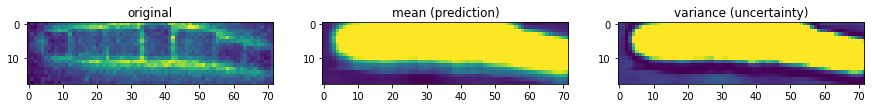

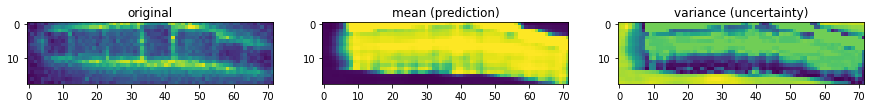

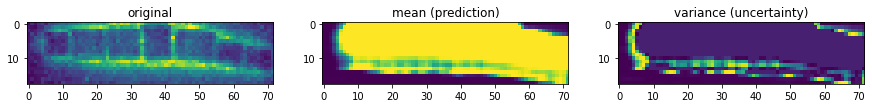

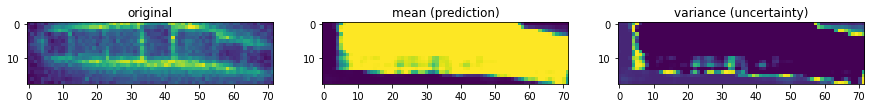

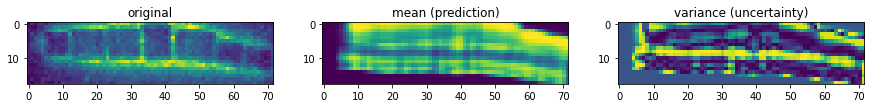

...

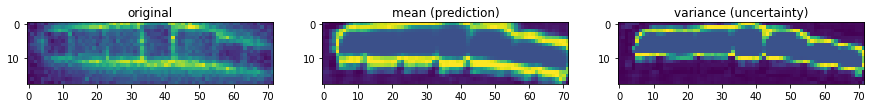

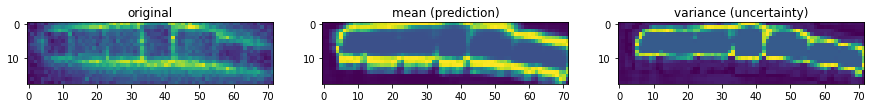

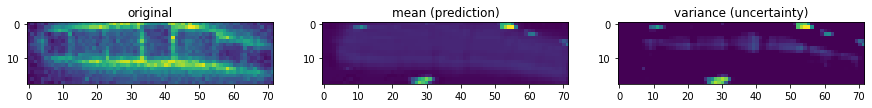

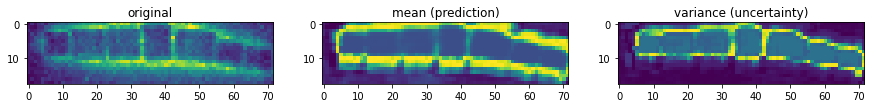

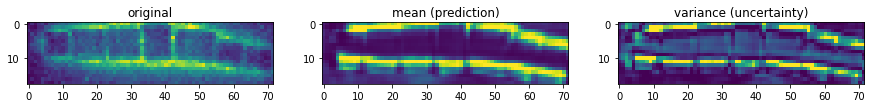

In [ ]:
# Band #2 as target property
y_targ = peaks_all_scalar2    #training output;
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_random2 = "/random_band2/"

# run DKL random with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_random(y, save_random2, num_cycles)

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_random(y, save_random2, num_cycles)

1/20
Epoch 1/200 ... Training loss: 0.9206
Epoch 10/200 ... Training loss: 0.8889
Epoch 20/200 ... Training loss: 0.8309
Epoch 30/200 ... Training loss: 0.7823
Epoch 40/200 ... Training loss: 0.7349
Epoch 50/200 ... Training loss: 0.6873
Epoch 60/200 ... Training loss: 0.6382
Epoch 70/200 ... Training loss: 0.5826
Epoch 80/200 ... Training loss: 0.5358
Epoch 90/200 ... Training loss: 0.4883
Epoch 100/200 ... Training loss: 0.4403
Epoch 110/200 ... Training loss: 0.3919
Epoch 120/200 ... Training loss: 0.3429
Epoch 130/200 ... Training loss: 0.2941
Epoch 140/200 ... Training loss: 0.2446
Epoch 150/200 ... Training loss: 0.1954
Epoch 160/200 ... Training loss: 0.1463
Epoch 170/200 ... Training loss: 0.0971
Epoch 180/200 ... Training loss: 0.048
Epoch 190/200 ... Training loss: -0.0012
Epoch 200/200 ... Training loss: -0.0494
2/20
Epoch 1/200 ... Training loss: 0.9055
Epoch 10/200 ... Training loss: 0.8737
Epoch 20/200 ... Training loss: 0.8228
Epoch 30/200 ... Training loss: 0.7739
Epoch

<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8737
Epoch 20/200 ... Training loss: 0.8228
Epoch 30/200 ... Training loss: 0.7739
Epoch 40/200 ... Training loss: 0.7271
Epoch 50/200 ... Training loss: 0.6804
Epoch 60/200 ... Training loss: 0.634
Epoch 70/200 ... Training loss: 0.587
Epoch 80/200 ... Training loss: 0.5442
Epoch 90/200 ... Training loss: 0.4907
Epoch 100/200 ... Training loss: 0.4415
Epoch 110/200 ... Training loss: 0.3918
Epoch 120/200 ... Training loss: 0.3418
Epoch 130/200 ... Training loss: 0.2917
Epoch 140/200 ... Training loss: 0.2414
Epoch 150/200 ... Training loss: 0.1911
Epoch 160/200 ... Training loss: 0.1409
Epoch 170/200 ... Training loss: 0.0909
Epoch 180/200 ... Training loss: 0.0412
Epoch 190/200 ... Training loss: -0.0082
Epoch 200/200 ... Training loss: -0.0571


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


3/20
Epoch 1/200 ... Training loss: 0.8952
Epoch 10/200 ... Training loss: 0.8562
Epoch 20/200 ... Training loss: 0.8086
Epoch 30/200 ... Training loss: 0.763
Epoch 40/200 ... Training loss: 0.7182
Epoch 50/200 ... Training loss: 0.673
Epoch 60/200 ... Training loss: 0.6268
Epoch 70/200 ... Training loss: 0.5792
Epoch 80/200 ... Training loss: 0.5317
Epoch 90/200 ... Training loss: 0.4837
Epoch 100/200 ... Training loss: 0.435
Epoch 110/200 ... Training loss: 0.3858
Epoch 120/200 ... Training loss: 0.3363
Epoch 130/200 ... Training loss: 0.2866
Epoch 140/200 ... Training loss: 0.2368
Epoch 150/200 ... Training loss: 0.1867
Epoch 160/200 ... Training loss: 0.1374
Epoch 170/200 ... Training loss: 0.0868
Epoch 180/200 ... Training loss: 0.0372
Epoch 190/200 ... Training loss: -0.0121
Epoch 200/200 ... Training loss: -0.0609
4/20
Epoch 1/200 ... Training loss: 0.8905


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8614
Epoch 20/200 ... Training loss: 0.8117
Epoch 30/200 ... Training loss: 0.7662
Epoch 40/200 ... Training loss: 0.7184
Epoch 50/200 ... Training loss: 0.6692
Epoch 60/200 ... Training loss: 0.6213
Epoch 70/200 ... Training loss: 0.5767
Epoch 80/200 ... Training loss: 0.5294
Epoch 90/200 ... Training loss: 0.4806
Epoch 100/200 ... Training loss: 0.4312
Epoch 110/200 ... Training loss: 0.3814
Epoch 120/200 ... Training loss: 0.3313
Epoch 130/200 ... Training loss: 0.2813
Epoch 140/200 ... Training loss: 0.2341
Epoch 150/200 ... Training loss: 0.1823
Epoch 160/200 ... Training loss: 0.1322
Epoch 170/200 ... Training loss: 0.0821
Epoch 180/200 ... Training loss: 0.032
Epoch 190/200 ... Training loss: -0.0177
Epoch 200/200 ... Training loss: -0.0669


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


5/20
Epoch 1/200 ... Training loss: 0.8941
Epoch 10/200 ... Training loss: 0.8368
Epoch 20/200 ... Training loss: 0.7908
Epoch 30/200 ... Training loss: 0.7481
Epoch 40/200 ... Training loss: 0.7048
Epoch 50/200 ... Training loss: 0.6669
Epoch 60/200 ... Training loss: 0.6157
Epoch 70/200 ... Training loss: 0.5696
Epoch 80/200 ... Training loss: 0.5228
Epoch 90/200 ... Training loss: 0.4752
Epoch 100/200 ... Training loss: 0.4274
Epoch 110/200 ... Training loss: 0.3783
Epoch 120/200 ... Training loss: 0.3291
Epoch 130/200 ... Training loss: 0.2796
Epoch 140/200 ... Training loss: 0.2298
Epoch 150/200 ... Training loss: 0.1799
Epoch 160/200 ... Training loss: 0.1299
Epoch 170/200 ... Training loss: 0.0799
Epoch 180/200 ... Training loss: 0.0301
Epoch 190/200 ... Training loss: -0.0195
Epoch 200/200 ... Training loss: -0.0688
6/20
Epoch 1/200 ... Training loss: 0.8897


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8435
Epoch 20/200 ... Training loss: 0.7938
Epoch 30/200 ... Training loss: 0.7467
Epoch 40/200 ... Training loss: 0.7034
Epoch 50/200 ... Training loss: 0.6593
Epoch 60/200 ... Training loss: 0.6155
Epoch 70/200 ... Training loss: 0.5702
Epoch 80/200 ... Training loss: 0.5241
Epoch 90/200 ... Training loss: 0.4775
Epoch 100/200 ... Training loss: 0.4302
Epoch 110/200 ... Training loss: 0.3832
Epoch 120/200 ... Training loss: 0.3346
Epoch 130/200 ... Training loss: 0.2862
Epoch 140/200 ... Training loss: 0.2376
Epoch 150/200 ... Training loss: 0.1891
Epoch 160/200 ... Training loss: 0.1403
Epoch 170/200 ... Training loss: 0.0915
Epoch 180/200 ... Training loss: 0.0412
Epoch 190/200 ... Training loss: -0.0116
Epoch 200/200 ... Training loss: -0.0609


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


7/20
Epoch 1/200 ... Training loss: 0.8872
Epoch 10/200 ... Training loss: 0.8437
Epoch 20/200 ... Training loss: 0.795
Epoch 30/200 ... Training loss: 0.7535
Epoch 40/200 ... Training loss: 0.7072
Epoch 50/200 ... Training loss: 0.6615
Epoch 60/200 ... Training loss: 0.6155
Epoch 70/200 ... Training loss: 0.5693
Epoch 80/200 ... Training loss: 0.5227
Epoch 90/200 ... Training loss: 0.4753
Epoch 100/200 ... Training loss: 0.4268
Epoch 110/200 ... Training loss: 0.3771
Epoch 120/200 ... Training loss: 0.327
Epoch 130/200 ... Training loss: 0.2795
Epoch 140/200 ... Training loss: 0.2317
Epoch 150/200 ... Training loss: 0.1811
Epoch 160/200 ... Training loss: 0.1308
Epoch 170/200 ... Training loss: 0.0814
Epoch 180/200 ... Training loss: 0.0322
Epoch 190/200 ... Training loss: -0.0166
Epoch 200/200 ... Training loss: -0.0649
8/20
Epoch 1/200 ... Training loss: 0.8834


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8458
Epoch 20/200 ... Training loss: 0.7979
Epoch 30/200 ... Training loss: 0.7534
Epoch 40/200 ... Training loss: 0.7075
Epoch 50/200 ... Training loss: 0.6617
Epoch 60/200 ... Training loss: 0.6143
Epoch 70/200 ... Training loss: 0.5673
Epoch 80/200 ... Training loss: 0.5217
Epoch 90/200 ... Training loss: 0.4728
Epoch 100/200 ... Training loss: 0.4274
Epoch 110/200 ... Training loss: 0.3752
Epoch 120/200 ... Training loss: 0.3255
Epoch 130/200 ... Training loss: 0.2761
Epoch 140/200 ... Training loss: 0.227
Epoch 150/200 ... Training loss: 0.1783
Epoch 160/200 ... Training loss: 0.131
Epoch 170/200 ... Training loss: 0.082
Epoch 180/200 ... Training loss: 0.0335
Epoch 190/200 ... Training loss: -0.0147
Epoch 200/200 ... Training loss: -0.0627


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


9/20
Epoch 1/200 ... Training loss: 0.8776
Epoch 10/200 ... Training loss: 0.8384
Epoch 20/200 ... Training loss: 0.7894
Epoch 30/200 ... Training loss: 0.7453
Epoch 40/200 ... Training loss: 0.702
Epoch 50/200 ... Training loss: 0.6556
Epoch 60/200 ... Training loss: 0.6086
Epoch 70/200 ... Training loss: 0.5602
Epoch 80/200 ... Training loss: 0.5108
Epoch 90/200 ... Training loss: 0.4608
Epoch 100/200 ... Training loss: 0.4127
Epoch 110/200 ... Training loss: 0.3659
Epoch 120/200 ... Training loss: 0.3197
Epoch 130/200 ... Training loss: 0.2745
Epoch 140/200 ... Training loss: 0.2256
Epoch 150/200 ... Training loss: 0.1774
Epoch 160/200 ... Training loss: 0.1297
Epoch 170/200 ... Training loss: 0.0808
Epoch 180/200 ... Training loss: 0.0322
Epoch 190/200 ... Training loss: -0.0161
Epoch 200/200 ... Training loss: -0.0644
10/20
Epoch 1/200 ... Training loss: 0.8717


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8368
Epoch 20/200 ... Training loss: 0.7863
Epoch 30/200 ... Training loss: 0.7422
Epoch 40/200 ... Training loss: 0.6971
Epoch 50/200 ... Training loss: 0.6515
Epoch 60/200 ... Training loss: 0.6059
Epoch 70/200 ... Training loss: 0.5582
Epoch 80/200 ... Training loss: 0.509
Epoch 90/200 ... Training loss: 0.4658
Epoch 100/200 ... Training loss: 0.4185
Epoch 110/200 ... Training loss: 0.3703
Epoch 120/200 ... Training loss: 0.3217
Epoch 130/200 ... Training loss: 0.2721
Epoch 140/200 ... Training loss: 0.2227
Epoch 150/200 ... Training loss: 0.1732
Epoch 160/200 ... Training loss: 0.1238
Epoch 170/200 ... Training loss: 0.0744
Epoch 180/200 ... Training loss: 0.0257
Epoch 190/200 ... Training loss: -0.0227
Epoch 200/200 ... Training loss: -0.0708


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


11/20
Epoch 1/200 ... Training loss: 0.8707
Epoch 10/200 ... Training loss: 0.8301
Epoch 20/200 ... Training loss: 0.7831
Epoch 30/200 ... Training loss: 0.7367
Epoch 40/200 ... Training loss: 0.6921
Epoch 50/200 ... Training loss: 0.6469
Epoch 60/200 ... Training loss: 0.601
Epoch 70/200 ... Training loss: 0.5545
Epoch 80/200 ... Training loss: 0.5075
Epoch 90/200 ... Training loss: 0.4573
Epoch 100/200 ... Training loss: 0.4075
Epoch 110/200 ... Training loss: 0.361
Epoch 120/200 ... Training loss: 0.315
Epoch 130/200 ... Training loss: 0.2726
Epoch 140/200 ... Training loss: 0.2225
Epoch 150/200 ... Training loss: 0.1745
Epoch 160/200 ... Training loss: 0.1249
Epoch 170/200 ... Training loss: 0.0757
Epoch 180/200 ... Training loss: 0.0267
Epoch 190/200 ... Training loss: -0.0221
Epoch 200/200 ... Training loss: -0.0713


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


12/20
Epoch 1/200 ... Training loss: 0.8682
Epoch 10/200 ... Training loss: 0.8305
Epoch 20/200 ... Training loss: 0.7799
Epoch 30/200 ... Training loss: 0.7364
Epoch 40/200 ... Training loss: 0.6919
Epoch 50/200 ... Training loss: 0.6465
Epoch 60/200 ... Training loss: 0.6003
Epoch 70/200 ... Training loss: 0.5558
Epoch 80/200 ... Training loss: 0.5095
Epoch 90/200 ... Training loss: 0.4611
Epoch 100/200 ... Training loss: 0.4133
Epoch 110/200 ... Training loss: 0.3651
Epoch 120/200 ... Training loss: 0.3161
Epoch 130/200 ... Training loss: 0.2674
Epoch 140/200 ... Training loss: 0.2184
Epoch 150/200 ... Training loss: 0.169
Epoch 160/200 ... Training loss: 0.1196
Epoch 170/200 ... Training loss: 0.0704
Epoch 180/200 ... Training loss: 0.0213
Epoch 190/200 ... Training loss: -0.0276
Epoch 200/200 ... Training loss: -0.0762
13/20
Epoch 1/200 ... Training loss: 0.8645


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8223
Epoch 20/200 ... Training loss: 0.7761
Epoch 30/200 ... Training loss: 0.7327
Epoch 40/200 ... Training loss: 0.6882
Epoch 50/200 ... Training loss: 0.643
Epoch 60/200 ... Training loss: 0.5974
Epoch 70/200 ... Training loss: 0.5511
Epoch 80/200 ... Training loss: 0.5042
Epoch 90/200 ... Training loss: 0.4564
Epoch 100/200 ... Training loss: 0.4072
Epoch 110/200 ... Training loss: 0.3596
Epoch 120/200 ... Training loss: 0.3147
Epoch 130/200 ... Training loss: 0.2669
Epoch 140/200 ... Training loss: 0.2195
Epoch 150/200 ... Training loss: 0.1687
Epoch 160/200 ... Training loss: 0.1203
Epoch 170/200 ... Training loss: 0.0705
Epoch 180/200 ... Training loss: 0.0212
Epoch 190/200 ... Training loss: -0.0277
Epoch 200/200 ... Training loss: -0.0764
14/20
Epoch 1/200 ... Training loss: 0.8608


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8212
Epoch 20/200 ... Training loss: 0.7752
Epoch 30/200 ... Training loss: 0.7272
Epoch 40/200 ... Training loss: 0.6829
Epoch 50/200 ... Training loss: 0.6386
Epoch 60/200 ... Training loss: 0.5938
Epoch 70/200 ... Training loss: 0.5483
Epoch 80/200 ... Training loss: 0.5021
Epoch 90/200 ... Training loss: 0.4553
Epoch 100/200 ... Training loss: 0.4078
Epoch 110/200 ... Training loss: 0.3595
Epoch 120/200 ... Training loss: 0.3107
Epoch 130/200 ... Training loss: 0.2615
Epoch 140/200 ... Training loss: 0.2122
Epoch 150/200 ... Training loss: 0.1645
Epoch 160/200 ... Training loss: 0.1169
Epoch 170/200 ... Training loss: 0.068
Epoch 180/200 ... Training loss: 0.0188
Epoch 190/200 ... Training loss: -0.0303
Epoch 200/200 ... Training loss: -0.0791


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


15/20
Epoch 1/200 ... Training loss: 0.8578
Epoch 10/200 ... Training loss: 0.8067
Epoch 20/200 ... Training loss: 0.7675
Epoch 30/200 ... Training loss: 0.7283
Epoch 40/200 ... Training loss: 0.682
Epoch 50/200 ... Training loss: 0.6363
Epoch 60/200 ... Training loss: 0.5915
Epoch 70/200 ... Training loss: 0.5487
Epoch 80/200 ... Training loss: 0.5005
Epoch 90/200 ... Training loss: 0.4536
Epoch 100/200 ... Training loss: 0.406
Epoch 110/200 ... Training loss: 0.358
Epoch 120/200 ... Training loss: 0.3096
Epoch 130/200 ... Training loss: 0.2608
Epoch 140/200 ... Training loss: 0.2116
Epoch 150/200 ... Training loss: 0.1624
Epoch 160/200 ... Training loss: 0.1132
Epoch 170/200 ... Training loss: 0.064
Epoch 180/200 ... Training loss: 0.0148
Epoch 190/200 ... Training loss: -0.0343
Epoch 200/200 ... Training loss: -0.0832
16/20
Epoch 1/200 ... Training loss: 0.8577


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8176
Epoch 20/200 ... Training loss: 0.7701
Epoch 30/200 ... Training loss: 0.7252
Epoch 40/200 ... Training loss: 0.6828
Epoch 50/200 ... Training loss: 0.6395
Epoch 60/200 ... Training loss: 0.5949
Epoch 70/200 ... Training loss: 0.5487
Epoch 80/200 ... Training loss: 0.5041
Epoch 90/200 ... Training loss: 0.4578
Epoch 100/200 ... Training loss: 0.4113
Epoch 110/200 ... Training loss: 0.3643
Epoch 120/200 ... Training loss: 0.317
Epoch 130/200 ... Training loss: 0.2689
Epoch 140/200 ... Training loss: 0.2211
Epoch 150/200 ... Training loss: 0.1734
Epoch 160/200 ... Training loss: 0.1252
Epoch 170/200 ... Training loss: 0.0774
Epoch 180/200 ... Training loss: 0.0296
Epoch 190/200 ... Training loss: -0.0178
Epoch 200/200 ... Training loss: -0.0648


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


17/20
Epoch 1/200 ... Training loss: 0.8542
Epoch 10/200 ... Training loss: 0.8125
Epoch 20/200 ... Training loss: 0.7667
Epoch 30/200 ... Training loss: 0.724
Epoch 40/200 ... Training loss: 0.6815
Epoch 50/200 ... Training loss: 0.6377
Epoch 60/200 ... Training loss: 0.5931
Epoch 70/200 ... Training loss: 0.5478
Epoch 80/200 ... Training loss: 0.5019
Epoch 90/200 ... Training loss: 0.4559
Epoch 100/200 ... Training loss: 0.4134
Epoch 110/200 ... Training loss: 0.3642
Epoch 120/200 ... Training loss: 0.3173
Epoch 130/200 ... Training loss: 0.2694
Epoch 140/200 ... Training loss: 0.222
Epoch 150/200 ... Training loss: 0.1739
Epoch 160/200 ... Training loss: 0.1261
Epoch 170/200 ... Training loss: 0.0784
Epoch 180/200 ... Training loss: 0.0309
Epoch 190/200 ... Training loss: -0.0164
Epoch 200/200 ... Training loss: -0.0632


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


18/20
Epoch 1/200 ... Training loss: 0.8507
Epoch 10/200 ... Training loss: 0.8063
Epoch 20/200 ... Training loss: 0.7663
Epoch 30/200 ... Training loss: 0.7206
Epoch 40/200 ... Training loss: 0.6781
Epoch 50/200 ... Training loss: 0.635
Epoch 60/200 ... Training loss: 0.5907
Epoch 70/200 ... Training loss: 0.5458
Epoch 80/200 ... Training loss: 0.4996
Epoch 90/200 ... Training loss: 0.4535
Epoch 100/200 ... Training loss: 0.4072
Epoch 110/200 ... Training loss: 0.3603
Epoch 120/200 ... Training loss: 0.3129
Epoch 130/200 ... Training loss: 0.2651
Epoch 140/200 ... Training loss: 0.2169
Epoch 150/200 ... Training loss: 0.1682
Epoch 160/200 ... Training loss: 0.1194
Epoch 170/200 ... Training loss: 0.0714
Epoch 180/200 ... Training loss: 0.0237
Epoch 190/200 ... Training loss: -0.0241
Epoch 200/200 ... Training loss: -0.0719


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


19/20
Epoch 1/200 ... Training loss: 0.8502
Epoch 10/200 ... Training loss: 0.799
Epoch 20/200 ... Training loss: 0.7608
Epoch 30/200 ... Training loss: 0.72
Epoch 40/200 ... Training loss: 0.6766
Epoch 50/200 ... Training loss: 0.6323
Epoch 60/200 ... Training loss: 0.5878
Epoch 70/200 ... Training loss: 0.5424
Epoch 80/200 ... Training loss: 0.4974
Epoch 90/200 ... Training loss: 0.4511
Epoch 100/200 ... Training loss: 0.4041
Epoch 110/200 ... Training loss: 0.3571
Epoch 120/200 ... Training loss: 0.3095
Epoch 130/200 ... Training loss: 0.2639
Epoch 140/200 ... Training loss: 0.215
Epoch 150/200 ... Training loss: 0.1665
Epoch 160/200 ... Training loss: 0.119
Epoch 170/200 ... Training loss: 0.0712
Epoch 180/200 ... Training loss: 0.0238
Epoch 190/200 ... Training loss: -0.0235
Epoch 200/200 ... Training loss: -0.0703
20/20
Epoch 1/200 ... Training loss: 0.847


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.7957
Epoch 20/200 ... Training loss: 0.7549
Epoch 30/200 ... Training loss: 0.7146
Epoch 40/200 ... Training loss: 0.6733
Epoch 50/200 ... Training loss: 0.6289
Epoch 60/200 ... Training loss: 0.5842
Epoch 70/200 ... Training loss: 0.5395
Epoch 80/200 ... Training loss: 0.4942
Epoch 90/200 ... Training loss: 0.4484
Epoch 100/200 ... Training loss: 0.4019
Epoch 110/200 ... Training loss: 0.3578
Epoch 120/200 ... Training loss: 0.3087
Epoch 130/200 ... Training loss: 0.2614
Epoch 140/200 ... Training loss: 0.2135
Epoch 150/200 ... Training loss: 0.1655
Epoch 160/200 ... Training loss: 0.1174
Epoch 170/200 ... Training loss: 0.0701
Epoch 180/200 ... Training loss: 0.0218
Epoch 190/200 ... Training loss: -0.026
Epoch 200/200 ... Training loss: -0.074
1/20
Epoch 1/200 ... Training loss: 0.9206


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8889
Epoch 20/200 ... Training loss: 0.8309
Epoch 30/200 ... Training loss: 0.7823
Epoch 40/200 ... Training loss: 0.7349
Epoch 50/200 ... Training loss: 0.6873
Epoch 60/200 ... Training loss: 0.6382
Epoch 70/200 ... Training loss: 0.5826
Epoch 80/200 ... Training loss: 0.5358
Epoch 90/200 ... Training loss: 0.4883
Epoch 100/200 ... Training loss: 0.4403
Epoch 110/200 ... Training loss: 0.3919
Epoch 120/200 ... Training loss: 0.3429
Epoch 130/200 ... Training loss: 0.2941
Epoch 140/200 ... Training loss: 0.2446
Epoch 150/200 ... Training loss: 0.1954
Epoch 160/200 ... Training loss: 0.1463
Epoch 170/200 ... Training loss: 0.0971
Epoch 180/200 ... Training loss: 0.048
Epoch 190/200 ... Training loss: -0.0012
Epoch 200/200 ... Training loss: -0.0494


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


2/20
Epoch 1/200 ... Training loss: 0.9055
Epoch 10/200 ... Training loss: 0.8737
Epoch 20/200 ... Training loss: 0.8228
Epoch 30/200 ... Training loss: 0.7739
Epoch 40/200 ... Training loss: 0.7271
Epoch 50/200 ... Training loss: 0.6804
Epoch 60/200 ... Training loss: 0.634
Epoch 70/200 ... Training loss: 0.587
Epoch 80/200 ... Training loss: 0.5442
Epoch 90/200 ... Training loss: 0.4907
Epoch 100/200 ... Training loss: 0.4415
Epoch 110/200 ... Training loss: 0.3918
Epoch 120/200 ... Training loss: 0.3418
Epoch 130/200 ... Training loss: 0.2917
Epoch 140/200 ... Training loss: 0.2414
Epoch 150/200 ... Training loss: 0.1911
Epoch 160/200 ... Training loss: 0.1409
Epoch 170/200 ... Training loss: 0.0909
Epoch 180/200 ... Training loss: 0.0412
Epoch 190/200 ... Training loss: -0.0082
Epoch 200/200 ... Training loss: -0.0571
3/20
Epoch 1/200 ... Training loss: 0.8952


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8562
Epoch 20/200 ... Training loss: 0.8086
Epoch 30/200 ... Training loss: 0.763
Epoch 40/200 ... Training loss: 0.7182
Epoch 50/200 ... Training loss: 0.673
Epoch 60/200 ... Training loss: 0.6268
Epoch 70/200 ... Training loss: 0.5792
Epoch 80/200 ... Training loss: 0.5317
Epoch 90/200 ... Training loss: 0.4837
Epoch 100/200 ... Training loss: 0.435
Epoch 110/200 ... Training loss: 0.3858
Epoch 120/200 ... Training loss: 0.3363
Epoch 130/200 ... Training loss: 0.2866
Epoch 140/200 ... Training loss: 0.2368
Epoch 150/200 ... Training loss: 0.1867
Epoch 160/200 ... Training loss: 0.1374
Epoch 170/200 ... Training loss: 0.0868
Epoch 180/200 ... Training loss: 0.0372
Epoch 190/200 ... Training loss: -0.0121
Epoch 200/200 ... Training loss: -0.0609
4/20
Epoch 1/200 ... Training loss: 0.8905


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8614
Epoch 20/200 ... Training loss: 0.8117
Epoch 30/200 ... Training loss: 0.7662
Epoch 40/200 ... Training loss: 0.7184
Epoch 50/200 ... Training loss: 0.6692
Epoch 60/200 ... Training loss: 0.6213
Epoch 70/200 ... Training loss: 0.5767
Epoch 80/200 ... Training loss: 0.5294
Epoch 90/200 ... Training loss: 0.4806
Epoch 100/200 ... Training loss: 0.4312
Epoch 110/200 ... Training loss: 0.3814
Epoch 120/200 ... Training loss: 0.3313
Epoch 130/200 ... Training loss: 0.2813
Epoch 140/200 ... Training loss: 0.2341
Epoch 150/200 ... Training loss: 0.1826
Epoch 160/200 ... Training loss: 0.1323
Epoch 170/200 ... Training loss: 0.0819
Epoch 180/200 ... Training loss: 0.032
Epoch 190/200 ... Training loss: -0.0176
Epoch 200/200 ... Training loss: -0.0668


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


5/20
Epoch 1/200 ... Training loss: 0.8941
Epoch 10/200 ... Training loss: 0.8368
Epoch 20/200 ... Training loss: 0.7908
Epoch 30/200 ... Training loss: 0.7481
Epoch 40/200 ... Training loss: 0.7048
Epoch 50/200 ... Training loss: 0.6669
Epoch 60/200 ... Training loss: 0.6157
Epoch 70/200 ... Training loss: 0.5696
Epoch 80/200 ... Training loss: 0.5228
Epoch 90/200 ... Training loss: 0.4752
Epoch 100/200 ... Training loss: 0.4275
Epoch 110/200 ... Training loss: 0.3791
Epoch 120/200 ... Training loss: 0.33
Epoch 130/200 ... Training loss: 0.2805
Epoch 140/200 ... Training loss: 0.2306
Epoch 150/200 ... Training loss: 0.1806
Epoch 160/200 ... Training loss: 0.1305
Epoch 170/200 ... Training loss: 0.0805
Epoch 180/200 ... Training loss: 0.0306
Epoch 190/200 ... Training loss: -0.0191
Epoch 200/200 ... Training loss: -0.0684
6/20
Epoch 1/200 ... Training loss: 0.8897


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8435
Epoch 20/200 ... Training loss: 0.7938
Epoch 30/200 ... Training loss: 0.7467
Epoch 40/200 ... Training loss: 0.7034
Epoch 50/200 ... Training loss: 0.6593
Epoch 60/200 ... Training loss: 0.6155
Epoch 70/200 ... Training loss: 0.5702
Epoch 80/200 ... Training loss: 0.5241
Epoch 90/200 ... Training loss: 0.4775
Epoch 100/200 ... Training loss: 0.4302
Epoch 110/200 ... Training loss: 0.3833
Epoch 120/200 ... Training loss: 0.3348
Epoch 130/200 ... Training loss: 0.2864
Epoch 140/200 ... Training loss: 0.2377
Epoch 150/200 ... Training loss: 0.189
Epoch 160/200 ... Training loss: 0.1407
Epoch 170/200 ... Training loss: 0.0923
Epoch 180/200 ... Training loss: 0.044
Epoch 190/200 ... Training loss: -0.0043
Epoch 200/200 ... Training loss: -0.0531
7/20
Epoch 1/200 ... Training loss: 0.8872


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8437
Epoch 20/200 ... Training loss: 0.795
Epoch 30/200 ... Training loss: 0.7535
Epoch 40/200 ... Training loss: 0.7072
Epoch 50/200 ... Training loss: 0.6615
Epoch 60/200 ... Training loss: 0.6155
Epoch 70/200 ... Training loss: 0.5693
Epoch 80/200 ... Training loss: 0.5227
Epoch 90/200 ... Training loss: 0.4753
Epoch 100/200 ... Training loss: 0.4268
Epoch 110/200 ... Training loss: 0.3771
Epoch 120/200 ... Training loss: 0.327
Epoch 130/200 ... Training loss: 0.2795
Epoch 140/200 ... Training loss: 0.2317
Epoch 150/200 ... Training loss: 0.1811
Epoch 160/200 ... Training loss: 0.1308
Epoch 170/200 ... Training loss: 0.0814
Epoch 180/200 ... Training loss: 0.0322
Epoch 190/200 ... Training loss: -0.0166
Epoch 200/200 ... Training loss: -0.0649


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


8/20
Epoch 1/200 ... Training loss: 0.8834
Epoch 10/200 ... Training loss: 0.8458
Epoch 20/200 ... Training loss: 0.7979
Epoch 30/200 ... Training loss: 0.7534
Epoch 40/200 ... Training loss: 0.7075
Epoch 50/200 ... Training loss: 0.6615
Epoch 60/200 ... Training loss: 0.6142
Epoch 70/200 ... Training loss: 0.5662
Epoch 80/200 ... Training loss: 0.5187
Epoch 90/200 ... Training loss: 0.4707
Epoch 100/200 ... Training loss: 0.4235
Epoch 110/200 ... Training loss: 0.3797
Epoch 120/200 ... Training loss: 0.3287
Epoch 130/200 ... Training loss: 0.2796
Epoch 140/200 ... Training loss: 0.2303
Epoch 150/200 ... Training loss: 0.1807
Epoch 160/200 ... Training loss: 0.1307
Epoch 170/200 ... Training loss: 0.0813
Epoch 180/200 ... Training loss: 0.032
Epoch 190/200 ... Training loss: -0.0168
Epoch 200/200 ... Training loss: -0.0647
9/20
Epoch 1/200 ... Training loss: 0.8776


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8384
Epoch 20/200 ... Training loss: 0.7894
Epoch 30/200 ... Training loss: 0.7453
Epoch 40/200 ... Training loss: 0.702
Epoch 50/200 ... Training loss: 0.6556
Epoch 60/200 ... Training loss: 0.6086
Epoch 70/200 ... Training loss: 0.5602
Epoch 80/200 ... Training loss: 0.5108
Epoch 90/200 ... Training loss: 0.4608
Epoch 100/200 ... Training loss: 0.4127
Epoch 110/200 ... Training loss: 0.3659
Epoch 120/200 ... Training loss: 0.3197
Epoch 130/200 ... Training loss: 0.2745
Epoch 140/200 ... Training loss: 0.2256
Epoch 150/200 ... Training loss: 0.1774
Epoch 160/200 ... Training loss: 0.1297
Epoch 170/200 ... Training loss: 0.0808
Epoch 180/200 ... Training loss: 0.0322
Epoch 190/200 ... Training loss: -0.0161
Epoch 200/200 ... Training loss: -0.0644
10/20
Epoch 1/200 ... Training loss: 0.8717


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8368
Epoch 20/200 ... Training loss: 0.7863
Epoch 30/200 ... Training loss: 0.7422
Epoch 40/200 ... Training loss: 0.6971
Epoch 50/200 ... Training loss: 0.6514
Epoch 60/200 ... Training loss: 0.6059
Epoch 70/200 ... Training loss: 0.5581
Epoch 80/200 ... Training loss: 0.5082
Epoch 90/200 ... Training loss: 0.4645
Epoch 100/200 ... Training loss: 0.4168
Epoch 110/200 ... Training loss: 0.3673
Epoch 120/200 ... Training loss: 0.3192
Epoch 130/200 ... Training loss: 0.2713
Epoch 140/200 ... Training loss: 0.2221
Epoch 150/200 ... Training loss: 0.1727
Epoch 160/200 ... Training loss: 0.1235
Epoch 170/200 ... Training loss: 0.0748
Epoch 180/200 ... Training loss: 0.0264
Epoch 190/200 ... Training loss: -0.0218
Epoch 200/200 ... Training loss: -0.0698
11/20
Epoch 1/200 ... Training loss: 0.8707


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8301
Epoch 20/200 ... Training loss: 0.7831
Epoch 30/200 ... Training loss: 0.7367
Epoch 40/200 ... Training loss: 0.6921
Epoch 50/200 ... Training loss: 0.6469
Epoch 60/200 ... Training loss: 0.601
Epoch 70/200 ... Training loss: 0.5545
Epoch 80/200 ... Training loss: 0.5075
Epoch 90/200 ... Training loss: 0.4573
Epoch 100/200 ... Training loss: 0.4075
Epoch 110/200 ... Training loss: 0.361
Epoch 120/200 ... Training loss: 0.315
Epoch 130/200 ... Training loss: 0.2726
Epoch 140/200 ... Training loss: 0.2225
Epoch 150/200 ... Training loss: 0.1745
Epoch 160/200 ... Training loss: 0.1249
Epoch 170/200 ... Training loss: 0.0757
Epoch 180/200 ... Training loss: 0.0267
Epoch 190/200 ... Training loss: -0.0221
Epoch 200/200 ... Training loss: -0.0713


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


12/20
Epoch 1/200 ... Training loss: 0.8682
Epoch 10/200 ... Training loss: 0.8305
Epoch 20/200 ... Training loss: 0.7799
Epoch 30/200 ... Training loss: 0.7364
Epoch 40/200 ... Training loss: 0.6919
Epoch 50/200 ... Training loss: 0.6465
Epoch 60/200 ... Training loss: 0.6003
Epoch 70/200 ... Training loss: 0.5543
Epoch 80/200 ... Training loss: 0.5082
Epoch 90/200 ... Training loss: 0.4612
Epoch 100/200 ... Training loss: 0.4132
Epoch 110/200 ... Training loss: 0.3644
Epoch 120/200 ... Training loss: 0.3156
Epoch 130/200 ... Training loss: 0.2669
Epoch 140/200 ... Training loss: 0.218
Epoch 150/200 ... Training loss: 0.1689
Epoch 160/200 ... Training loss: 0.1197
Epoch 170/200 ... Training loss: 0.0706
Epoch 180/200 ... Training loss: 0.0215
Epoch 190/200 ... Training loss: -0.0277
Epoch 200/200 ... Training loss: -0.0747
13/20
Epoch 1/200 ... Training loss: 0.8645


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8223
Epoch 20/200 ... Training loss: 0.776
Epoch 30/200 ... Training loss: 0.7326
Epoch 40/200 ... Training loss: 0.6881
Epoch 50/200 ... Training loss: 0.6429
Epoch 60/200 ... Training loss: 0.597
Epoch 70/200 ... Training loss: 0.5503
Epoch 80/200 ... Training loss: 0.5059
Epoch 90/200 ... Training loss: 0.4599
Epoch 100/200 ... Training loss: 0.4116
Epoch 110/200 ... Training loss: 0.3632
Epoch 120/200 ... Training loss: 0.3147
Epoch 130/200 ... Training loss: 0.2657
Epoch 140/200 ... Training loss: 0.2173
Epoch 150/200 ... Training loss: 0.1688
Epoch 160/200 ... Training loss: 0.1184
Epoch 170/200 ... Training loss: 0.0693
Epoch 180/200 ... Training loss: 0.0202
Epoch 190/200 ... Training loss: -0.0259
Epoch 200/200 ... Training loss: -0.0775


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


14/20
Epoch 1/200 ... Training loss: 0.8608
Epoch 10/200 ... Training loss: 0.8212
Epoch 20/200 ... Training loss: 0.7752
Epoch 30/200 ... Training loss: 0.7272
Epoch 40/200 ... Training loss: 0.6829
Epoch 50/200 ... Training loss: 0.6386
Epoch 60/200 ... Training loss: 0.5938
Epoch 70/200 ... Training loss: 0.5483
Epoch 80/200 ... Training loss: 0.5021
Epoch 90/200 ... Training loss: 0.4553
Epoch 100/200 ... Training loss: 0.4078
Epoch 110/200 ... Training loss: 0.3595
Epoch 120/200 ... Training loss: 0.3107
Epoch 130/200 ... Training loss: 0.2615
Epoch 140/200 ... Training loss: 0.2122
Epoch 150/200 ... Training loss: 0.1645
Epoch 160/200 ... Training loss: 0.1169
Epoch 170/200 ... Training loss: 0.0679
Epoch 180/200 ... Training loss: 0.0188
Epoch 190/200 ... Training loss: -0.0301
Epoch 200/200 ... Training loss: -0.079
15/20
Epoch 1/200 ... Training loss: 0.8578


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8067
Epoch 20/200 ... Training loss: 0.7675
Epoch 30/200 ... Training loss: 0.7283
Epoch 40/200 ... Training loss: 0.682
Epoch 50/200 ... Training loss: 0.6363
Epoch 60/200 ... Training loss: 0.5915
Epoch 70/200 ... Training loss: 0.5487
Epoch 80/200 ... Training loss: 0.5005
Epoch 90/200 ... Training loss: 0.4536
Epoch 100/200 ... Training loss: 0.406
Epoch 110/200 ... Training loss: 0.358
Epoch 120/200 ... Training loss: 0.3096
Epoch 130/200 ... Training loss: 0.2608
Epoch 140/200 ... Training loss: 0.2116
Epoch 150/200 ... Training loss: 0.1624
Epoch 160/200 ... Training loss: 0.1132
Epoch 170/200 ... Training loss: 0.064
Epoch 180/200 ... Training loss: 0.0148
Epoch 190/200 ... Training loss: -0.0343
Epoch 200/200 ... Training loss: -0.0832
16/20
Epoch 1/200 ... Training loss: 0.8577


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8176
Epoch 20/200 ... Training loss: 0.7701
Epoch 30/200 ... Training loss: 0.7252
Epoch 40/200 ... Training loss: 0.6828
Epoch 50/200 ... Training loss: 0.6395
Epoch 60/200 ... Training loss: 0.5949
Epoch 70/200 ... Training loss: 0.5487
Epoch 80/200 ... Training loss: 0.5041
Epoch 90/200 ... Training loss: 0.4578
Epoch 100/200 ... Training loss: 0.4113
Epoch 110/200 ... Training loss: 0.3643
Epoch 120/200 ... Training loss: 0.317
Epoch 130/200 ... Training loss: 0.2689
Epoch 140/200 ... Training loss: 0.2211
Epoch 150/200 ... Training loss: 0.1734
Epoch 160/200 ... Training loss: 0.1252
Epoch 170/200 ... Training loss: 0.0774
Epoch 180/200 ... Training loss: 0.0296
Epoch 190/200 ... Training loss: -0.0178
Epoch 200/200 ... Training loss: -0.0648


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


17/20
Epoch 1/200 ... Training loss: 0.8542
Epoch 10/200 ... Training loss: 0.8125
Epoch 20/200 ... Training loss: 0.7667
Epoch 30/200 ... Training loss: 0.724
Epoch 40/200 ... Training loss: 0.6815
Epoch 50/200 ... Training loss: 0.6377
Epoch 60/200 ... Training loss: 0.5931
Epoch 70/200 ... Training loss: 0.5478
Epoch 80/200 ... Training loss: 0.5019
Epoch 90/200 ... Training loss: 0.4559
Epoch 100/200 ... Training loss: 0.4134
Epoch 110/200 ... Training loss: 0.3642
Epoch 120/200 ... Training loss: 0.3173
Epoch 130/200 ... Training loss: 0.2694
Epoch 140/200 ... Training loss: 0.222
Epoch 150/200 ... Training loss: 0.1738
Epoch 160/200 ... Training loss: 0.1259
Epoch 170/200 ... Training loss: 0.0837
Epoch 180/200 ... Training loss: 0.0305
Epoch 190/200 ... Training loss: -0.0161
Epoch 200/200 ... Training loss: -0.0628
18/20
Epoch 1/200 ... Training loss: 0.8507


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.8063
Epoch 20/200 ... Training loss: 0.7663
Epoch 30/200 ... Training loss: 0.7223
Epoch 40/200 ... Training loss: 0.6792
Epoch 50/200 ... Training loss: 0.6353
Epoch 60/200 ... Training loss: 0.591
Epoch 70/200 ... Training loss: 0.5461
Epoch 80/200 ... Training loss: 0.5006
Epoch 90/200 ... Training loss: 0.4546
Epoch 100/200 ... Training loss: 0.408
Epoch 110/200 ... Training loss: 0.3609
Epoch 120/200 ... Training loss: 0.3135
Epoch 130/200 ... Training loss: 0.2657
Epoch 140/200 ... Training loss: 0.2176
Epoch 150/200 ... Training loss: 0.1693
Epoch 160/200 ... Training loss: 0.1206
Epoch 170/200 ... Training loss: 0.0732
Epoch 180/200 ... Training loss: 0.0247
Epoch 190/200 ... Training loss: -0.0234
Epoch 200/200 ... Training loss: -0.0705


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


19/20
Epoch 1/200 ... Training loss: 0.8502
Epoch 10/200 ... Training loss: 0.799
Epoch 20/200 ... Training loss: 0.7608
Epoch 30/200 ... Training loss: 0.7183
Epoch 40/200 ... Training loss: 0.6767
Epoch 50/200 ... Training loss: 0.6326
Epoch 60/200 ... Training loss: 0.5867
Epoch 70/200 ... Training loss: 0.5411
Epoch 80/200 ... Training loss: 0.4957
Epoch 90/200 ... Training loss: 0.4499
Epoch 100/200 ... Training loss: 0.4038
Epoch 110/200 ... Training loss: 0.3578
Epoch 120/200 ... Training loss: 0.3104
Epoch 130/200 ... Training loss: 0.2627
Epoch 140/200 ... Training loss: 0.215
Epoch 150/200 ... Training loss: 0.1669
Epoch 160/200 ... Training loss: 0.1186
Epoch 170/200 ... Training loss: 0.0708
Epoch 180/200 ... Training loss: 0.0223
Epoch 190/200 ... Training loss: -0.0252
Epoch 200/200 ... Training loss: -0.073
20/20
Epoch 1/200 ... Training loss: 0.847


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


Epoch 10/200 ... Training loss: 0.7957
Epoch 20/200 ... Training loss: 0.7549
Epoch 30/200 ... Training loss: 0.7146
Epoch 40/200 ... Training loss: 0.6733
Epoch 50/200 ... Training loss: 0.6303
Epoch 60/200 ... Training loss: 0.5855
Epoch 70/200 ... Training loss: 0.5404
Epoch 80/200 ... Training loss: 0.4951
Epoch 90/200 ... Training loss: 0.4489
Epoch 100/200 ... Training loss: 0.4022
Epoch 110/200 ... Training loss: 0.3569
Epoch 120/200 ... Training loss: 0.3077
Epoch 130/200 ... Training loss: 0.26
Epoch 140/200 ... Training loss: 0.2122
Epoch 150/200 ... Training loss: 0.1663
Epoch 160/200 ... Training loss: 0.1237
Epoch 170/200 ... Training loss: 0.0703
Epoch 180/200 ... Training loss: 0.0224
Epoch 190/200 ... Training loss: -0.0253
Epoch 200/200 ... Training loss: -0.0729


<ipython-input-4-75eefb0a674b>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


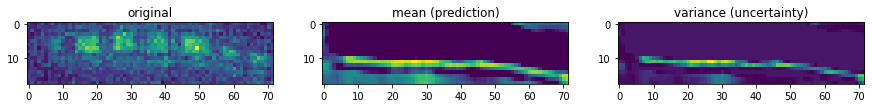

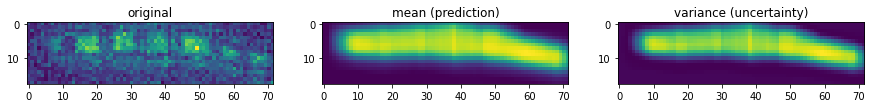

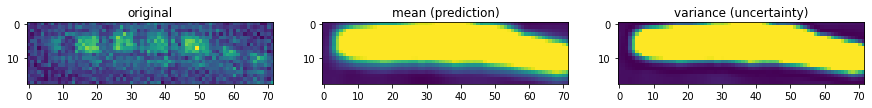

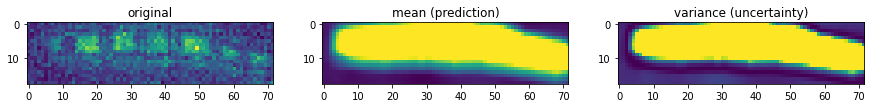

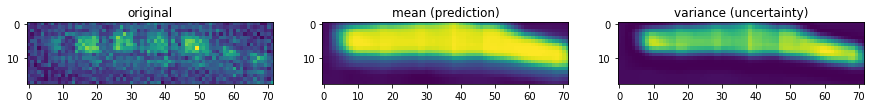

...

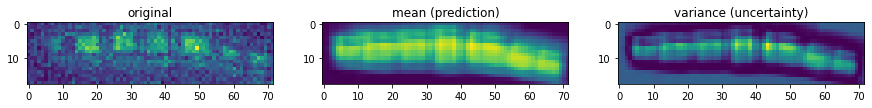

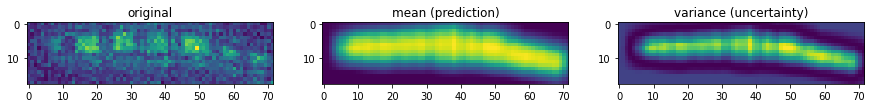

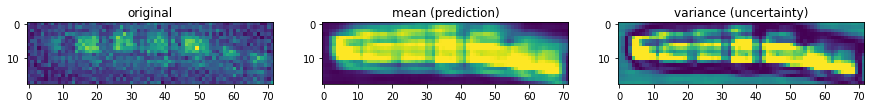

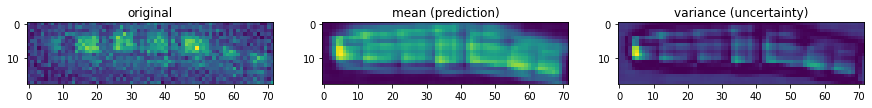

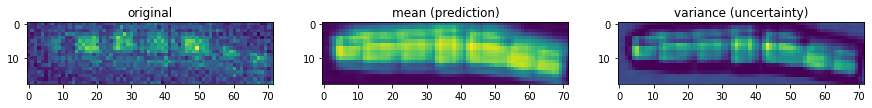

In [ ]:
# Band #3 as target property
y_targ = peaks_all_scalar3    #training output;
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_random3 = "/random_band3/"

# run DKL random with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_random(y, save_random3, num_cycles)

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_random(y, save_random3, num_cycles)

## Step 4: (matured)
* Band 1 only (?)
* (i.e. the DKL model at the end of exploration--at 200 step in this work) and real time DKL model.

In [ ]:
# Band 1

y_targ = peaks_all_scalar1   #training output;
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_mature_full = "/mature_full_record/"

# run real-time DKL, mature DKL, and full DKL with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_mature_full(y, save_mature_full, num_cycles)

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_mature_full(y, save_mature_full, num_cycles)

Epoch 1/200 ... Training loss: 0.8816
Epoch 10/200 ... Training loss: 0.8139
Epoch 20/200 ... Training loss: 0.7723
Epoch 30/200 ... Training loss: 0.7306
Epoch 40/200 ... Training loss: 0.6883
Epoch 50/200 ... Training loss: 0.6444
Epoch 60/200 ... Training loss: 0.6031
Epoch 70/200 ... Training loss: 0.5585
Epoch 80/200 ... Training loss: 0.5185
Epoch 90/200 ... Training loss: 0.4765
Epoch 100/200 ... Training loss: 0.433
Epoch 110/200 ... Training loss: 0.3867
Epoch 120/200 ... Training loss: 0.3381
Epoch 130/200 ... Training loss: 0.2917
Epoch 140/200 ... Training loss: 0.2473
Epoch 150/200 ... Training loss: 0.203
Epoch 160/200 ... Training loss: 0.159
Epoch 170/200 ... Training loss: 0.1151
Epoch 180/200 ... Training loss: 0.0712
Epoch 190/200 ... Training loss: 0.0272
Epoch 200/200 ... Training loss: -0.0171
Epoch 1/200 ... Training loss: 0.7712


/usr/local/lib/python3.8/dist-packages/gpytorch/utils/linear_cg.py:266: UserWarning: An output with one or more elements was resized since it had shape [1, 11], which does not match the required output shape [1, 1, 11]. This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at ../aten/src/ATen/native/Resize.cpp:17.)
  _jit_linear_cg_updates_no_precond(


Epoch 10/200 ... Training loss: 0.7249
Epoch 20/200 ... Training loss: 0.6888
Epoch 30/200 ... Training loss: 0.6554
Epoch 40/200 ... Training loss: 0.6116
Epoch 50/200 ... Training loss: 0.5725
Epoch 60/200 ... Training loss: 0.5305
Epoch 70/200 ... Training loss: 0.4905
Epoch 80/200 ... Training loss: 0.4457
Epoch 90/200 ... Training loss: 0.4042
Epoch 100/200 ... Training loss: 0.3576
Epoch 110/200 ... Training loss: 0.3156
Epoch 120/200 ... Training loss: 0.2693
Epoch 130/200 ... Training loss: 0.2241
Epoch 140/200 ... Training loss: 0.1786
Epoch 150/200 ... Training loss: 0.1317
Epoch 160/200 ... Training loss: 0.0847
Epoch 170/200 ... Training loss: 0.0376
Epoch 180/200 ... Training loss: -0.0048
Epoch 190/200 ... Training loss: -0.0473
Epoch 200/200 ... Training loss: -0.0958
1/20
Epoch 1/200 ... Training loss: 0.9671
Epoch 10/200 ... Training loss: 0.9342
Epoch 20/200 ... Training loss: 0.8636
Epoch 30/200 ... Training loss: 0.8037
Epoch 40/200 ... Training loss: 0.7471
Epoch 5

/usr/local/lib/python3.8/dist-packages/gpytorch/utils/linear_cg.py:266: UserWarning: An output with one or more elements was resized since it had shape [1, 11], which does not match the required output shape [1, 1, 11]. This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at ../aten/src/ATen/native/Resize.cpp:17.)
  _jit_linear_cg_updates_no_precond(


Epoch 10/200 ... Training loss: 0.7249
Epoch 20/200 ... Training loss: 0.6888
Epoch 30/200 ... Training loss: 0.6554
Epoch 40/200 ... Training loss: 0.6116
Epoch 50/200 ... Training loss: 0.5725
Epoch 60/200 ... Training loss: 0.5305
Epoch 70/200 ... Training loss: 0.4905
Epoch 80/200 ... Training loss: 0.4457
Epoch 90/200 ... Training loss: 0.4041
Epoch 100/200 ... Training loss: 0.3574
Epoch 110/200 ... Training loss: 0.3165
Epoch 120/200 ... Training loss: 0.2695
Epoch 130/200 ... Training loss: 0.224
Epoch 140/200 ... Training loss: 0.1782
Epoch 150/200 ... Training loss: 0.1302
Epoch 160/200 ... Training loss: 0.0848
Epoch 170/200 ... Training loss: 0.0369
Epoch 180/200 ... Training loss: -0.0048
Epoch 190/200 ... Training loss: -0.0475
Epoch 200/200 ... Training loss: -0.0966
1/20
Epoch 1/200 ... Training loss: 0.9671
Epoch 10/200 ... Training loss: 0.9342
Epoch 20/200 ... Training loss: 0.8636
Epoch 30/200 ... Training loss: 0.8037
Epoch 40/200 ... Training loss: 0.7471
Epoch 50

/usr/local/lib/python3.8/dist-packages/gpytorch/utils/linear_cg.py:266: UserWarning: An output with one or more elements was resized since it had shape [1, 11], which does not match the required output shape [1, 1, 11]. This behavior is deprecated, and in a future PyTorch release outputs will not be resized unless they have zero elements. You can explicitly reuse an out tensor t by resizing it, inplace, to zero elements with t.resize_(0). (Triggered internally at ../aten/src/ATen/native/Resize.cpp:17.)
  _jit_linear_cg_updates_no_precond(


Epoch 1/200 ... Training loss: 0.7712
Epoch 10/200 ... Training loss: 0.7249
Epoch 20/200 ... Training loss: 0.6888
Epoch 30/200 ... Training loss: 0.6555
Epoch 40/200 ... Training loss: 0.6116
Epoch 50/200 ... Training loss: 0.5725
Epoch 60/200 ... Training loss: 0.5305
Epoch 70/200 ... Training loss: 0.4904
Epoch 80/200 ... Training loss: 0.4457
Epoch 90/200 ... Training loss: 0.4042
Epoch 100/200 ... Training loss: 0.3575
Epoch 110/200 ... Training loss: 0.3158
Epoch 120/200 ... Training loss: 0.269
Epoch 130/200 ... Training loss: 0.2238
Epoch 140/200 ... Training loss: 0.1781
Epoch 150/200 ... Training loss: 0.1303
Epoch 160/200 ... Training loss: 0.0844
Epoch 170/200 ... Training loss: 0.0369
Epoch 180/200 ... Training loss: -0.0054
Epoch 190/200 ... Training loss: -0.0477
Epoch 200/200 ... Training loss: -0.0965
1/20
Epoch 1/200 ... Training loss: 0.9671
Epoch 10/200 ... Training loss: 0.9342
Epoch 20/200 ... Training loss: 0.8636
Epoch 30/200 ... Training loss: 0.8037
Epoch 40/

## Zip and download all results


In [ ]:
# !zip -r /content/Forensic_EELS_NP3_01.zip /content/rf   # zip the root folder
!zip -r /content/Forensic_EELS_NP1_20explore.zip /content/rf   # zip the root folder


from google.colab import files
# files.download("/content/Forensic_EELS_NP3_01.zip")  # download to local
files.download("/content/Forensic_EELS_NP1_20explore.zip")

updating: content/rf/ (stored 0%)
updating: content/rf/EI/ (stored 0%)
updating: content/rf/EI/random_band3/ (stored 0%)
updating: content/rf/EI/random_band3/record8.npz (deflated 23%)
updating: content/rf/EI/random_band3/record11.npz (deflated 27%)
updating: content/rf/EI/random_band3/record16.npz (deflated 21%)
updating: content/rf/EI/random_band3/record7.npz (deflated 28%)
updating: content/rf/EI/random_band3/record13.npz (deflated 22%)
updating: content/rf/EI/random_band3/record4.npz (deflated 22%)
updating: content/rf/EI/random_band3/record18.npz (deflated 19%)
updating: content/rf/EI/random_band3/record19.npz (deflated 24%)
updating: content/rf/EI/random_band3/record5.npz (deflated 23%)
updating: content/rf/EI/random_band3/record14.npz (deflated 22%)
updating: content/rf/EI/random_band3/record12.npz (deflated 20%)
updating: content/rf/EI/random_band3/record1.npz (deflated 22%)
updating: content/rf/EI/random_band3/record10.npz (deflated 33%)
updating: content/rf/EI/random_band3/in

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>



# Step 5. Analysis

In [ ]:
%cd "/content/"
use_own_data = input("Download and analyze prior data? Y or N")
if use_own_data == "Y":

    # !wget https://www.dropbox.com/s/xe8y689piufln1j/Forensic_EELS_NP3_01.zip
    # !unzip Forensic_EELS_NP3_01.zip

    !wget https://www.dropbox.com/s/2kqznxkui0ajdr2/Forensic_EELS_NP1_20explore.zip
    !unzip Forensic_EELS_NP1_20explore.zip

/content
Download and analyze prior data? Y or NY
--2023-02-11 17:53:29--  https://www.dropbox.com/s/2kqznxkui0ajdr2/Forensic_EELS_NP1_20explore.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.81.18, 2620:100:6022:18::a27d:4212
Connecting to www.dropbox.com (www.dropbox.com)|162.125.81.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/2kqznxkui0ajdr2/Forensic_EELS_NP1_20explore.zip [following]
--2023-02-11 17:53:29--  https://www.dropbox.com/s/raw/2kqznxkui0ajdr2/Forensic_EELS_NP1_20explore.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucdb65eed6ed2d66a127f260b1ca.dl.dropboxusercontent.com/cd/0/inline/B2QEg07jlpXgKtp-vdaC8t4H7a_H8LH34vPKguaFJ_1xY9lHO4ROZxizog8H8C3jnu_j0Plm2iNYbQWamCLmK2Xyxxiztos1-HaP4Ai-wLit3mX4ghWqvM5FyMuQ4mCf5-XVwW4dBV5ZM2hNjKTMyHT0EE9BiIXUZbtvyDFLwFrnVQ/file# [following]
--2023-02-11 17:53:29--  https://ucdb65eed6ed2d66a127f260b1ca.dl.dropb

In [ ]:
%%capture
!pip install --upgrade git+https://github.com/ziatdinovmax/pyroved.git

In [ ]:
import glob
from scipy import ndimage
import matplotlib.gridspec as gridspec
import pyroved as pv
import numpy as np
import matplotlib.pyplot as plt
import cv2
from atomai.utils import extract_patches_
import glob
from torch.autograd import Variable
import atomai as aoi

import torch
import torch.nn as nn
import torch.nn.functional as F

from copy import deepcopy as dc

import h5py

from scipy import ndimage
from sklearn import decomposition

import matplotlib as mpl

import os
from atomai import utils

In [ ]:
%cd "/content/"

/content


## Step 5-1 Plot DKL results

Load results of real-time DKL, trained DKL, and Full-DKL

In [ ]:
rf

'/content/rf/'

In [ ]:
if use_own_data:

    exploration_steps = len(glob.glob("content/rf/EI/random_band1/record*")) # This should be 20
    rf                = "/content/content/rf/"

    # exploration_steps = len(glob.glob("content/rf_new2/EI/random_band1/record*")) # This should be 200 the last time I checked...!
    # rf                = "/content/content/rf_new2/"
# else exploration_steps already defined

In [ ]:
# Create array to save results of real time and matured DKL models
# save results from EI acuqisition funciton
var_compare = np.empty((3, 3, exploration_steps))  # uncertainty
var_dev_compare = np.empty((3, 3, exploration_steps)) # uncertainty variation
nextpoint_uncertainty_compare = np.empty((3, 3, exploration_steps)) # predicted next point uncertainty
nextpoint_measure_compare = np.empty((3, 3, exploration_steps)) # next point ground truth
nextpoint_pred_compare = np.empty((3, 3, exploration_steps)) # next point prediction

for acq_idx in range (3):
  os.chdir (rf + acq_funcs[acq_idx] + save_mature_full)
  for i in range (exploration_steps):
    # load results of DKL
    rec = np.load("record{}.npz".format(i))
    var_compare[acq_idx, :, i] = rec['var'].mean(), rec['var0'].mean(), rec['var1'].mean()
    var_dev_compare[acq_idx, :, i] = np.std(rec['var']), np.std(rec['var0']), np.std(rec['var1'])
    nextpoint_uncertainty_compare[acq_idx, :, i] = rec['var'].max(), rec['var0'].max(), rec['var1'].max()
    nextpoint_measure_compare[acq_idx, :, i] = rec['y_test'][rec['var'].argmax()], rec['y_test'][rec['var0'].argmax()], rec['y_test'][rec['var1'].argmax()]
    nextpoint_pred_compare[acq_idx, :, i] = rec['mean'][rec['var'].argmax()], rec['mean0'][rec['var0'].argmax()], rec['mean1'][rec['var1'].argmax()]

Plot uncertainty (of each model) as a function of step

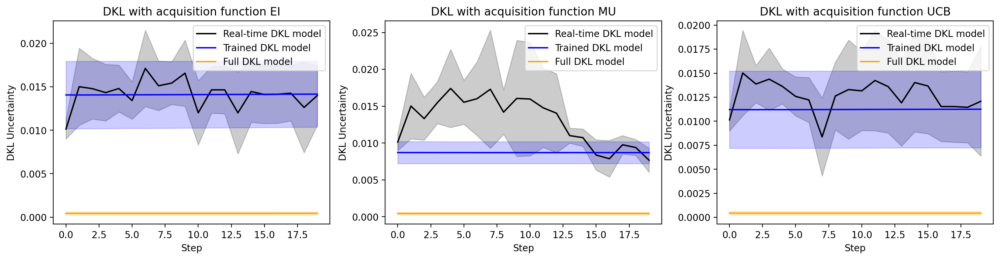

In [ ]:
s = np.arange(exploration_steps) #step

fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (18, 4), dpi = 200)

#Plot EI
ax1.set_title("DKL with acquisition function EI")
ax1.plot(s, var_compare[0, 0,], c= 'black', label = "Real-time DKL model")
ax1.fill_between(s, var_compare[0, 0,]-var_dev_compare[0, 0,],
                 var_compare[0, 0,]+var_dev_compare[0, 0,], color='black', alpha=0.2)
ax1.plot(s, var_compare[0, 1,], c = 'blue', label = "Trained DKL model")
ax1.fill_between(s, var_compare[0, 1,]-var_dev_compare[0, 1,],
                 var_compare[0, 1,]+var_dev_compare[0, 1,],  color='blue', alpha=0.2)
ax1.plot(s, var_compare[0, 2,], c = 'orange', label = "Full DKL model")
ax1.fill_between(s, var_compare[0, 2,]-var_dev_compare[0, 2,],
                 var_compare[0, 2,]+var_dev_compare[0, 2,], color='orange', alpha=0.2)
ax1.set_ylabel("DKL Uncertainty")
ax1.set_xlabel('Step')
ax1.legend()

#Plot MU
ax2.set_title("DKL with acquisition function MU")
ax2.plot(s, var_compare[1, 0,], c= 'black', label = "Real-time DKL model")
ax2.fill_between(s, var_compare[1, 0,]-var_dev_compare[1, 0,],
                 var_compare[1, 0,]+var_dev_compare[1, 0,], color='black', alpha=0.2)
ax2.plot(s, var_compare[1, 1,], c = 'blue', label = "Trained DKL model")
ax2.fill_between(s, var_compare[1, 1,]-var_dev_compare[1, 1,],
                 var_compare[1, 1,]+var_dev_compare[1, 1,],  color='blue', alpha=0.2)
ax2.plot(s, var_compare[1, 2,], c = 'orange', label = "Full DKL model")
ax2.fill_between(s, var_compare[1, 2,]-var_dev_compare[1, 2,],
                 var_compare[1, 2,]+var_dev_compare[1, 2,], color='orange', alpha=0.2)
ax2.set_ylabel("DKL Uncertainty")
ax2.set_xlabel('Step')
ax2.legend()

#Plot UCB
ax3.set_title("DKL with acquisition function UCB")
ax3.plot(s, var_compare[2, 0,], c= 'black', label = "Real-time DKL model")
ax3.fill_between(s, var_compare[2, 0,]-var_dev_compare[2, 0,],
                 var_compare[2, 0,]+var_dev_compare[2, 0,], color='black', alpha=0.2)
ax3.plot(s, var_compare[2, 1,], c = 'blue', label = "Trained DKL model")
ax3.fill_between(s, var_compare[2, 1,]-var_dev_compare[2, 1,],
                 var_compare[2, 1,]+var_dev_compare[2, 1,],  color='blue', alpha=0.2)
ax3.plot(s, var_compare[2, 2,], c = 'orange', label = "Full DKL model")
ax3.fill_between(s, var_compare[2, 2,]-var_dev_compare[2, 2,],
                 var_compare[2, 2,]+var_dev_compare[2, 2,], color='orange', alpha=0.2)
ax3.set_ylabel("DKL Uncertainty")
ax3.set_xlabel('Step')
ax3.legend()

plt.show()

Plot the maximum uncertainty point from each model as a funciton of step. For now, the next point uncertainty is simply defined as maximum uncertainty (needs some thinkings!--may need to use EI or UCB function;; or next point from experiment)

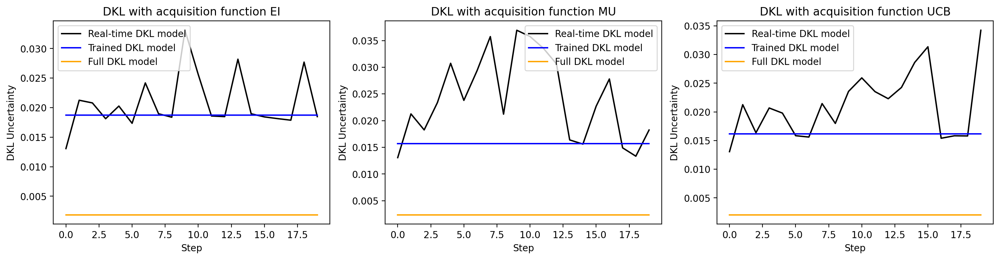

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (18, 4), dpi = 200)

# Plot EI
ax1.set_title("DKL with acquisition function EI")
ax1.plot(s, nextpoint_uncertainty_compare[0, 0,], c= 'black', label = "Real-time DKL model")
ax1.plot(s, nextpoint_uncertainty_compare[0, 1,], c = 'blue', label = "Trained DKL model")
ax1.plot(s, nextpoint_uncertainty_compare[0, 2,], c = 'orange', label = "Full DKL model")
ax1.set_ylabel("DKL Uncertainty"); ax1.set_xlabel('Step'); ax1.legend()

# Plot MU
ax2.set_title("DKL with acquisition function MU")
ax2.plot(s, nextpoint_uncertainty_compare[1, 0,], c= 'black', label = "Real-time DKL model")
ax2.plot(s, nextpoint_uncertainty_compare[1, 1,], c = 'blue', label = "Trained DKL model")
ax2.plot(s, nextpoint_uncertainty_compare[1, 2,], c = 'orange', label = "Full DKL model")
ax2.set_ylabel("DKL Uncertainty"); ax2.set_xlabel('Step'); ax2.legend()

# Plot UCB
ax3.set_title("DKL with acquisition function UCB")
ax3.plot(s, nextpoint_uncertainty_compare[2, 0,], c= 'black', label = "Real-time DKL model")
ax3.plot(s, nextpoint_uncertainty_compare[2, 1,], c = 'blue', label = "Trained DKL model")
ax3.plot(s, nextpoint_uncertainty_compare[2, 2,], c = 'orange', label = "Full DKL model")
ax3.set_ylabel("DKL Uncertainty"); ax3.set_xlabel('Step'); ax3.legend()

plt.show()

Plot next point ground truth (ie. next measurement value)  from each model as a funciton of step. For now, the next point is simply defined as maximum uncertainty (needs some thinkings!--may need to use EI or UCB function;; or next point from experiment)

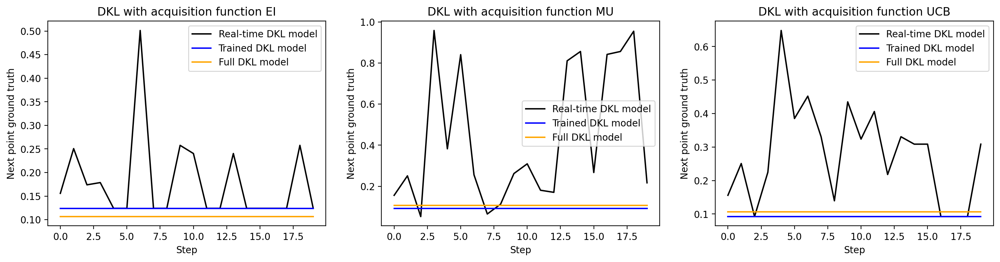

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (18, 4), dpi = 200)

# Plot EI
ax1.set_title("DKL with acquisition function EI")
ax1.plot(s, nextpoint_measure_compare[0, 0,], c= 'black', label = "Real-time DKL model")
ax1.plot(s, nextpoint_measure_compare[0, 1,], c = 'blue', label = "Trained DKL model")
ax1.plot(s, nextpoint_measure_compare[0, 2,], c = 'orange', label = "Full DKL model")
ax1.set_ylabel("Next point ground truth"); ax1.set_xlabel('Step'); ax1.legend()

# Plot MU
ax2.set_title("DKL with acquisition function MU")
ax2.plot(s, nextpoint_measure_compare[1, 0,], c= 'black', label = "Real-time DKL model")
ax2.plot(s, nextpoint_measure_compare[1, 1,], c = 'blue', label = "Trained DKL model")
ax2.plot(s, nextpoint_measure_compare[1, 2,], c = 'orange', label = "Full DKL model")
ax2.set_ylabel("Next point ground truth"); ax2.set_xlabel('Step'); ax2.legend()

# Plot UCB
ax3.set_title("DKL with acquisition function UCB")
ax3.plot(s, nextpoint_measure_compare[2, 0,], c= 'black', label = "Real-time DKL model")
ax3.plot(s, nextpoint_measure_compare[2, 1,], c = 'blue', label = "Trained DKL model")
ax3.plot(s, nextpoint_measure_compare[2, 2,], c = 'orange', label = "Full DKL model")
ax3.set_ylabel("Next point ground truth"); ax3.set_xlabel('Step'); ax3.legend()

plt.show()

Plot next point prediciton from each model as a funciton of step. For now, the next point is simply defined as maximum uncertainty (needs some thinkings!--may need to use EI or UCB function;; or next point from experiment)

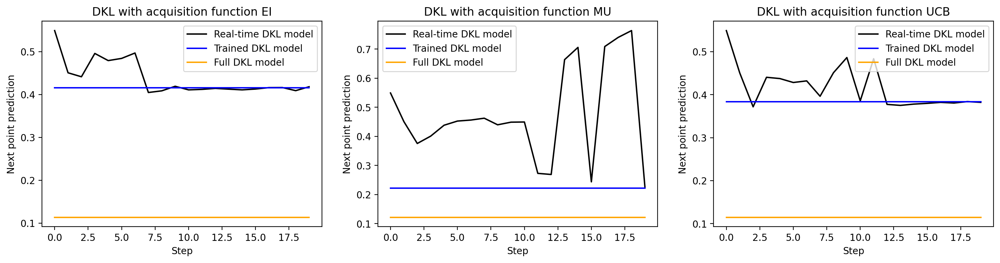

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (18, 4), dpi = 200)

# Plot EI
ax1.set_title("DKL with acquisition function EI")
ax1.plot(s, nextpoint_pred_compare[0, 0,], c= 'black', label = "Real-time DKL model")
ax1.plot(s, nextpoint_pred_compare[0, 1,], c = 'blue', label = "Trained DKL model")
ax1.plot(s, nextpoint_pred_compare[0, 2,], c = 'orange', label = "Full DKL model")
ax1.set_ylabel("Next point prediction"); ax1.set_xlabel('Step'); ax1.legend()

# Plot MU
ax2.set_title("DKL with acquisition function MU")
ax2.plot(s, nextpoint_pred_compare[1, 0,], c= 'black', label = "Real-time DKL model")
ax2.plot(s, nextpoint_pred_compare[1, 1,], c = 'blue', label = "Trained DKL model")
ax2.plot(s, nextpoint_pred_compare[1, 2,], c = 'orange', label = "Full DKL model")
ax2.set_ylabel("Next point prediction"); ax2.set_xlabel('Step'); ax2.legend()

# Plot UCB
ax3.set_title("DKL with acquisition function UCB")
ax3.plot(s, nextpoint_pred_compare[2, 0,], c= 'black', label = "Real-time DKL model")
ax3.plot(s, nextpoint_pred_compare[2, 1,], c = 'blue', label = "Trained DKL model")
ax3.plot(s, nextpoint_pred_compare[2, 2,], c = 'orange', label = "Full DKL model")
ax3.set_ylabel("Next point prediction"); ax3.set_xlabel('Step'); ax3.legend()

plt.show()

Calculate regret: here I define regret as the difference between real-time DKL prediciton (mean) and trained DKL prediction (mean).



In [ ]:
# Create array to save results of real time and matured DKL models
# save results from three acuqisition funciton
reg = np.empty((3, 2, exploration_steps))  # save the difference of predictions between real time DKL and trained DKL at each step; as well as deviation

for acq_idx in range (3):
  os.chdir (rf + acq_funcs[acq_idx] + save_mature_full)
  for i in range (exploration_steps):
    # load results
    rec = np.load("record{}.npz".format(i))
    mean_d = rec['mean']-rec['mean0']
    reg[acq_idx,:,i] = mean_d.mean(), np.std(mean_d)


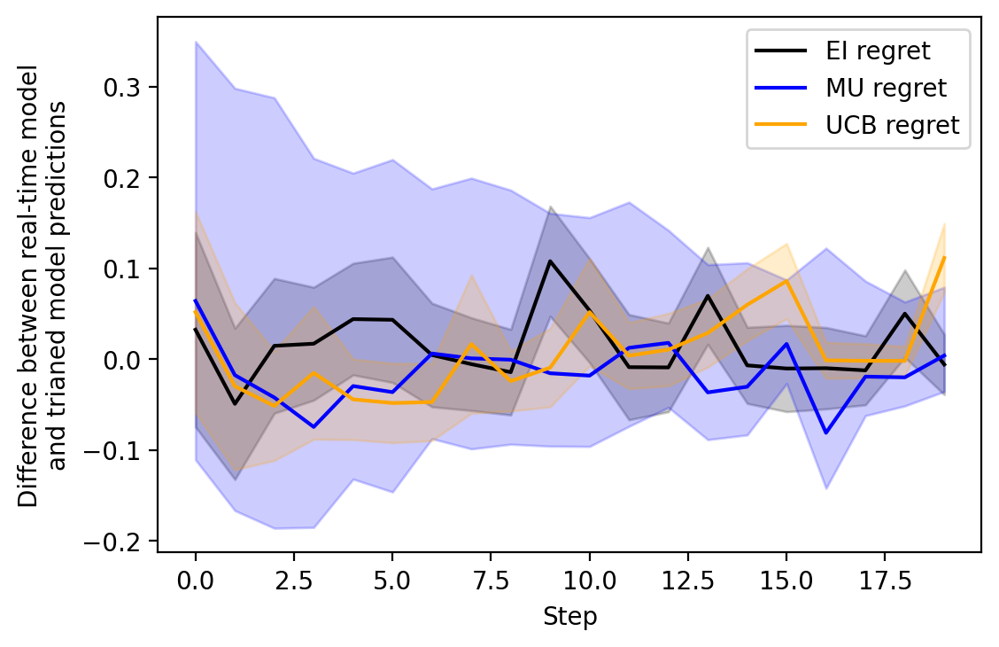

In [ ]:
fig, ax = plt.subplots(figsize = (6, 4), dpi = 200)

ax.plot(s, reg[0,0,], c= 'black', label = "EI regret")
ax.fill_between(s, reg[0,0,]-reg[0,1,], reg[0,0,]+reg[0,1,],
                color='black', alpha=0.2)

ax.plot(s, reg[1,0,], c= 'blue', label = "MU regret")
ax.fill_between(s, reg[1,0,]-reg[1,1,], reg[1,1,]+reg[1,1,],
                color='blue', alpha=0.2)

ax.plot(s, reg[2,0,], c= 'orange', label = "UCB regret")
ax.fill_between(s, reg[2,0,]-reg[2,1,], reg[2,0,]+reg[2,1,],
                color='orange', alpha=0.2)

ax.set_ylabel("Difference between real-time model\nand trianed model predictions")
ax.set_xlabel('Step')
plt.legend()
plt.show()

Structure similarity index between ground truth and prediciton

* I'm not sure what this is showing (Kevin)

* Also, somehow all the data did not get saved?
* Very strange!

In [ ]:
sim = np.zeros((3, 5, exploration_steps)) # structural similarity index
from skimage.metrics import structural_similarity as ssim

for acq_idx in range (3):
  for i in range (exploration_steps):

    try:
        os.chdir (rf + acq_funcs[acq_idx] + save_explore)
        rec = np.load("record{}.npz".format(i))
        pm = norm_(rec ['mean']) # DKL prediction
        gt = norm_(peaks_all_scalar1)  # ground truth
        sim[acq_idx, 0, i]=ssim(gt, pm, data_range=gt.max() - gt.min())  # calculate SSIM
    except FileNotFoundError:
        pass

    # Loop width DKL analysis based on locations from Step1
    os.chdir (rf + acq_funcs[acq_idx] + save_counter1)
    rec = np.load("record{}.npz".format(i))
    pm = norm_(rec ['mean']) # DKL prediction
    gt = norm_(peaks_all_scalar2)  # ground truth
    sim[acq_idx, 1, i]=ssim(gt, pm, data_range=gt.max() - gt.min())  # calculate SSIM

    # Coercive field DKL analysis based on locations from Step1
    os.chdir (rf + acq_funcs[acq_idx] + save_counter2)
    rec = np.load("record{}.npz".format(i))
    pm = norm_(rec ['mean']) # DKL prediction
    gt = norm_(peaks_all_scalar3)  # ground truth
    sim[acq_idx, 2, i]=ssim(gt, pm, data_range=gt.max() - gt.min())  # calculate SSIM

    # Loop width DKL analysis based on random locations
    os.chdir (rf + acq_funcs[acq_idx] + save_random1)
    rec = np.load("record{}.npz".format(i))
    pm = norm_(rec ['mean']) # DKL prediction
    gt = norm_(peaks_all_scalar2)  # ground truth
    sim[acq_idx, 3, i]=ssim(gt, pm, data_range=gt.max() - gt.min())  # calculate SSIM

    try:
        # COercive field DKL analysis based on random locations
        os.chdir (rf + acq_funcs[acq_idx] + save_random2)
        rec = np.load("record{}.npz".format(i))
        pm = norm_(rec ['mean']) # DKL prediction
        gt = norm_(peaks_all_scalar3)  # ground truth
        sim[acq_idx, 4, i]=ssim(gt, pm, data_range=gt.max() - gt.min())  # calculate SSIM

    except FileNotFoundError:
        pass

In [ ]:
%ls

final_traindata.npz    record132.npz  record167.npz  record20.npz  record62.npz
initial_traindata.npz  record133.npz  record168.npz  record22.npz  record63.npz
record0.npz            record134.npz  record169.npz  record24.npz  record65.npz
record100.npz          record135.npz  record16.npz   record26.npz  record66.npz
record101.npz          record136.npz  record170.npz  record27.npz  record67.npz
record102.npz          record137.npz  record171.npz  record29.npz  record6.npz
record103.npz          record138.npz  record172.npz  record2.npz   record70.npz
record104.npz          record139.npz  record173.npz  record30.npz  record71.npz
record105.npz          record13.npz   record174.npz  record33.npz  record75.npz
record107.npz          record140.npz  record175.npz  record37.npz  record77.npz
record108.npz          record141.npz  record176.npz  record38.npz  record78.npz
record109.npz          record142.npz  record178.npz  record39.npz  record79.npz
record10.npz           record144.npz  rec

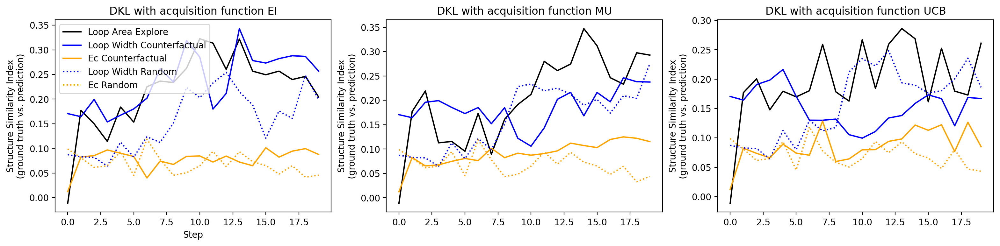

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (19, 4), dpi = 200)

# Plot EI
ax1.set_title("DKL with acquisition function EI")
ax1.plot(s, sim[0, 0,], c= 'black', label = "Loop Area Explore")
ax1.plot(s, sim[0, 1,], c = 'blue', label = "Loop Width Counterfactual")
ax1.plot(s, sim[0, 2,], c = 'orange', label = "Ec Counterfactual")
ax1.plot(s, sim[0, 3,], c = 'blue', linestyle = ":", label = "Loop Width Random")
ax1.plot(s, sim[0, 4,], c = 'orange', linestyle = ":", label = "Ec Random")
ax1.set_ylabel("Structure Similarity Index\n(ground truth vs. prediction)"); ax1.set_xlabel('Step'); ax1.legend()

# Plot MU
ax2.set_title("DKL with acquisition function MU")
ax2.plot(s, sim[1, 0,], c= 'black', label = "Loop Area Explore")
ax2.plot(s, sim[1, 1,], c = 'blue', label = "Loop Width Counterfactual")
ax2.plot(s, sim[1, 2,], c = 'orange', label = "Ec Counterfactual")
ax2.plot(s, sim[1, 3,], c = 'blue', linestyle = ":", label = "Loop Width Random")
ax2.plot(s, sim[1, 4,], c = 'orange', linestyle = ":", label = "Ec Random")
ax2.set_ylabel("Structure Similarity Index\n(ground truth vs. prediction)"); ax1.set_xlabel('Step'); ax1.legend()

# Plot UCB
ax3.set_title("DKL with acquisition function UCB")
ax3.plot(s, sim[2, 0,], c= 'black', label = "Loop Area Explore")
ax3.plot(s, sim[2, 1,], c = 'blue', label = "Loop Width Counterfactual")
ax3.plot(s, sim[2, 2,], c = 'orange', label = "Ec Counterfactual")
ax3.plot(s, sim[2, 3,], c = 'blue', linestyle = ":", label = "Loop Width Random")
ax3.plot(s, sim[2, 4,], c = 'orange', linestyle = ":", label = "Ec Random")
ax3.set_ylabel("Structure Similarity Index\n(ground truth vs. prediction)"); ax1.set_xlabel('Step'); ax1.legend()

plt.show()

In [ ]:
traj_EI = np.zeros((exploration_steps, 2))
traj_MU = np.zeros((exploration_steps, 2))
traj_UCB = np.zeros((exploration_steps, 2))

for i in range (exploration_steps):
  os.chdir (rf + acq_funcs[0] + save_explore)
  rec = np.load("record{}.npz".format(i))
  nextpoint = rec ['next_point']
  traj_EI [i, ] = nextpoint

  try:
    os.chdir (rf + acq_funcs[1] + save_explore)
    rec = np.load("record{}.npz".format(i))
    nextpoint = rec ['next_point']
    traj_MU [i, ] = nextpoint
  except FileNotFoundError:
    pass

  os.chdir (rf + acq_funcs[2] + save_explore)
  rec = np.load("record{}.npz".format(i))
  nextpoint = rec ['next_point']
  traj_UCB [i, ] = nextpoint

(-0.5, 78.5, -0.5, 24.5)

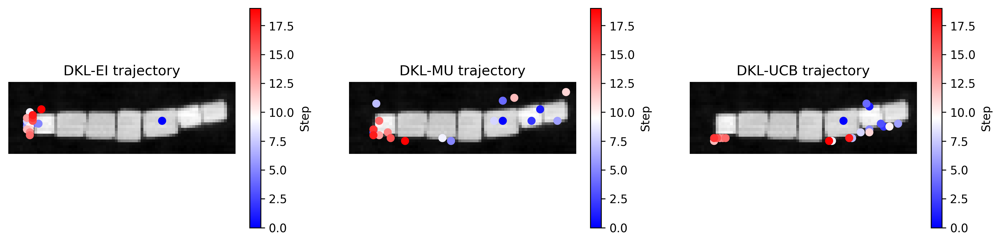

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5), dpi = 300)

cm = 'gray'
shrink = 0.7

ax1.imshow(full_img, interpolation='nearest', origin = "lower", cmap=cm)
im1 = ax1.scatter(traj_EI[:,1], traj_EI[:,0], c = np.arange(exploration_steps), cmap = 'bwr')
fig.colorbar(im1, ax=ax1, shrink = shrink, label = "Step")
ax1.set_title("DKL-EI trajectory")
ax1.axis('off')

ax2.imshow(full_img, interpolation='nearest', origin = "lower", cmap=cm)
im2 = ax2.scatter(traj_MU[:,1], traj_MU[:,0], c = np.arange(exploration_steps), cmap = 'bwr')
fig.colorbar(im2, ax=ax2, shrink = shrink, label = "Step")
ax2.set_title("DKL-MU trajectory")
ax2.axis('off')

ax3.imshow(full_img, interpolation='nearest', origin = "lower", cmap=cm)
im3 = ax3.scatter(traj_UCB[:,1], traj_UCB[:,0], c = np.arange(exploration_steps), cmap = 'bwr')
fig.colorbar(im3, ax=ax3, shrink = shrink, label = "Step")
ax3.set_title("DKL-UCB trajectory")
ax3.axis('off')

## Step 5-2. rVAE analysis on DKL sampled data

EI sampled data

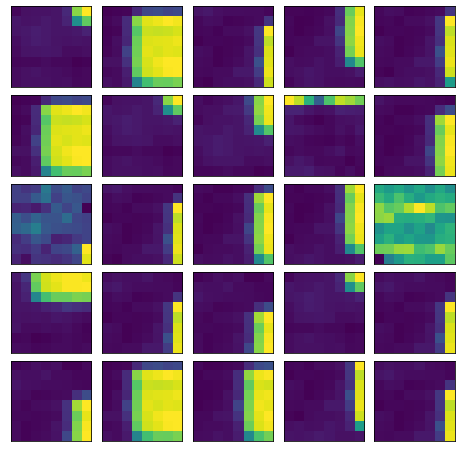

In [ ]:
# Load DKL sampled data
os.chdir(rf + acq_funcs[0] + save_explore)
rec = np.load("final_traindata.npz")
X_train = rec['X_train']

# Initialize VAE train loader
vae_EI_data = torch.tensor(X_train.reshape(-1, ws, ws)).float()
vae_EI_loader = pv.utils.init_dataloader(vae_EI_data, batch_size=64, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_EI_data))
    ax.imshow(vae_EI_data[i].cpu(), interpolation='nearest')

In [ ]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_EI = pv.models.iVAE(in_dim, latent_dim=2, invariances='r',
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)

# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_EI)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_EI_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 62847.7165
Epoch: 2 Training loss: 52540.9190
Epoch: 3 Training loss: 43288.2932
Epoch: 4 Training loss: 38380.8256
Epoch: 5 Training loss: 33924.0083
Epoch: 6 Training loss: 31559.0747
Epoch: 7 Training loss: 28937.6829
Epoch: 8 Training loss: 28822.7044
Epoch: 9 Training loss: 29699.1963
Epoch: 10 Training loss: 29734.7686
Epoch: 11 Training loss: 27514.5926
Epoch: 12 Training loss: 25972.8587
Epoch: 13 Training loss: 22970.8753
Epoch: 14 Training loss: 22722.7111
Epoch: 15 Training loss: 20418.6510
Epoch: 16 Training loss: 21786.8517
Epoch: 17 Training loss: 21571.5429
Epoch: 18 Training loss: 19254.9984
Epoch: 19 Training loss: 17715.6499
Epoch: 20 Training loss: 16359.5427
Epoch: 21 Training loss: 18577.2881
Epoch: 22 Training loss: 17099.6023
Epoch: 23 Training loss: 15448.7252
Epoch: 24 Training loss: 16592.2583
Epoch: 25 Training loss: 14727.4023
Epoch: 26 Training loss: 13508.0152
Epoch: 27 Training loss: 11862.8644
Epoch: 28 Training loss: 12405.7511
E

Text(0, 0.5, '$z_1$')

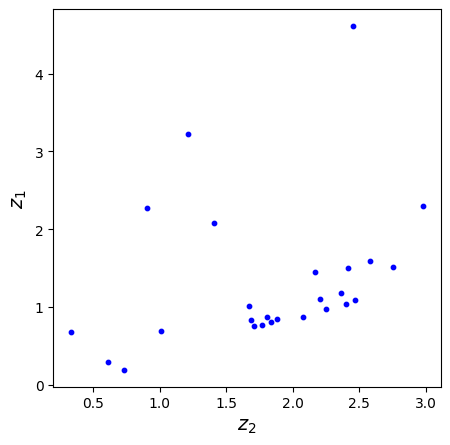

In [ ]:
z_mean_EI, z_sd_EI = rvae_EI.encode(vae_EI_data)

plt.figure(figsize=(5, 5), dpi = 100)
plt.scatter(z_mean_EI[:, -1], z_mean_EI[:, -2], s=10, c='blue')
plt.xlabel("$z_2$", fontsize=14)
plt.ylabel("$z_1$", fontsize=14)

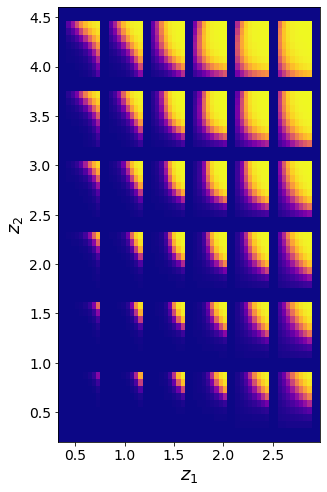

In [ ]:
rvae_EI.manifold2d(6,
                   z_coord = [z_mean_EI[:, -1].min(), z_mean_EI[:, -1].max(), z_mean_EI[:, -2].min(), z_mean_EI[:, -2].max()],
                   cmap = 'plasma', dpi = 100);

Maximum uncertainty sampled data

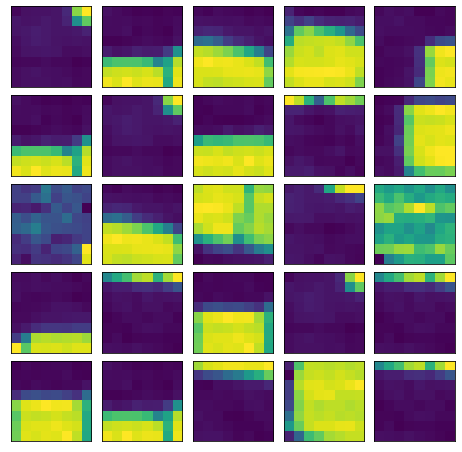

In [ ]:
# Load DKL sampled data
os.chdir(rf + acq_funcs[1] + save_explore)
rec = np.load("final_traindata.npz")
X_train = rec['X_train']

# Initialize VAE train loader
vae_MU_data = torch.tensor(X_train.reshape(-1, ws, ws)).float()
vae_MU_loader = pv.utils.init_dataloader(vae_MU_data, batch_size=64, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_MU_data))
    ax.imshow(vae_MU_data[i].cpu(), interpolation='nearest')

In [ ]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_MU = pv.models.iVAE(in_dim, latent_dim=2, invariances='r',
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_MU)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_MU_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 57996.9079
Epoch: 2 Training loss: 51243.2124
Epoch: 3 Training loss: 46398.8196
Epoch: 4 Training loss: 44122.2722
Epoch: 5 Training loss: 42897.0955
Epoch: 6 Training loss: 42034.1509
Epoch: 7 Training loss: 40788.1763
Epoch: 8 Training loss: 40252.5165
Epoch: 9 Training loss: 39816.8032
Epoch: 10 Training loss: 34734.1257
Epoch: 11 Training loss: 33596.1740
Epoch: 12 Training loss: 32772.4937
Epoch: 13 Training loss: 25889.8035
Epoch: 14 Training loss: 28547.5486
Epoch: 15 Training loss: 31639.7358
Epoch: 16 Training loss: 26223.0624
Epoch: 17 Training loss: 24933.8347
Epoch: 18 Training loss: 21513.7611
Epoch: 19 Training loss: 20760.3398
Epoch: 20 Training loss: 19642.6890
Epoch: 21 Training loss: 16814.4754
Epoch: 22 Training loss: 15347.7331
Epoch: 23 Training loss: 15934.3513
Epoch: 24 Training loss: 15902.6859
Epoch: 25 Training loss: 15737.5591
Epoch: 26 Training loss: 15015.2134
Epoch: 27 Training loss: 14180.6330
Epoch: 28 Training loss: 12999.0126
E

Text(0, 0.5, '$z_1$')

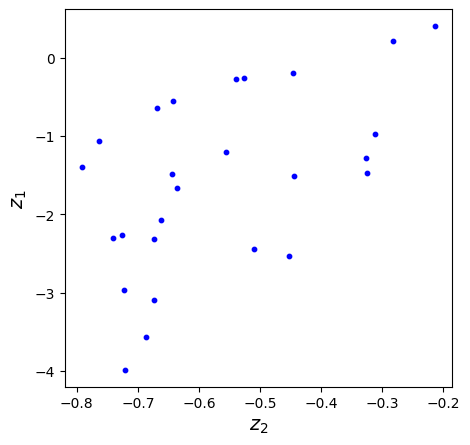

In [ ]:
z_mean_MU, z_sd_MU = rvae_MU.encode(vae_MU_data)

plt.figure(figsize=(5, 5), dpi = 100)
plt.scatter(z_mean_MU[:, -1], z_mean_MU[:, -2], s=10, c='blue')
plt.xlabel("$z_2$", fontsize=14)
plt.ylabel("$z_1$", fontsize=14)

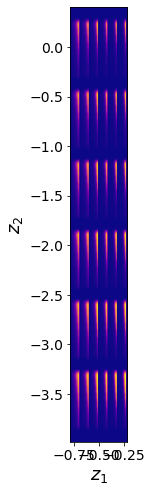

In [ ]:
rvae_MU.manifold2d(6,
                   z_coord = [z_mean_MU[:, -1].min(), z_mean_MU[:, -1].max(), z_mean_MU[:, -2].min(), z_mean_MU[:, -2].max()],
                   cmap = 'plasma', dpi = 100);

UCB sampled data

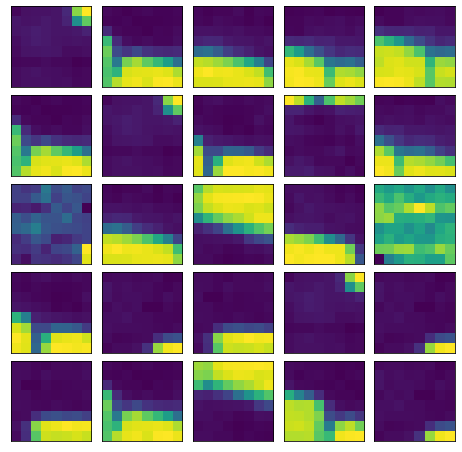

In [ ]:
# Load DKL sampled data
os.chdir(rf + acq_funcs[2] + save_explore)
rec = np.load("final_traindata.npz")
X_train = rec['X_train']

# Initialize VAE train loader
vae_UCB_data = torch.tensor(X_train.reshape(-1, ws, ws)).float()
vae_UCB_loader = pv.utils.init_dataloader(vae_UCB_data, batch_size=64, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_UCB_data))
    ax.imshow(vae_UCB_data[i].cpu(), interpolation='nearest')

In [ ]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_UCB = pv.models.iVAE(in_dim, latent_dim=2, invariances='r',
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_UCB)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_UCB_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 61130.4427
Epoch: 2 Training loss: 52685.8256
Epoch: 3 Training loss: 46196.9909
Epoch: 4 Training loss: 42393.3974
Epoch: 5 Training loss: 39864.3200
Epoch: 6 Training loss: 38489.0703
Epoch: 7 Training loss: 36647.2745
Epoch: 8 Training loss: 37672.1184
Epoch: 9 Training loss: 37283.0085
Epoch: 10 Training loss: 36839.4030
Epoch: 11 Training loss: 36675.6556
Epoch: 12 Training loss: 35230.8733
Epoch: 13 Training loss: 31068.0752
Epoch: 14 Training loss: 34674.4324
Epoch: 15 Training loss: 28799.1874
Epoch: 16 Training loss: 26907.4188
Epoch: 17 Training loss: 28345.7343
Epoch: 18 Training loss: 27102.5535
Epoch: 19 Training loss: 24848.2014
Epoch: 20 Training loss: 24339.6805
Epoch: 21 Training loss: 22832.1411
Epoch: 22 Training loss: 23133.5471
Epoch: 23 Training loss: 23234.9431
Epoch: 24 Training loss: 22005.0251
Epoch: 25 Training loss: 18494.8377
Epoch: 26 Training loss: 18296.9395
Epoch: 27 Training loss: 18359.9437
Epoch: 28 Training loss: 17257.1768
E

Text(0, 0.5, '$z_1$')

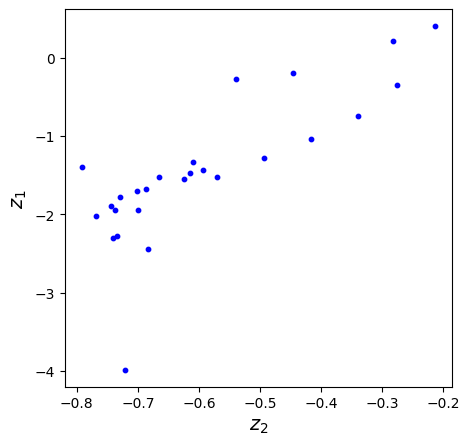

In [ ]:
z_mean_UCB, z_sd_UCB = rvae_MU.encode(vae_UCB_data)

plt.figure(figsize=(5, 5), dpi = 100)
plt.scatter(z_mean_UCB[:, -1], z_mean_UCB[:, -2], s=10, c='blue')
plt.xlabel("$z_2$", fontsize=14)
plt.ylabel("$z_1$", fontsize=14)

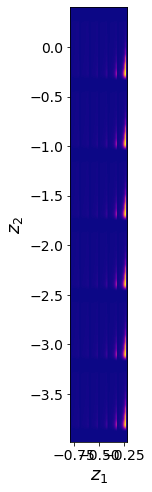

In [ ]:
rvae_UCB.manifold2d(6,
                    z_coord = [z_mean_UCB[:, -1].min(), z_mean_UCB[:, -1].max(), z_mean_UCB[:, -2].min(), z_mean_UCB[:, -2].max()],
                    cmap = 'plasma', dpi = 100);

rVAE analysis on all patches

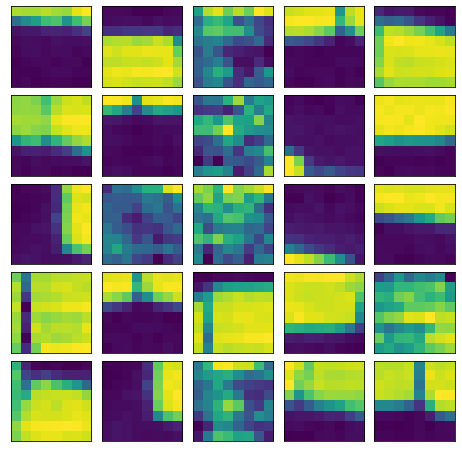

In [ ]:
# Initialize VAE train loader
vae_all_data = torch.tensor(X.reshape(-1, ws, ws)).float()
vae_all_loader = pv.utils.init_dataloader(vae_all_data, batch_size=64, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_all_data))
    ax.imshow(vae_all_data[i].cpu(), interpolation='nearest')

In [ ]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_all = pv.models.iVAE(in_dim, latent_dim=2, invariances='r',
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_all)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_all_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 35774.0773
Epoch: 2 Training loss: 18233.5141
Epoch: 3 Training loss: 10923.1441
Epoch: 4 Training loss: 8823.3135
Epoch: 5 Training loss: 7659.4737
Epoch: 6 Training loss: 7137.3688
Epoch: 7 Training loss: 6738.6740
Epoch: 8 Training loss: 6043.9816
Epoch: 9 Training loss: 5541.7013
Epoch: 10 Training loss: 5046.4978
Epoch: 11 Training loss: 4749.3048
Epoch: 12 Training loss: 4488.9677
Epoch: 13 Training loss: 4368.0584
Epoch: 14 Training loss: 4353.1112
Epoch: 15 Training loss: 3981.0861
Epoch: 16 Training loss: 3823.0723
Epoch: 17 Training loss: 3775.7860
Epoch: 18 Training loss: 3803.7552
Epoch: 19 Training loss: 3765.2719
Epoch: 20 Training loss: 3656.1380
Epoch: 21 Training loss: 3573.3772
Epoch: 22 Training loss: 3485.3742
Epoch: 23 Training loss: 3536.6149
Epoch: 24 Training loss: 3486.2760
Epoch: 25 Training loss: 3392.8566
Epoch: 26 Training loss: 3331.4268
Epoch: 27 Training loss: 3295.4230
Epoch: 28 Training loss: 3218.4643
Epoch: 29 Training loss: 3

Text(0, 0.5, '$z_1$')

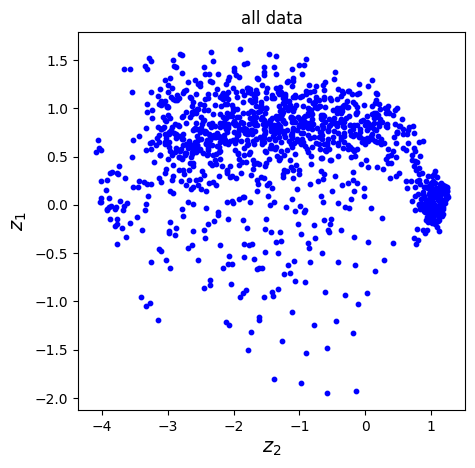

In [ ]:
z_mean_all, z_sd_all = rvae_all.encode(vae_all_data)

plt.figure(figsize=(5, 5), dpi = 100)
plt.title('all data')
plt.scatter(z_mean_all[:, -1], z_mean_all[:, -2], s=10, c='blue')
plt.xlabel("$z_2$", fontsize=14)
plt.ylabel("$z_1$", fontsize=14)

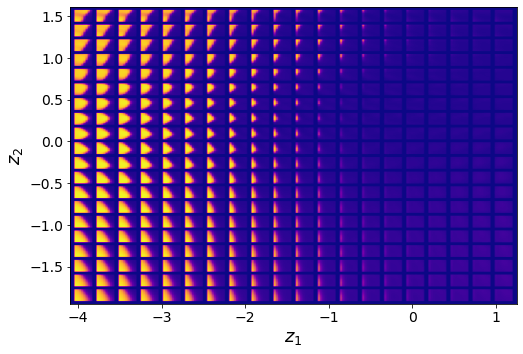

In [ ]:
rvae_all.manifold2d(20,
                    z_coord = [z_mean_all[:, -1].min(), z_mean_all[:, -1].max(), z_mean_all[:, -2].min(), z_mean_all[:, -2].max()],
                    cmap = 'plasma', dpi = 300);

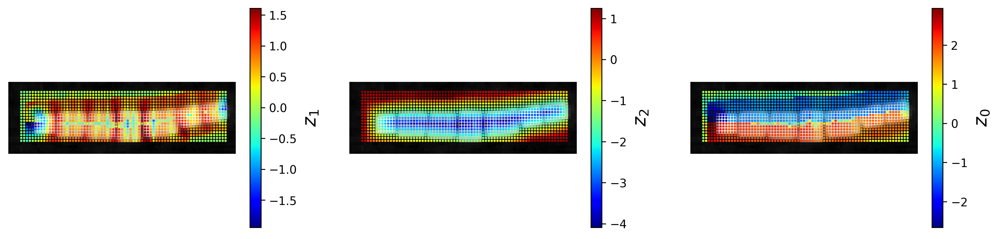

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5), dpi = 300)
ax1.imshow(full_img, origin = "lower", cmap = 'gray')
im1=ax1.scatter(indices_all[:,1], indices_all[:,0], s=1, c = z_mean_all[:,-2], cmap = 'jet')
ax1.axis(False)
cbar1 = fig.colorbar(im1, ax=ax1, shrink=.7)
cbar1.set_label("$z_1$", fontsize=16)

ax2.imshow(full_img, origin = "lower", cmap = 'gray')
im2=ax2.scatter(indices_all[:,1], indices_all[:,0], s=1, c = z_mean_all[:,-1], cmap = 'jet')
ax2.axis(False)
cbar2 = fig.colorbar(im2, ax=ax2, shrink=.7)
cbar2.set_label("$z_2$", fontsize=16)

im3=ax3.imshow(full_img, origin = "lower", cmap = 'gray')
im3=ax3.scatter(indices_all[:,1], indices_all[:,0], s=1, c = z_mean_all[:,-3], cmap = 'jet')
ax3.axis(False)
cbar3 = fig.colorbar(im3, ax=ax3, shrink=.7)
cbar3.set_label("$z_0$", fontsize=16)

Plot samplings (from different acquition functions) distribution in the latent space of all patches

In [ ]:
import pandas as pd
import seaborn as sns

z1 = np.asarray(z_mean_all, dtype = np.float32);
z2 = np.asarray(z_mean_EI, dtype = np.float32)
d = np.append(z1, z2, axis = 0)

s = pd.DataFrame({"z0": d[:,0], "z1": d[:,1], "z2": d[:,2], "Data": 'All Data'})
s['Data'][len(z1):] = "DKL Train Data"

<ipython-input-99-5197c3e1021d>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  s['Data'][len(z1):] = "DKL Train Data"


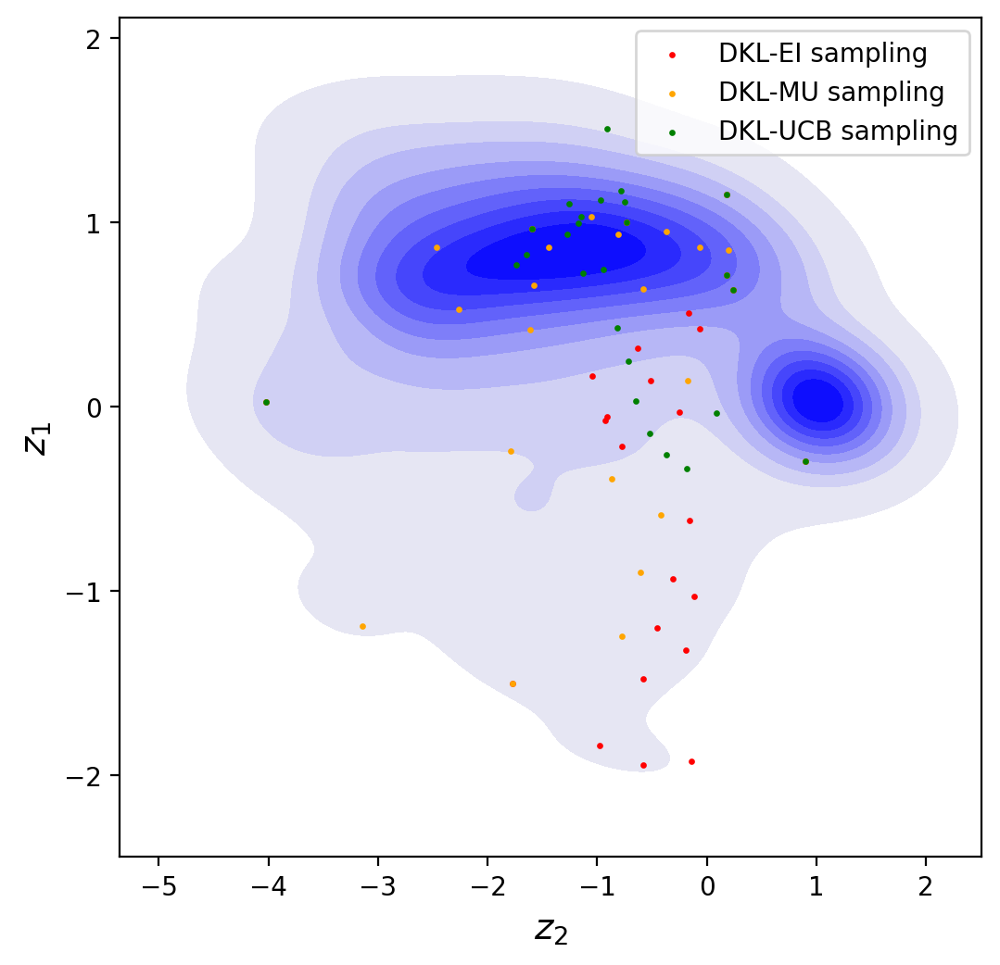

In [ ]:
z_mean_all_EI, z_sd_all_EI = rvae_all.encode(vae_EI_data)
z_mean_all_MU, z_sd_all_MU = rvae_all.encode(vae_MU_data)
z_mean_all_UCB, z_sd_all_UCB = rvae_all.encode(vae_UCB_data)

f, ax = plt.subplots(figsize = (6,6), dpi = 200)

data = z1
s = pd.DataFrame({"z0": data[:,0], "z1": data[:,1], "z2": data[:,2]})
ax = sns.kdeplot(data=s, x = "z2", y = "z1", fill=True, thresh=0.01, levels=10, cmap="light:b")
# ax.set_ylim(-5, 5)
# ax.set_xlim(-5, 5)

#ax.scatter(z_mean_all[:, -1], z_mean_all[:, -2], c = 'gray', s=0.5, label = "Full patches")
ax.scatter(z_mean_all_EI[:, -1], z_mean_all_EI[:, -2], c='r', marker = 'o', s=2, label = "DKL-EI sampling")
ax.scatter(z_mean_all_MU[:, -1], z_mean_all_MU[:, -2], c='orange', marker = 'o', s=2, label = "DKL-MU sampling")
ax.scatter(z_mean_all_UCB[:, -1], z_mean_all_UCB[:, -2], c='green', marker = 'o', s=2, label = "DKL-UCB sampling")
ax.set_xlabel("$z_2$", fontsize=14)
ax.set_ylabel("$z_1$", fontsize=14)

ax.legend()

# Unused scalarizer:

 (Not used!)
* Peak fitting performance is bleh. Lets just integrate different bands

In [ ]:
from scipy.signal import find_peaks

40 0.22714344919641127


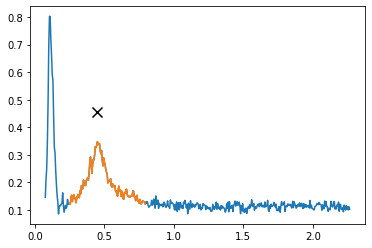

In [ ]:
k = 300
pwidth = 10
band = [0.25,0.8]

e1,e2 = np.abs(band[0] - e_axis).argmin(), np.abs(band[1] - e_axis).argmin()
plt.plot(e_axis,targets[k], zorder=0)
plt.plot(e_axis[e1:e2], targets[k][e1:e2],zorder = 1)

peak_data = find_peaks(targets[k][e1:e2], width=pwidth)
try:
    peak_pos, peak_int = peak_data[0][0], peak_data[1]['prominences'][0]
except IndexError:
    peak_pos_ = band[1] - band[0]
    peak_pos = np.abs(peak_pos_ - e_axis).argmin()
    peak_int = 0
print(peak_pos, peak_int)

# For plotting
offset = band[0] - e_axis.min()
cor_pos = np.abs(e_axis[peak_pos] + offset - e_axis).argmin()
plt.scatter(e_axis[cor_pos], peak_int*2, marker = 'x', s = 100, c='k', zorder = 2)

array([], dtype=float64)

Same but for all the data:

In [ ]:
pwidth = 10
band = [0.25,0.8]
e1,e2 = np.abs(band[0] - e_axis).argmin(), np.abs(band[1] - e_axis).argmin()
k = 0
peaks_all, features_all, indices_all = [], [], []
for i, t in enumerate(targets):
    peak = find_peaks(t[e1:e2], width=pwidth)[1]["prominences"]
    if len(peak) == 0:
        peak = [0,0]

        # continue
    peaks_all.append(np.array([peak[0]]) if len(peak) > 1 else peak)
    features_all.append(features[i])
    indices_all.append(indices[i])
peaks_all = np.concatenate(peaks_all)
features_all = np.array(features_all)
indices_all = np.array(indices_all)

Plot the scalarized target values for each feature coordinate:

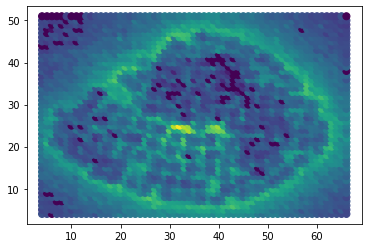

In [ ]:
plt.scatter(indices_all[:, 1], indices_all[:, 0], c=peaks_all, s = 50)

In [ ]:
from scipy.signal import find_peaks

85 0


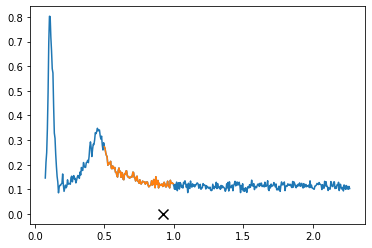

In [ ]:
k = 300
pwidth = 10
band = [0.5,1]

e1,e2 = np.abs(band[0] - e_axis).argmin(), np.abs(band[1] - e_axis).argmin()
plt.plot(e_axis,targets[k], zorder=0)
plt.plot(e_axis[e1:e2], targets[k][e1:e2],zorder = 1)

peak_data = find_peaks(targets[k][e1:e2], width=pwidth)
try:
    peak_pos, peak_int = peak_data[0][0], peak_data[1]['prominences'][0]
except IndexError:
    peak_pos_ = band[1] - band[0]
    peak_pos = np.abs(peak_pos_ - e_axis).argmin()
    peak_int = 0
print(peak_pos, peak_int)

# For plotting
offset = band[0] - e_axis.min()
cor_pos = np.abs(e_axis[peak_pos] + offset - e_axis).argmin()
plt.scatter(e_axis[cor_pos], peak_int*2, marker = 'x', s = 100, c='k', zorder = 2)

array([], dtype=float64)

Same but for all the data:

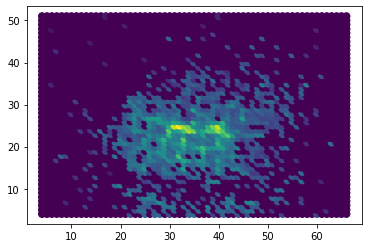

In [ ]:
pwidth = 10
band = [0.4,0.8]
e1,e2 = np.abs(band[0] - e_axis).argmin(), np.abs(band[1] - e_axis).argmin()
k = 0
peaks_all, features_all, indices_all = [], [], []
for i, t in enumerate(targets):
    peak = find_peaks(t[e1:e2], width=pwidth)[1]["prominences"]
    if len(peak) == 0:
        peak = [0,0]

        # continue
    peaks_all.append(np.array([peak[0]]) if len(peak) > 1 else peak)
    features_all.append(features[i])
    indices_all.append(indices[i])
peaks_all = np.concatenate(peaks_all)
features_all = np.array(features_all)
indices_all = np.array(indices_all)

plt.scatter(indices_all[:, 1], indices_all[:, 0], c=peaks_all, s = 50)